In [614]:
using DifferentialEquations # : ODEProblem, solve
using DataFrames: DataFrame
using CSV: File as CSVFile

In [615]:
using Plots
using BenchmarkTools

In [616]:
dirname_model = "../src/model_ctypes/ina_pipette/"

filename_legend_constants = Base.Filesystem.joinpath(dirname_model, "legend_constants_v2.csv")
filename_legend_states = Base.Filesystem.joinpath(dirname_model, "legend_states.csv")
filename_protocol = Base.Filesystem.joinpath("../data/protocols/protocol_sparse.csv");

In [617]:
legend_states = DataFrame(CSVFile(filename_legend_states))
legend_constants = DataFrame(CSVFile(filename_legend_constants))
protocol = DataFrame(CSVFile(filename_protocol));

In [618]:
function find_step(t, protocol)
    index = findfirst(x -> x >= t, protocol.t)
    v = protocol.v[index]
end

find_step (generic function with 1 method)

# Define model

In [619]:
function f_tau_m(v_m, p)
    tau_m = 1 / (p.a0_m * exp(v_m / p.s_m) + p.b0_m * exp(-v_m / p.delta_m))
    return tau_m
end

function f_tau_h(v_m, p)
    tau_h = 1 / (p.a0_h * exp(-v_m / p.s_h) + p.b0_h * exp(v_m / p.delta_h))
    return tau_h
end

function f_tau_j(v_m, p)
    tau_j = p.tau_j_const + 1 / (p.a0_j * exp(-v_m / p.s_j) + p.b0_j * exp(v_m / p.delta_j))
    return tau_j
end

function f_m_inf(v_m, p)
    m_inf = 1 / (1 + exp(-(p.v_half_m + v_m) / p.k_m))
    return m_inf
end

function f_h_inf(v_m, p)
    h_inf = 1 / (1 + exp((p.v_half_h + v_m) / p.k_h))
    return h_inf
end



f_h_inf (generic function with 1 method)

In [620]:
function f_I_leak(v_m, p)
    I_leak = p.g_leak * v_m
    return I_leak
end

function f_I_Na(v_m, m, h, j, p)
    I_Na = p.g_max * h * m^3 * j * (v_m - p.v_rev)
    return I_Na
end

function f_I_c(v_m, v_p, I_leak, I_Na, p)
    I_c = 1e9 * p.c_m * dv_m(v_m, v_p, I_leak, I_Na, p)
    return I_c
end

function f_I_p(v_cp, v_p, p)
    I_p = 1e9 * p.c_p * dv_p(v_cp, v_p, p)
    return I_p
end

function f_I_comp(v_c, v_comp, p)
    I_comp = 1e9 * p.x_c_comp * p.c_m * dv_comp(v_c,v_comp, p)
end

function f_v_cp(v_c, v_comp, p)
    v_cp = v_c + (v_c - v_comp) * (1 / (1 - p.alpha) - 1)
    return v_cp
end



f_v_cp (generic function with 1 method)

In [621]:
function dv_comp(v_c,v_comp, p)
    d_v_comp = (v_c - v_comp) / (p.x_c_comp * p.c_m * p.x_r_comp * p.R * (1 - p.alpha)) 
    return d_v_comp
end

function dv_p(v_cp, v_p, p)
    d_v_p = (v_cp - v_p) / (p.c_p * p.R_f)
    return d_v_p
end

function dv_m(v_m, v_p, I_leak, I_Na, p)
    d_v_m = (v_p + p.v_off - v_m) / (p.R * p.c_m) - (1e-9) * (I_leak + I_Na) / p.c_m
    return d_v_m
end

function dm_dh(m_h_inf, m_h, tau_m_h)
    d_m_h = (m_h_inf - m_h) / tau_m_h 
    return d_m_h
end
function dI_out(I_in, I_out, p)
    I_out = (I_in - I_out) / p.tau_z 
    return I_out
end

dI_out (generic function with 1 method)

In [622]:
function compute_algebraic(du, u, p, t)
    
    v_comp, v_p, v_m, m, h, j, I_out = u
    
    v_c = p.v_c  # find_step(t)
    
    tau_m = f_tau_m(v_m, p)
    tau_h = f_tau_h(v_m, p)
    tau_j = f_tau_j(v_m, p)
    
    m_inf = f_m_inf(v_m, p)
    h_inf = f_h_inf(v_m, p)
    
    v_cp = f_v_cp(v_c, v_comp, p)

    I_leak = f_I_leak(v_m, p)
    I_Na = f_I_Na(v_m, m, h, j, p)
    #I_c = f_I_c(v_m, v_p, I_leak, I_Na,  p)
    I_c = f_I_c(v_m, v_cp, I_leak, I_Na,  p)
    #I_p = f_I_p(v_cp, v_p, p)
    I_comp = f_I_comp(v_c, v_comp, p)
    
    I_in = I_leak + I_Na + I_c - I_comp # + I_p
    
    a = (tau_m=tau_m, tau_h=tau_h, tau_j=tau_j,
         m_inf=m_inf, h_inf=h_inf,
         v_cp=v_cp, I_leak=I_leak, I_Na=I_Na, I_c=I_c, I_comp=I_comp, I_in=I_in,
         v_c=v_c,# I_p=I_p,
    )
    
    return a
end

compute_algebraic (generic function with 1 method)

In [623]:
function compute_rates!(du, u, p, t)
    p = p["C"]
    v_comp, v_p, v_m, m, h, j, I_out = u
    
    a = compute_algebraic(du, u, p, t)
    
    du[1] = dv_comp(a.v_c,v_comp, p)  # v_comp
    du[2] = dv_p(a.v_cp, v_p, p)  # v_p
    du[3] = dv_m(v_m, v_p, a.I_leak, a.I_Na, p)  # v_m
        
    du[4] = dm_dh(a.m_inf , m, a.tau_m)  # m
    du[5] = dm_dh(a.h_inf , h, a.tau_h)  # h
    du[6] = dm_dh(a.h_inf , j, a.tau_j)  # j
        
    du[7] = dI_out(a.I_in, I_out, p)     # I_out
    
    nothing
end

compute_rates! (generic function with 1 method)

In [624]:
function create_p_from_legend(legend)
    p = collect(zip(Symbol.(legend[!, :name]), legend[!, :value]))
    p = NamedTuple(p)
end

create_p_from_legend (generic function with 1 method)

# Callbacks

In [778]:
function change_step!(integrator)
    t = integrator.t
    v_c = find_step(t, protocol)
    p = integrator.p["C"]
    k, v = keys(p), collect(values(p))
    v[end] = v_c
    p = NamedTuple(collect(zip(k, v)))
    integrator.p["C"] = p
    set_proposed_dt!(integrator, 1e-9)
    nothing
end


function change_state!(integrator)
    integrator.u = integrator.p["u_equilibrium"]
    nothing 
end
time_trace = [0.25*k for k in 0:20]
cb_step  = PresetTimeCallback(protocol.t, change_step!, save_positions=(false, false));
cb_state = PresetTimeCallback(time_trace, change_state!, save_positions=(false, false));
cb_set = CallbackSet(cb_step, cb_state);

In [779]:
func = ODEFunction(compute_rates!, syms=[:I_out])

(::ODEFunction{true, typeof(compute_rates!), LinearAlgebra.UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Vector{Symbol}, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED), Nothing}) (generic function with 7 methods)

In [780]:
u₀ = [-80.0, -80.0, -80.0, 0.0, 1.0, 1.0, 0.0]
tspan = (0., 5.)
tspan_initial = (0., 2.)
p = Dict("C" => create_p_from_legend(legend_constants))
prob_initial = ODEProblem(func, u₀, tspan_initial, p,);

In [781]:
saveat = 0: 5e-3: 2
reltol = 1e-3
abstol = 1e-3
sol_initial = solve(prob_initial, alg=Rodas4(), reltol=reltol, abstol=abstol, );

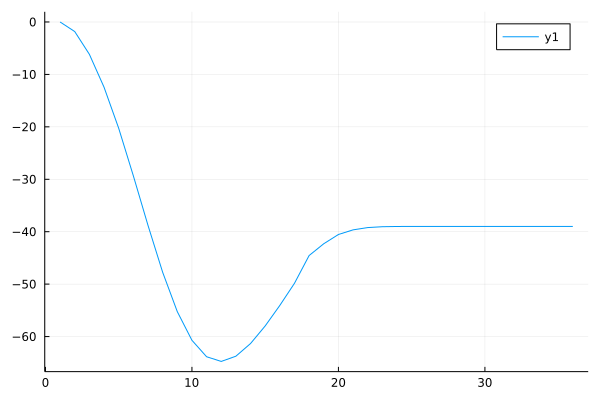

In [782]:
u = sol_initial.u
plot([v[7] for v in u])

In [783]:
u0 = sol_initial.u[end]
prob = ODEProblem(func, u0, tspan, p,
                  callback=cb);

In [784]:
saveat = 0: 5e-5: 5
reltol = 1e-3
abstol = 1e-3

sol = solve(prob, alg=Rodas4(), reltol=reltol, abstol=abstol, saveat=saveat, save_idxs=[7]);

LoadError: MethodError: [0mCannot `convert` an object of type [92mFloat64[39m[0m to an object of type [91mNamedTuple{(:c_p, :c_m, :a0_m, :b0_m, :delta_m, :s_m, :a0_h, :b0_h, :delta_h, :s_h, :a0_j, :b0_j, :delta_j, :s_j, :tau_j_const, :R, :R_f, :g_max, :g_leak, :tau_z, :v_half_m, :v_half_h, :k_m, :k_h, :x_c_comp, :x_r_comp, :alpha, :v_off, :v_rev, :v_c), NTuple{30, Float64}}[39m
[0mClosest candidates are:
[0m  convert(::Type{T}, [91m::DomainSets.DomainPoint[39m) where T at /home/nik/.julia/packages/DomainSets/Qqvhf/src/applications/coordinates.jl:7
[0m  convert(::Type{var"#s16"} where var"#s16"<:Union{Number, T}, [91m::MultivariatePolynomials.AbstractPolynomialLike{T}[39m) where T at /home/nik/.julia/packages/MultivariatePolynomials/vqcb5/src/conversion.jl:65
[0m  convert(::Type{NamedTuple{names, T}}, [91m::NamedTuple{names, T}[39m) where {names, T<:Tuple} at namedtuple.jl:127
[0m  ...

In [786]:
@benchmark solve(prob, alg=Rodas4(), reltol=reltol, abstol=abstol, saveat=saveat, save_idxs=[7])

LoadError: MethodError: [0mCannot `convert` an object of type [92mFloat64[39m[0m to an object of type [91mNamedTuple{(:c_p, :c_m, :a0_m, :b0_m, :delta_m, :s_m, :a0_h, :b0_h, :delta_h, :s_h, :a0_j, :b0_j, :delta_j, :s_j, :tau_j_const, :R, :R_f, :g_max, :g_leak, :tau_z, :v_half_m, :v_half_h, :k_m, :k_h, :x_c_comp, :x_r_comp, :alpha, :v_off, :v_rev, :v_c), NTuple{30, Float64}}[39m
[0mClosest candidates are:
[0m  convert(::Type{T}, [91m::DomainSets.DomainPoint[39m) where T at /home/nik/.julia/packages/DomainSets/Qqvhf/src/applications/coordinates.jl:7
[0m  convert(::Type{var"#s16"} where var"#s16"<:Union{Number, T}, [91m::MultivariatePolynomials.AbstractPolynomialLike{T}[39m) where T at /home/nik/.julia/packages/MultivariatePolynomials/vqcb5/src/conversion.jl:65
[0m  convert(::Type{NamedTuple{names, T}}, [91m::NamedTuple{names, T}[39m) where {names, T<:Tuple} at namedtuple.jl:127
[0m  ...

In [788]:
length(sol.t)

100001

# BlackBox

In [789]:
using BlackBoxOptim

In [790]:
data = deepcopy(vcat(sol.u...));

In [791]:
function loss(data, sol)
    u = vcat(sol.u...)
    return √(mean((data .- u).^2))
end

loss (generic function with 1 method)

true

In [875]:
function fitness(x)
    sol = calculate_solution(x);
    if sol.retcode ≠ :Success
        return Inf
    end
    fit = loss(data, sol)
    return fit
end
    

fitness (generic function with 1 method)

In [869]:
fitness(x0)

65.18213443123824

In [870]:
prob = ODEProblem(func, u₀, tspan, p,
                  callback=cb);

In [895]:
function calculate_solution(x)
    
    v_rev = 18.0
    v_c = -80.0
    
    u₀ = [-80.0, -80.0, -80.0, 0.0, 1.0, 1.0, 0.0]
    tspan = (0., 5.)
    tspan_initial = (0., 2.)
    
    p_vec = vcat(x, [v_rev, v_c])

    C = create_p_from_legend(legend_constants)
    C = collect(zip(keys(C), p_vec))
    C = NamedTuple(C)
    
    p0 = Dict("C" => C)
    
    prob_initial = ODEProblem(func, u₀, tspan_initial, p0,);
    sol_initial = solve(prob_initial, alg=Rodas4(), reltol=reltol, abstol=abstol, );
    
    u_equilibrium = sol_initial.u[end]
    
    p = Dict("C" => C, "u_equilibrium" => u_equilibrium)
    
    prob = ODEProblem(func, u_equilibrium, tspan, p, callback=cb_set)
    #prob = ODEProblem(func, u_equilibrium, tspan, p, callback=cb_step)
    solver_kwargs = (reltol=reltol, abstol=abstol, saveat=saveat,
                     save_idxs=[7],
                     )

    sol = solve(prob, alg=Rodas5(); solver_kwargs...);
    
end

calculate_solution (generic function with 1 method)

In [796]:
function my_model(x)
    
    sol = calculate_solution(x)
    
    if length(sol) ≠ length(data)
        return Inf
    end
    
    loss(data, sol)
    
end

my_model (generic function with 1 method)

In [797]:
p_vec = collect(values(p))

1-element Vector{NamedTuple{(:c_p, :c_m, :a0_m, :b0_m, :delta_m, :s_m, :a0_h, :b0_h, :delta_h, :s_h, :a0_j, :b0_j, :delta_j, :s_j, :tau_j_const, :R, :R_f, :g_max, :g_leak, :tau_z, :v_half_m, :v_half_h, :k_m, :k_h, :x_c_comp, :x_r_comp, :alpha, :v_off, :v_rev, :v_c), NTuple{30, Float64}}}:
 (c_p = 4.502963e-12, c_m = 2.473016e-11, a0_m = 16529.06, b0_m = 386.7, delta_m = 22.823, s_m = 12.8321, a0_h = 6.26, b0_h = 58131.407, delta_h = 10.27583, s_h = 21.62, a0_j = 0.6462, b0_j = 11358.31, delta_j = 7.445, s_j = 69.417, tau_j_const = 0.00132, R = 2.494677e7, R_f = 326421.4, g_max = 8392.4, g_leak = 0.4812443, tau_z = 0.000100034, v_half_m = 28.35802, v_half_h = 59.69117, k_m = 7.66677, k_h = 5.507771, x_c_comp = 0.01, x_r_comp = 0.2, alpha = 0.75, v_off = -2.0, v_rev = 18.0, v_c = -80.0)

In [798]:
bounds = collect(zip(legend_constants.bound_1, legend_constants.bound_2))[1: end-2];

In [799]:
res = bboptimize(my_model; SearchRange=bounds, MaxTime=10., PopulationSize=256)

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
0.87 secs, 4 evals, 2 steps, improv/step: 1.000 (last = 1.0000), fitness=108.874716399


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


1.58 secs, 8 evals, 4 steps, improv/step: 0.750 (last = 0.5000), fitness=100.354368222
2.48 secs, 12 evals, 6 steps, improv/step: 0.667 (last = 0.5000), fitness=65.182134431
3.44 secs, 16 evals, 8 steps, improv/step: 0.625 (last = 0.5000), fitness=65.182134431
4.31 secs, 20 evals, 10 steps, improv/step: 0.500 (last = 0.0000), fitness=65.182134431
5.14 secs, 24 evals, 12 steps, improv/step: 0.583 (last = 1.0000), fitness=65.182134431
5.97 secs, 28 evals, 14 steps, improv/step: 0.571 (last = 0.5000), fitness=65.182134431
6.81 secs, 32 evals, 16 steps, improv/step: 0.500 (last = 0.0000), fitness=65.182134431
7.61 secs, 36 evals, 18 steps, improv/step: 0.556 (last = 1.0000), fitness=65.182134431
8.56 secs, 40 evals, 20 steps, improv/step: 0.550 (last = 0.5000), fitness=65.182134431
9.41 secs, 44 evals, 22 steps, improv/step: 0.591 (last = 1.0000), fitness=65.182134431

Optimization stopped after 24 steps and 10.27 seconds
Termination reason: Max time (10.0 s) reached
Steps per second = 2.3

BlackBoxOptim.OptimizationResults("adaptive_de_rand_1_bin_radiuslimited", "Max time (10.0 s) reached", 24, 1.631035277341309e9, 10.267313003540039, ParamsDictChain[ParamsDictChain[Dict{Symbol, Any}(:RngSeed => 906538, :MaxTime => 10.0, :SearchRange => [(1.0e-14, 5.0e-12), (1.0e-11, 9.0e-11), (10000.0, 100000.0), (100.0, 1000.0), (1.0, 100.0), (1.0, 100.0), (1.0, 100.0), (10000.0, 100000.0), (1.0, 100.0), (1.0, 100.0)  …  (0.01, 1.0), (1.0e-5, 0.001), (10.0, 60.0), (50.0, 100.0), (1.0, 10.0), (1.0, 10.0), (0.01, 1.1), (0.01, 1.1), (0.7, 0.8), (-15.0, 15.0)], :MaxFuncEvals => 0, :MaxSteps => 0, :PopulationSize => 256),Dict{Symbol, Any}()],Dict{Symbol, Any}(:CallbackInterval => -1.0, :TargetFitness => nothing, :TraceMode => :compact, :FitnessScheme => ScalarFitnessScheme{true}(), :MinDeltaFitnessTolerance => 1.0e-50, :NumDimensions => :NotSpecified, :FitnessTolerance => 1.0e-8, :TraceInterval => 0.5, :MaxStepsWithoutProgress => 10000, :MaxSteps => 10000…)], 48, ScalarFitnessScheme{true}()

In [800]:
p_best = best_candidate(res)


28-element Vector{Float64}:
      2.8869205971261483e-12
      1.438198516738532e-11
  91428.56006049155
    332.60692169786716
     78.39766360291053
     56.61621704772008
     24.096580759964056
  56834.110946295674
     80.04472271480932
     27.658146632014923
      0.9524352724205547
  41726.88115007209
     76.02097012614982
      ⋮
 388406.7860188455
   8859.424201258094
      0.5838984382725436
      2.414997864632696e-5
     48.449618769802164
     77.46148031700082
      1.1900166261615972
      6.990054748391543
      0.20020241562409166
      0.37358978922515007
      0.7869313916158587
      0.46857071326030564

In [801]:
sol_best = calculate_solution(p_best);

In [813]:
dat = reshape(data[1:100000], 5000,20);

In [814]:
solbest = reshape(sol_best[1:100000], 5000,20);

In [815]:
t = sol_best.t[1:5000];

In [816]:
plot(t,dat, layout = 20, link = :x)
plot!(t,solbest, layout = 20, legend = false , size = (1000,1000))
#plot!(t,solbest1, layout = 20, legend = false , size = (1000,1000))
plot!(xlim=(0.1, 0.15),
      #ylim=(-20, 0),
     )

In [811]:
loss(data, sol_best)

65.18213443123824

In [876]:
using CMAEvolutionStrategy

In [877]:
x0 = best_candidate(res);

In [881]:
result = minimize(fitness, x0, 1., maxiter=10)

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


(6_w,13)-aCMA-ES (mu_w=4.0,w_1=38%) in dimension 28 (seed=5080745481132779166, 2021-09-07T21:04:55.444)
  iter   fevals   function value      sigma  axis ratio   time[s]
     1       13   3.37870971e+03   9.52e-01   1.081e+00     1.537


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


     2       26   4.10201401e+02   9.40e-01   1.109e+00     3.183


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


     3       39   1.53670735e+02   9.40e-01   1.131e+00     4.868


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


     5       65   1.33076180e+02   9.81e-01   1.199e+00     7.999
     7       91   1.53893235e+02   9.96e-01   1.240e+00    11.414


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


     9      117   1.25137261e+02   1.03e+00   1.280e+00    14.420


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


    10      130   1.17982236e+02   1.02e+00   1.297e+00    15.952
(6_w,13)-aCMA-ES (mu_w=4.0,w_1=38%) in dimension 28 (seed=5080745481132779166, 2021-09-07T21:05:10.291)
  termination reason: maxiter = 10 (2021-09-07T21:05:10.291)
  lowest observed function value: 103.76967048606248 at [-2.0144153898152455, -1.2751079905314575, 91425.09286778817, 331.58259343337653, 77.42928188687725, 59.55699739257588, 24.93703475057725, 56833.4160153927, 80.8729748850833, 26.251511003163376, -0.3057449008602744, 41728.310963763695, 74.11600641642447, 48.17387419815394, -1.2528758683839751, 6.733204910223961e7, 388409.4268669959, 8860.3538446562, -1.513464475194526, 2.927076727481654, 51.22212248898281, 76.11666510269866, 4.154514036917713, 7.3799507313946275, 2.02494341272513, 1.0491688507892414, -0.3016667410099399, -1.5742180025762824]

Optimizer{Parameters,BasicLogger,Stop}



  population mean: [-1.6457612246510607, -0.3416693161823706, 91424.95370648726, 331.81341604225946, 78.12716907032917, 58.278091800379045, 25.07196436832019, 56833.36031324694, 81.2253595490911, 26.67910064593451, 0.20278790607104902, 41729.37711160615, 74.70847166156274, 48.35203720604804, -0.6600137955205756, 6.733204877797306e7, 388409.00211701274, 8859.693151690142, -1.4900412048200056, 4.2149692485666375, 50.27645260512122, 77.13333165545926, 2.8424354491089363, 6.98778413020284, 0.7576957262021577, 0.9947441454087834, -0.09750667631812115, -0.6863027884030137]


In [904]:
ptest = xbest(result)

28-element Vector{Float64}:
     -2.0144153898152455
     -1.2751079905314575
  91425.09286778817
    331.58259343337653
     77.42928188687725
     59.55699739257588
     24.93703475057725
  56833.4160153927
     80.8729748850833
     26.251511003163376
     -0.3057449008602744
  41728.310963763695
     74.11600641642447
      ⋮
 388409.4268669959
   8860.3538446562
     -1.513464475194526
      2.927076727481654
     51.22212248898281
     76.11666510269866
      4.154514036917713
      7.3799507313946275
      2.02494341272513
      1.0491688507892414
     -0.3016667410099399
     -1.5742180025762824

In [905]:
sol_best = calculate_solution(ptest);
solbest = reshape(sol_best[1:100000], 5000,20);

In [908]:
plot(t,dat, layout = 20, link = :x)
plot!(t,solbest, layout = 20, legend = false , size = (1000,1000))
#plot!(t,solbest1, layout = 20, legend = false , size = (1000,1000))
plot!(xlim=(0.1, 0.15),
      #ylim=(-20, 0),
     )

In [810]:
plot(sol_best)
plot!(sol_best.t, data)
#plot!(xlim=(2.6, 2.63764),
      # ylim=(-200, 100))
#   )

In [40]:
Dict(zip(keys(p), p_best))

Dict{Symbol, Float64} with 28 entries:
  :alpha       => 0.792706
  :x_c_comp    => 0.499414
  :k_m         => 6.50783
  :a0_j        => 0.75511
  :c_m         => 2.25594e-11
  :x_r_comp    => 0.817074
  :g_max       => 7365.14
  :delta_j     => 79.0557
  :delta_h     => 68.2974
  :tau_z       => 0.000616258
  :b0_h        => 19642.7
  :v_half_h    => 73.5803
  :a0_m        => 97831.4
  :s_j         => 87.5223
  :delta_m     => 18.2841
  :R           => 5.94735e7
  :v_half_m    => 30.1399
  :s_m         => 22.1881
  :a0_h        => 2.55696
  :s_h         => 39.7405
  :R_f         => 9.14288e5
  :tau_j_const => 0.00225564
  :k_h         => 9.95174
  :v_off       => 12.8257
  :b0_m        => 625.636
  ⋮            => ⋮

In [41]:
res.archive_output

BlackBoxOptim.TopListArchiveOutput{Float64, Vector{Float64}}(95.07432465318833, [4.758544027517027e-12, 2.2559376731624274e-11, 97831.40817581055, 625.6362167308528, 18.28411167123312, 22.188144325830397, 2.5569589619591655, 19642.70982117056, 68.29740672072315, 39.740483156770004  …  0.8283974389362104, 0.0006162575181207741, 30.13985875521219, 73.58030538490848, 6.507829529638104, 9.951741453997288, 0.49941441922841573, 0.8170741951832056, 0.7927059490800641, 12.825656535850438])

In [23]:
res_1 = compare_optimizers(my_model; SearchRange = bounds, MaxTime = 600.0);

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, SimpleSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


0.66 secs, 4 evals, 2 steps, improv/step: 1.000 (last = 1.0000), fitness=91.057747742
1.35 secs, 10 evals, 5 steps, improv/step: 0.800 (last = 0.6667), fitness=81.965875879
1.87 secs, 16 evals, 8 steps, improv/step: 0.875 (last = 1.0000), fitness=81.965875879
2.39 secs, 22 evals, 11 steps, improv/step: 0.727 (last = 0.3333), fitness=81.965875879
3.05 secs, 30 evals, 15 steps, improv/step: 0.600 (last = 0.2500), fitness=81.965875879


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


3.62 secs, 38 evals, 19 steps, improv/step: 0.632 (last = 0.7500), fitness=67.535683542
4.17 secs, 45 evals, 24 steps, improv/step: 0.583 (last = 0.4000), fitness=67.535683542
4.68 secs, 51 evals, 27 steps, improv/step: 0.556 (last = 0.3333), fitness=67.535683542
5.23 secs, 58 evals, 31 steps, improv/step: 0.581 (last = 0.7500), fitness=67.535683542
5.74 secs, 65 evals, 35 steps, improv/step: 0.543 (last = 0.2500), fitness=67.535683542
6.33 secs, 72 evals, 39 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.487 (last = 0.0000), fitness=67.535683542
6.95 secs, 80 evals, 44 steps, improv/step: 0.545 (last = 1.0000), fitness=67.535683542
7.61 secs, 88 evals, 49 steps, improv/step: 0.531 (last = 0.4000), fitness=67.535683542
8.16 secs, 95 evals, 54 steps, improv/step: 0.537 (last = 0.6000), fitness=51.533190573
8.82 secs, 103 evals, 59 steps, improv/step: 0.525 (last = 0.4000), fitness=51.533190573


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


9.33 secs, 110 evals, 63 steps, improv/step: 0.524 (last = 0.5000), fitness=51.533190573
9.89 secs, 117 evals, 69 steps, improv/step: 0.522 (last = 0.5000), fitness=51.533190573
10.40 secs, 123 evals, 73 steps, improv/step: 0.507 (last = 0.2500), fitness=51.533190573


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


10.95 secs, 130 evals, 79 steps, improv/step: 0.506 (last = 0.5000), fitness=51.533190573
11.49 secs, 137 evals, 84 steps, improv/step: 0.500 (last = 0.4000), fitness=51.533190573
12.07 secs, 144 evals, 90 steps, improv/step: 0.478 (last = 0.1667), fitness=51.533190573
12.61 secs, 151 evals, 96 steps, improv/step: 0.458 (last = 0.1667), fitness=51.533190573
13.16 secs, 158 evals, 102 steps, improv/step: 0.451 (last = 0.3333), fitness=51.533190573
13.66 secs, 164 evals, 107 steps, improv/step: 0.458 (last = 0.6000), fitness=51.533190573


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


14.22 secs, 172 evals, 114 steps, improv/step: 0.447 (last = 0.2857), fitness=51.533190573
14.89 secs, 180 evals, 119 steps, improv/step: 0.437 (last = 0.2000), fitness=51.533190573
15.51 secs, 188 evals, 124 steps, improv/step: 0.444 (last = 0.6000), fitness=51.533190573
16.17 secs, 196 evals, 129 steps, improv/step: 0.442 (last = 0.4000), fitness=51.533190573
16.71 secs, 203 evals, 135 steps, improv/step: 0.444 (last = 0.5000), fitness=51.533190573
17.28 secs, 210 evals, 140 steps, improv/step: 0.450 (last = 0.6000), fitness=51.533190573


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


17.84 secs, 217 evals, 147 steps, improv/step: 0.429 (last = 0.0000), fitness=51.533190573
18.41 secs, 224 evals, 154 steps, improv/step: 0.429 (last = 0.4286), fitness=51.533190573
18.93 secs, 230 evals, 159 steps, improv/step: 0.415 (last = 0.0000), fitness=51.533190573
19.43 secs, 236 evals, 163 steps, improv/step: 0.405 (last = 0.0000), fitness=51.533190573
19.98 secs, 243 evals, 169 steps, improv/step: 0.408 (last = 0.5000), fitness=51.533190573
20.56 secs, 250 evals, 175 steps, improv/step: 0.400 (last = 0.1667), fitness=51.533190573
21.06 secs, 256 evals, 180 steps, improv/step: 0.389 (last = 0.0000), fitness=51.533190573
21.61 secs, 263 evals, 186 steps, improv/step: 0.392 (last = 0.5000), fitness=51.533190573
22.26 secs, 271 evals, 191 steps, improv/step: 0.393 (last = 0.4000), fitness=51.533190573


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


22.80 secs, 279 evals, 198 steps, improv/step: 0.394 (last = 0.4286), fitness=51.533190573
23.41 secs, 286 evals, 203 steps, improv/step: 0.394 (last = 0.4000), fitness=51.533190573
23.96 secs, 292 evals, 209 steps, improv/step: 0.392 (last = 0.3333), fitness=51.533190573
24.50 secs, 299 evals, 214 steps, improv/step: 0.388 (last = 0.2000), fitness=51.533190573
25.07 secs, 306 evals, 220 steps, improv/step: 0.382 (last = 0.1667), fitness=51.533190573
25.75 secs, 314 evals, 226 steps, improv/step: 0.381 (last = 0.3333), fitness=48.823963386
26.30 secs, 321 evals, 232 steps, improv/step: 0.388 (last = 0.6667), fitness=48.823963386
26.89 secs, 328 evals, 237 steps, improv/step: 0.397 (last = 0.8000), fitness=48.823963386
27.44 secs, 335 evals, 242 steps, improv/step: 0.393 (last = 0.2000), fitness=48.823963386
27.99 secs, 342 evals, 249 steps, improv/step: 0.390 (last = 0.2857), fitness=48.823963386
28.55 secs, 349 evals, 256 steps, improv/step: 0.391 (last = 0.4286), fitness=48.823963386

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


29.71 secs, 363 evals, 270 steps, improv/step: 0.389 (last = 0.2857), fitness=48.823963386
30.26 secs, 370 evals, 277 steps, improv/step: 0.390 (last = 0.4286), fitness=48.823963386
30.83 secs, 377 evals, 284 steps, improv/step: 0.387 (last = 0.2857), fitness=48.823963386
31.39 secs, 384 evals, 290 steps, improv/step: 0.383 (last = 0.1667), fitness=48.823963386
31.94 secs, 391 evals, 297 steps, improv/step: 0.377 (last = 0.1429), fitness=48.823963386
32.51 secs, 398 evals, 304 steps, improv/step: 0.375 (last = 0.2857), fitness=48.823963386
33.06 secs, 405 evals, 311 steps, improv/step: 0.373 (last = 0.2857), fitness=48.823963386
33.61 secs, 412 evals, 317 steps, improv/step: 0.372 (last = 0.3333), fitness=48.823963386
34.14 secs, 418 evals, 323 steps, improv/step: 0.375 (last = 0.5000), fitness=48.823963386


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


34.71 secs, 426 evals, 330 steps, improv/step: 0.367 (last = 0.0000), fitness=48.823963386
35.38 secs, 434 evals, 336 steps, improv/step: 0.363 (last = 0.1667), fitness=48.823963386
35.92 secs, 441 evals, 342 steps, improv/step: 0.368 (last = 0.6667), fitness=47.842761856
36.46 secs, 448 evals, 349 steps, improv/step: 0.370 (last = 0.4286), fitness=47.842761856
36.97 secs, 454 evals, 355 steps, improv/step: 0.363 (last = 0.0000), fitness=47.842761856
37.51 secs, 461 evals, 362 steps, improv/step: 0.362 (last = 0.2857), fitness=47.842761856
38.06 secs, 468 evals, 369 steps, improv/step: 0.363 (last = 0.4286), fitness=47.842761856
38.64 secs, 475 evals, 376 steps, improv/step: 0.356 (last = 0.0000), fitness=47.842761856
39.19 secs, 482 evals, 383 steps, improv/step: 0.355 (last = 0.2857), fitness=47.842761856
39.74 secs, 489 evals, 390 steps, improv/step: 0.354 (last = 0.2857), fitness=47.842761856
40.24 secs, 495 evals, 396 steps, improv/step: 0.348 (last = 0.0000), fitness=47.842761856

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


60.01 secs, 740 evals, 629 steps, improv/step: 0.334 (last = 0.0000), fitness=47.315126423
60.56 secs, 747 evals, 636 steps, improv/step: 0.333 (last = 0.2857), fitness=47.315126423


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


61.14 secs, 755 evals, 644 steps, improv/step: 0.334 (last = 0.3750), fitness=47.315126423
61.64 secs, 761 evals, 650 steps, improv/step: 0.335 (last = 0.5000), fitness=46.144254294
62.19 secs, 768 evals, 657 steps, improv/step: 0.335 (last = 0.2857), fitness=46.144254294
62.74 secs, 775 evals, 663 steps, improv/step: 0.336 (last = 0.5000), fitness=46.102713738
63.24 secs, 781 evals, 669 steps, improv/step: 0.336 (last = 0.3333), fitness=45.922716090
63.79 secs, 788 evals, 676 steps, improv/step: 0.336 (last = 0.2857), fitness=45.922716090
64.29 secs, 795 evals, 683 steps, improv/step: 0.337 (last = 0.4286), fitness=45.922716090
64.88 secs, 802 evals, 690 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.336 (last = 0.2857), fitness=45.922716090
65.43 secs, 809 evals, 696 steps, improv/step: 0.335 (last = 0.1667), fitness=45.922716090
65.96 secs, 815 evals, 702 steps, improv/step: 0.333 (last = 0.1667), fitness=45.922716090
66.46 secs, 821 evals, 708 steps, improv/step: 0.335 (last = 0.5000), fitness=38.033930795
66.96 secs, 827 evals, 714 steps, improv/step: 0.336 (last = 0.5000), fitness=38.033930795
67.50 secs, 834 evals, 721 steps, improv/step: 0.333 (last = 0.0000), fitness=38.033930795


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


68.10 secs, 842 evals, 729 steps, improv/step: 0.329 (last = 0.0000), fitness=38.033930795
68.65 secs, 849 evals, 736 steps, improv/step: 0.327 (last = 0.1429), fitness=38.033930795
69.27 secs, 857 evals, 743 steps, improv/step: 0.327 (last = 0.2857), fitness=36.623424511
69.78 secs, 863 evals, 749 steps, improv/step: 0.328 (last = 0.5000), fitness=36.623424511
70.34 secs, 870 evals, 756 steps, improv/step: 0.329 (last = 0.4286), fitness=32.763745974
70.85 secs, 876 evals, 762 steps, improv/step: 0.331 (last = 0.5000), fitness=32.763745974
71.44 secs, 883 evals, 769 steps, improv/step: 0.330 (last = 0.2857), fitness=32.763745974
71.99 secs, 890 evals, 776 steps, improv/step: 0.329 (last = 0.1429), fitness=32.763745974
72.54 secs, 897 evals, 783 steps, improv/step: 0.328 (last = 0.2857), fitness=32.763745974
73.11 secs, 904 evals, 790 steps, improv/step: 0.329 (last = 0.4286), fitness=32.763745974
73.66 secs, 911 evals, 797 steps, improv/step: 0.330 (last = 0.4286), fitness=29.837536868

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


77.45 secs, 958 evals, 844 steps, improv/step: 0.328 (last = 0.0000), fitness=18.478802335
77.99 secs, 965 evals, 851 steps, improv/step: 0.327 (last = 0.1429), fitness=18.478802335
78.55 secs, 972 evals, 858 steps, improv/step: 0.325 (last = 0.1429), fitness=18.478802335
79.13 secs, 979 evals, 865 steps, improv/step: 0.325 (last = 0.2857), fitness=18.478802335
79.68 secs, 986 evals, 872 steps, improv/step: 0.323 (last = 0.1429), fitness=18.478802335
80.24 secs, 993 evals, 879 steps, improv/step: 0.322 (last = 0.1429), fitness=18.478802335
80.75 secs, 999 evals, 885 steps, improv/step: 0.323 (last = 0.5000), fitness=18.478802335
81.30 secs, 1006 evals, 892 steps, improv/step: 0.323 (last = 0.2857), fitness=18.478802335
81.86 secs, 1013 evals, 899 steps, improv/step: 0.324 (last = 0.4286), fitness=18.478802335
82.36 secs, 1019 evals, 905 steps, improv/step: 0.326 (last = 0.6667), fitness=18.478802335
82.90 secs, 1026 evals, 912 steps, improv/step: 0.325 (last = 0.1429), fitness=18.47880

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


112.89 secs, 1394 evals, 1280 steps, improv/step: 0.320 (last = 0.1429), fitness=16.839632872
113.47 secs, 1401 evals, 1287 steps, improv/step: 0.319 (last = 0.1429), fitness=16.839632872
114.02 secs, 1408 evals, 1294 steps, improv/step: 0.319 (last = 0.2857), fitness=16.839632872
114.53 secs, 1414 evals, 1300 steps, improv/step: 0.319 (last = 0.3333), fitness=16.839632872
115.08 secs, 1421 evals, 1307 steps, improv/step: 0.318 (last = 0.1429), fitness=16.839632872


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


115.62 secs, 1428 evals, 1314 steps, improv/step: 0.320 (last = 0.5714), fitness=16.839632872
116.21 secs, 1435 evals, 1321 steps, improv/step: 0.319 (last = 0.2857), fitness=16.839632872
116.76 secs, 1442 evals, 1328 steps, improv/step: 0.319 (last = 0.2857), fitness=16.839632872
117.34 secs, 1449 evals, 1335 steps, improv/step: 0.318 (last = 0.0000), fitness=16.839632872
117.91 secs, 1456 evals, 1342 steps, improv/step: 0.317 (last = 0.1429), fitness=16.839632872
118.46 secs, 1463 evals, 1349 steps, improv/step: 0.316 (last = 0.1429), fitness=16.839632872
119.04 secs, 1470 evals, 1356 steps, improv/step: 0.316 (last = 0.4286), fitness=16.839632872
119.60 secs, 1477 evals, 1363 steps, improv/step: 0.317 (last = 0.4286), fitness=16.839632872
120.16 secs, 1484 evals, 1370 steps, improv/step: 0.317 (last = 0.2857), fitness=16.839632872
120.68 secs, 1490 evals, 1376 steps, improv/step: 0.316 (last = 0.1667), fitness=16.839632872
121.23 secs, 1497 evals, 1383 steps, improv/step: 0.316 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


147.01 secs, 1810 evals, 1696 steps, improv/step: 0.313 (last = 0.0000), fitness=15.478535748
147.57 secs, 1817 evals, 1703 steps, improv/step: 0.312 (last = 0.1429), fitness=15.478535748
148.13 secs, 1824 evals, 1710 steps, improv/step: 0.311 (last = 0.0000), fitness=15.478535748
148.63 secs, 1830 evals, 1716 steps, improv/step: 0.311 (last = 0.1667), fitness=15.478535748
149.19 secs, 1837 evals, 1723 steps, improv/step: 0.311 (last = 0.2857), fitness=15.478535748
149.75 secs, 1844 evals, 1730 steps, improv/step: 0.311 (last = 0.4286), fitness=15.478535748
150.33 secs, 1851 evals, 1737 steps, improv/step: 0.311 (last = 0.4286), fitness=15.478535748
150.88 secs, 1858 evals, 1744 steps, improv/step: 0.310 (last = 0.0000), fitness=15.478535748
151.44 secs, 1865 evals, 1751 steps, improv/step: 0.310 (last = 0.1429), fitness=15.478535748
152.01 secs, 1872 evals, 1758 steps, improv/step: 0.310 (last = 0.4286), fitness=15.478535748
152.56 secs, 1879 evals, 1765 steps, improv/step: 0.310 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


163.79 secs, 2011 evals, 1897 steps, improv/step: 0.307 (last = 0.2000), fitness=14.337499392
164.32 secs, 2015 evals, 1901 steps, improv/step: 0.307 (last = 0.0000), fitness=14.337499392
164.86 secs, 2020 evals, 1906 steps, improv/step: 0.306 (last = 0.2000), fitness=14.337499392
165.40 secs, 2025 evals, 1911 steps, improv/step: 0.306 (last = 0.2000), fitness=14.337499392
166.00 secs, 2030 evals, 1916 steps, improv/step: 0.306 (last = 0.2000), fitness=14.337499392
166.53 secs, 2033 evals, 1919 steps, improv/step: 0.305 (last = 0.0000), fitness=14.337499392
167.17 secs, 2037 evals, 1923 steps, improv/step: 0.305 (last = 0.0000), fitness=14.337499392
167.77 secs, 2041 evals, 1927 steps, improv/step: 0.304 (last = 0.0000), fitness=14.337499392
168.37 secs, 2045 evals, 1931 steps, improv/step: 0.304 (last = 0.2500), fitness=14.337499392
168.88 secs, 2049 evals, 1935 steps, improv/step: 0.304 (last = 0.2500), fitness=14.337499392
169.48 secs, 2053 evals, 1939 steps, improv/step: 0.304 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


188.19 secs, 2186 evals, 2072 steps, improv/step: 0.299 (last = 0.4000), fitness=14.337499392
188.75 secs, 2190 evals, 2076 steps, improv/step: 0.299 (last = 0.0000), fitness=14.337499392
189.26 secs, 2194 evals, 2080 steps, improv/step: 0.299 (last = 0.2500), fitness=14.337499392
189.89 secs, 2198 evals, 2084 steps, improv/step: 0.298 (last = 0.0000), fitness=14.337499392
190.45 secs, 2202 evals, 2088 steps, improv/step: 0.298 (last = 0.5000), fitness=13.063248580
191.11 secs, 2207 evals, 2093 steps, improv/step: 0.298 (last = 0.2000), fitness=13.063248580
191.75 secs, 2212 evals, 2098 steps, improv/step: 0.298 (last = 0.4000), fitness=13.063248580
192.36 secs, 2216 evals, 2102 steps, improv/step: 0.298 (last = 0.0000), fitness=13.063248580
192.91 secs, 2220 evals, 2106 steps, improv/step: 0.298 (last = 0.5000), fitness=13.063248580
193.48 secs, 2225 evals, 2111 steps, improv/step: 0.297 (last = 0.0000), fitness=13.063248580
194.02 secs, 2229 evals, 2115 steps, improv/step: 0.297 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


237.62 secs, 2752 evals, 2638 steps, improv/step: 0.284 (last = 0.0000), fitness=10.574438530
238.16 secs, 2758 evals, 2644 steps, improv/step: 0.283 (last = 0.0000), fitness=10.574438530
238.66 secs, 2764 evals, 2650 steps, improv/step: 0.283 (last = 0.3333), fitness=10.574438530
239.23 secs, 2771 evals, 2657 steps, improv/step: 0.283 (last = 0.2857), fitness=10.574438530
239.79 secs, 2778 evals, 2664 steps, improv/step: 0.284 (last = 0.7143), fitness=10.574438530
240.34 secs, 2784 evals, 2670 steps, improv/step: 0.284 (last = 0.1667), fitness=10.574438530
240.91 secs, 2791 evals, 2677 steps, improv/step: 0.284 (last = 0.2857), fitness=10.574438530
241.47 secs, 2798 evals, 2684 steps, improv/step: 0.283 (last = 0.0000), fitness=10.574438530
241.99 secs, 2804 evals, 2690 steps, improv/step: 0.283 (last = 0.0000), fitness=10.574438530
242.54 secs, 2811 evals, 2697 steps, improv/step: 0.283 (last = 0.4286), fitness=10.574438530
243.10 secs, 2818 evals, 2704 steps, improv/step: 0.282 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


256.19 secs, 2964 evals, 2850 steps, improv/step: 0.277 (last = 0.1667), fitness=10.574438530
256.75 secs, 2968 evals, 2854 steps, improv/step: 0.276 (last = 0.0000), fitness=10.574438530
257.31 secs, 2972 evals, 2858 steps, improv/step: 0.276 (last = 0.0000), fitness=10.574438530
257.93 secs, 2977 evals, 2863 steps, improv/step: 0.276 (last = 0.2000), fitness=10.574438530
258.54 secs, 2981 evals, 2867 steps, improv/step: 0.276 (last = 0.0000), fitness=10.574438530
259.06 secs, 2985 evals, 2871 steps, improv/step: 0.276 (last = 0.2500), fitness=10.574438530
259.56 secs, 2991 evals, 2877 steps, improv/step: 0.276 (last = 0.3333), fitness=10.574438530
260.12 secs, 2997 evals, 2883 steps, improv/step: 0.275 (last = 0.1667), fitness=10.574438530
260.71 secs, 3003 evals, 2889 steps, improv/step: 0.275 (last = 0.1667), fitness=10.574438530
261.25 secs, 3009 evals, 2895 steps, improv/step: 0.275 (last = 0.1667), fitness=10.574438530
261.81 secs, 3013 evals, 2899 steps, improv/step: 0.275 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


271.19 secs, 3108 evals, 2994 steps, improv/step: 0.271 (last = 0.2000), fitness=10.574438530
271.70 secs, 3111 evals, 2997 steps, improv/step: 0.271 (last = 0.3333), fitness=10.574438530
272.26 secs, 3116 evals, 3002 steps, improv/step: 0.271 (last = 0.2000), fitness=10.574438530
272.78 secs, 3122 evals, 3008 steps, improv/step: 0.271 (last = 0.3333), fitness=10.574438530
273.40 secs, 3128 evals, 3014 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.271 (last = 0.1667), fitness=10.574438530
273.91 secs, 3133 evals, 3019 steps, improv/step: 0.271 (last = 0.2000), fitness=10.574438530
274.56 secs, 3140 evals, 3026 steps, improv/step: 0.271 (last = 0.2857), fitness=10.574438530
275.07 secs, 3145 evals, 3031 steps, improv/step: 0.270 (last = 0.0000), fitness=10.574438530
275.58 secs, 3151 evals, 3037 steps, improv/step: 0.270 (last = 0.3333), fitness=10.574438530
276.13 secs, 3158 evals, 3044 steps, improv/step: 0.270 (last = 0.1429), fitness=10.574438530


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


276.65 secs, 3165 evals, 3051 steps, improv/step: 0.270 (last = 0.1429), fitness=10.574438530
277.16 secs, 3171 evals, 3057 steps, improv/step: 0.270 (last = 0.1667), fitness=10.574438530
277.71 secs, 3178 evals, 3064 steps, improv/step: 0.269 (last = 0.1429), fitness=10.574438530
278.27 secs, 3185 evals, 3071 steps, improv/step: 0.269 (last = 0.1429), fitness=10.574438530
278.85 secs, 3192 evals, 3078 steps, improv/step: 0.269 (last = 0.1429), fitness=10.574438530
279.41 secs, 3199 evals, 3085 steps, improv/step: 0.268 (last = 0.0000), fitness=10.574438530
279.96 secs, 3206 evals, 3092 steps, improv/step: 0.267 (last = 0.0000), fitness=10.574438530
280.54 secs, 3213 evals, 3099 steps, improv/step: 0.267 (last = 0.1429), fitness=10.574438530
281.09 secs, 3220 evals, 3106 steps, improv/step: 0.267 (last = 0.0000), fitness=10.574438530
281.65 secs, 3226 evals, 3112 steps, improv/step: 0.266 (last = 0.0000), fitness=10.574438530
282.16 secs, 3232 evals, 3118 steps, improv/step: 0.266 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


284.31 secs, 3259 evals, 3145 steps, improv/step: 0.264 (last = 0.1429), fitness=10.574438530
284.87 secs, 3266 evals, 3152 steps, improv/step: 0.264 (last = 0.0000), fitness=10.574438530
285.38 secs, 3272 evals, 3158 steps, improv/step: 0.264 (last = 0.5000), fitness=10.574438530
285.89 secs, 3278 evals, 3164 steps, improv/step: 0.264 (last = 0.1667), fitness=10.574438530
286.44 secs, 3285 evals, 3171 steps, improv/step: 0.264 (last = 0.4286), fitness=10.574438530
286.94 secs, 3291 evals, 3177 steps, improv/step: 0.264 (last = 0.0000), fitness=10.574438530
287.45 secs, 3297 evals, 3183 steps, improv/step: 0.264 (last = 0.1667), fitness=10.574438530
288.02 secs, 3304 evals, 3190 steps, improv/step: 0.264 (last = 0.2857), fitness=10.574438530
288.59 secs, 3312 evals, 3198 steps, improv/step: 0.264 (last = 0.3750), fitness=10.574438530
289.17 secs, 3319 evals, 3205 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.264 (last = 0.1429), fitness=10.574438530
289.73 secs, 3326 evals, 3212 steps, improv/step: 0.263 (last = 0.0000), fitness=10.574438530
290.29 secs, 3333 evals, 3219 steps, improv/step: 0.263 (last = 0.0000), fitness=10.574438530


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


290.79 secs, 3339 evals, 3225 steps, improv/step: 0.262 (last = 0.0000), fitness=10.574438530
291.35 secs, 3346 evals, 3232 steps, improv/step: 0.261 (last = 0.0000), fitness=10.574438530
291.90 secs, 3353 evals, 3239 steps, improv/step: 0.261 (last = 0.1429), fitness=10.574438530
292.40 secs, 3359 evals, 3245 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.261 (last = 0.1667), fitness=10.574438530
292.96 secs, 3366 evals, 3252 steps, improv/step: 0.261 (last = 0.4286), fitness=10.574438530
293.52 secs, 3373 evals, 3259 steps, improv/step: 0.261 (last = 0.1429), fitness=10.574438530
294.03 secs, 3379 evals, 3265 steps, improv/step: 0.261 (last = 0.0000), fitness=10.574438530
294.58 secs, 3386 evals, 3272 steps, improv/step: 0.260 (last = 0.0000), fitness=10.574438530
295.13 secs, 3393 evals, 3279 steps, improv/step: 0.260 (last = 0.1429), fitness=10.574438530
295.63 secs, 3399 evals, 3285 steps, improv/step: 0.259 (last = 0.0000), fitness=10.574438530
296.19 secs, 3406 evals, 3292 steps, improv/step: 0.259 (last = 0.1429), fitness=10.574438530
296.75 secs, 3413 evals, 3299 steps, improv/step: 0.259 (last = 0.4286), fitness=10.574438530
297.32 secs, 3420 evals, 3306 steps, improv/step: 0.259 (last = 0.1429), fitness=10.574438530
297.87 secs, 3427 evals, 3313 steps, improv/step: 0.259 (last = 0.0000), fitness=10.574438530
2

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


312.07 secs, 3604 evals, 3490 steps, improv/step: 0.252 (last = 0.1429), fitness=10.574438530
312.62 secs, 3611 evals, 3497 steps, improv/step: 0.252 (last = 0.1429), fitness=10.574438530
313.17 secs, 3618 evals, 3504 steps, improv/step: 0.252 (last = 0.2857), fitness=10.574438530


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


313.72 secs, 3626 evals, 3512 steps, improv/step: 0.252 (last = 0.0000), fitness=10.574438530
314.27 secs, 3633 evals, 3519 steps, improv/step: 0.251 (last = 0.1429), fitness=10.574438530
314.82 secs, 3640 evals, 3526 steps, improv/step: 0.251 (last = 0.1429), fitness=10.574438530
315.41 secs, 3647 evals, 3533 steps, improv/step: 0.251 (last = 0.2857), fitness=10.574438530
315.95 secs, 3654 evals, 3540 steps, improv/step: 0.251 (last = 0.0000), fitness=10.574438530
316.51 secs, 3661 evals, 3547 steps, improv/step: 0.250 (last = 0.0000), fitness=10.574438530
317.02 secs, 3667 evals, 3553 steps, improv/step: 0.251 (last = 0.5000), fitness=10.574438530
317.56 secs, 3674 evals, 3560 steps, improv/step: 0.251 (last = 0.1429), fitness=10.574438530
318.12 secs, 3681 evals, 3567 steps, improv/step: 0.250 (last = 0.1429), fitness=10.574438530
318.63 secs, 3687 evals, 3573 steps, improv/step: 0.250 (last = 0.1667), fitness=10.574438530
319.18 secs, 3694 evals, 3580 steps, improv/step: 0.250 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


343.85 secs, 3999 evals, 3885 steps, improv/step: 0.240 (last = 0.1429), fitness=9.696125303
344.41 secs, 4006 evals, 3892 steps, improv/step: 0.240 (last = 0.0000), fitness=9.696125303
344.93 secs, 4012 evals, 3898 steps, improv/step: 0.240 (last = 0.1667), fitness=9.696125303
345.47 secs, 4019 evals, 3905 steps, improv/step: 0.240 (last = 0.2857), fitness=9.696125303
346.04 secs, 4026 evals, 3912 steps, improv/step: 0.240 (last = 0.2857), fitness=9.696125303
346.63 secs, 4033 evals, 3919 steps, improv/step: 0.240 (last = 0.1429), fitness=9.696125303
347.19 secs, 4040 evals, 3926 steps, improv/step: 0.239 (last = 0.0000), fitness=9.696125303
347.74 secs, 4047 evals, 3933 steps, improv/step: 0.239 (last = 0.1429), fitness=9.696125303
348.27 secs, 4053 evals, 3939 steps, improv/step: 0.239 (last = 0.1667), fitness=9.696125303
348.82 secs, 4060 evals, 3946 steps, improv/step: 0.239 (last = 0.1429), fitness=9.696125303
349.38 secs, 4067 evals, 3953 steps, improv/step: 0.239 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


354.20 secs, 4127 evals, 4013 steps, improv/step: 0.236 (last = 0.0000), fitness=9.696125303
354.71 secs, 4133 evals, 4019 steps, improv/step: 0.236 (last = 0.3333), fitness=9.696125303
355.26 secs, 4140 evals, 4026 steps, improv/step: 0.236 (last = 0.2857), fitness=9.696125303
355.82 secs, 4147 evals, 4033 steps, improv/step: 0.236 (last = 0.0000), fitness=9.696125303
356.40 secs, 4154 evals, 4040 steps, improv/step: 0.236 (last = 0.0000), fitness=9.696125303
356.95 secs, 4161 evals, 4047 steps, improv/step: 0.235 (last = 0.0000), fitness=9.696125303
357.45 secs, 4167 evals, 4053 steps, improv/step: 0.235 (last = 0.1667), fitness=9.696125303
358.04 secs, 4174 evals, 4060 steps, improv/step: 0.235 (last = 0.2857), fitness=9.696125303
358.59 secs, 4181 evals, 4067 steps, improv/step: 0.235 (last = 0.0000), fitness=9.696125303
359.15 secs, 4188 evals, 4074 steps, improv/step: 0.235 (last = 0.1429), fitness=9.696125303
359.71 secs, 4195 evals, 4081 steps, improv/step: 0.234 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


378.66 secs, 4428 evals, 4314 steps, improv/step: 0.231 (last = 0.2857), fitness=9.696125303


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


379.24 secs, 4435 evals, 4321 steps, improv/step: 0.231 (last = 0.1429), fitness=9.696125303
379.79 secs, 4442 evals, 4328 steps, improv/step: 0.231 (last = 0.2857), fitness=9.696125303
380.36 secs, 4449 evals, 4335 steps, improv/step: 0.231 (last = 0.1429), fitness=9.696125303
380.88 secs, 4455 evals, 4341 steps, improv/step: 0.231 (last = 0.1667), fitness=9.696125303
381.44 secs, 4462 evals, 4348 steps, improv/step: 0.231 (last = 0.0000), fitness=9.696125303
382.02 secs, 4469 evals, 4355 steps, improv/step: 0.231 (last = 0.1429), fitness=9.696125303
382.52 secs, 4475 evals, 4361 steps, improv/step: 0.230 (last = 0.1667), fitness=9.696125303
383.08 secs, 4482 evals, 4368 steps, improv/step: 0.230 (last = 0.1429), fitness=9.696125303
383.66 secs, 4489 evals, 4375 steps, improv/step: 0.230 (last = 0.0000), fitness=9.696125303
384.19 secs, 4494 evals, 4380 steps, improv/step: 0.230 (last = 0.0000), fitness=9.696125303
384.70 secs, 4499 evals, 4385 steps, improv/step: 0.229 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


401.68 secs, 4705 evals, 4591 steps, improv/step: 0.227 (last = 0.3333), fitness=9.216440518
402.18 secs, 4711 evals, 4597 steps, improv/step: 0.227 (last = 0.1667), fitness=9.216440518
402.73 secs, 4718 evals, 4604 steps, improv/step: 0.227 (last = 0.0000), fitness=9.216440518
403.31 secs, 4725 evals, 4611 steps, improv/step: 0.227 (last = 0.4286), fitness=9.216440518
403.86 secs, 4732 evals, 4618 steps, improv/step: 0.227 (last = 0.1429), fitness=9.216440518
404.42 secs, 4739 evals, 4625 steps, improv/step: 0.227 (last = 0.1429), fitness=9.216440518
404.92 secs, 4745 evals, 4631 steps, improv/step: 0.226 (last = 0.0000), fitness=9.216440518
405.47 secs, 4752 evals, 4638 steps, improv/step: 0.227 (last = 0.4286), fitness=9.216440518
405.98 secs, 4758 evals, 4644 steps, improv/step: 0.226 (last = 0.0000), fitness=9.216440518
406.55 secs, 4765 evals, 4651 steps, improv/step: 0.227 (last = 0.4286), fitness=9.216440518
407.09 secs, 4772 evals, 4658 steps, improv/step: 0.227 (last = 0.2857

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.225 (last = 0.1429), fitness=9.216440518
413.16 secs, 4847 evals, 4733 steps, improv/step: 0.224 (last = 0.1429), fitness=9.216440518
413.66 secs, 4853 evals, 4739 steps, improv/step: 0.224 (last = 0.1667), fitness=9.216440518
414.27 secs, 4860 evals, 4746 steps, improv/step: 0.224 (last = 0.1429), fitness=9.216440518
414.83 secs, 4867 evals, 4753 steps, improv/step: 0.224 (last = 0.0000), fitness=9.216440518


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


415.40 secs, 4875 evals, 4761 steps, improv/step: 0.224 (last = 0.1250), fitness=9.216440518
415.92 secs, 4881 evals, 4767 steps, improv/step: 0.224 (last = 0.1667), fitness=9.216440518
416.48 secs, 4888 evals, 4774 steps, improv/step: 0.223 (last = 0.0000), fitness=9.216440518
417.04 secs, 4895 evals, 4781 steps, improv/step: 0.223 (last = 0.1429), fitness=9.216440518
417.62 secs, 4902 evals, 4788 steps, improv/step: 0.223 (last = 0.0000), fitness=9.216440518
418.18 secs, 4909 evals, 4795 steps, improv/step: 0.223 (last = 0.1429), fitness=9.216440518
418.73 secs, 4916 evals, 4802 steps, improv/step: 0.223 (last = 0.1429), fitness=9.216440518
419.24 secs, 4922 evals, 4808 steps, improv/step: 0.222 (last = 0.0000), fitness=9.216440518
419.80 secs, 4929 evals, 4815 steps, improv/step: 0.222 (last = 0.2857), fitness=9.216440518
420.36 secs, 4936 evals, 4822 steps, improv/step: 0.222 (last = 0.1429), fitness=9.216440518
420.86 secs, 4942 evals, 4828 steps, improv/step: 0.222 (last = 0.1667

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


432.99 secs, 5091 evals, 4977 steps, improv/step: 0.218 (last = 0.0000), fitness=9.216440518
433.51 secs, 5097 evals, 4983 steps, improv/step: 0.218 (last = 0.0000), fitness=9.216440518
434.06 secs, 5104 evals, 4990 steps, improv/step: 0.218 (last = 0.2857), fitness=9.216440518
434.64 secs, 5111 evals, 4997 steps, improv/step: 0.218 (last = 0.5714), fitness=9.216440518
435.17 secs, 5117 evals, 5003 steps, improv/step: 0.218 (last = 0.3333), fitness=9.216440518
435.72 secs, 5124 evals, 5010 steps, improv/step: 0.218 (last = 0.1429), fitness=9.216440518
436.28 secs, 5131 evals, 5017 steps, improv/step: 0.218 (last = 0.2857), fitness=9.216440518
436.78 secs, 5137 evals, 5023 steps, improv/step: 0.218 (last = 0.1667), fitness=9.216440518
437.29 secs, 5143 evals, 5029 steps, improv/step: 0.218 (last = 0.3333), fitness=9.216440518
437.84 secs, 5150 evals, 5036 steps, improv/step: 0.218 (last = 0.0000), fitness=9.216440518
438.45 secs, 5157 evals, 5043 steps, improv/step: 0.218 (last = 0.2857

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


440.64 secs, 5182 evals, 5068 steps, improv/step: 0.217 (last = 0.1429), fitness=9.215065665
441.15 secs, 5188 evals, 5074 steps, improv/step: 0.217 (last = 0.0000), fitness=9.215065665
441.70 secs, 5195 evals, 5081 steps, improv/step: 0.217 (last = 0.0000), fitness=9.215065665
442.27 secs, 5202 evals, 5088 steps, improv/step: 0.217 (last = 0.1429), fitness=9.215065665
442.77 secs, 5208 evals, 5094 steps, improv/step: 0.217 (last = 0.1667), fitness=9.215065665
443.33 secs, 5215 evals, 5101 steps, improv/step: 0.216 (last = 0.0000), fitness=9.215065665


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


443.83 secs, 5222 evals, 5108 steps, improv/step: 0.216 (last = 0.0000), fitness=9.215065665
444.44 secs, 5229 evals, 5115 steps, improv/step: 0.216 (last = 0.1429), fitness=9.215065665
445.00 secs, 5236 evals, 5122 steps, improv/step: 0.216 (last = 0.1429), fitness=9.215065665
445.56 secs, 5243 evals, 5129 steps, improv/step: 0.216 (last = 0.2857), fitness=9.215065665
446.08 secs, 5249 evals, 5135 steps, improv/step: 0.216 (last = 0.1667), fitness=9.215065665
446.63 secs, 5256 evals, 5142 steps, improv/step: 0.216 (last = 0.1429), fitness=9.215065665
447.19 secs, 5263 evals, 5149 steps, improv/step: 0.216 (last = 0.1429), fitness=9.215065665
447.77 secs, 5270 evals, 5156 steps, improv/step: 0.216 (last = 0.1429), fitness=9.215065665
448.33 secs, 5277 evals, 5163 steps, improv/step: 0.216 (last = 0.1429), fitness=9.215065665
448.90 secs, 5284 evals, 5170 steps, improv/step: 0.215 (last = 0.1429), fitness=9.215065665
449.47 secs, 5291 evals, 5177 steps, improv/step: 0.215 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


458.83 secs, 5407 evals, 5293 steps, improv/step: 0.214 (last = 0.1429), fitness=9.215065665
459.39 secs, 5414 evals, 5300 steps, improv/step: 0.214 (last = 0.0000), fitness=9.215065665
459.91 secs, 5420 evals, 5306 steps, improv/step: 0.213 (last = 0.0000), fitness=9.215065665
460.46 secs, 5427 evals, 5313 steps, improv/step: 0.213 (last = 0.0000), fitness=9.215065665
461.02 secs, 5434 evals, 5320 steps, improv/step: 0.213 (last = 0.1429), fitness=9.215065665
461.60 secs, 5441 evals, 5327 steps, improv/step: 0.213 (last = 0.1429), fitness=9.215065665
462.15 secs, 5448 evals, 5334 steps, improv/step: 0.213 (last = 0.2857), fitness=9.215065665
462.71 secs, 5455 evals, 5341 steps, improv/step: 0.213 (last = 0.1429), fitness=9.215065665
463.22 secs, 5461 evals, 5347 steps, improv/step: 0.213 (last = 0.1667), fitness=9.215065665
463.78 secs, 5468 evals, 5354 steps, improv/step: 0.213 (last = 0.0000), fitness=9.215065665
464.35 secs, 5475 evals, 5361 steps, improv/step: 0.213 (last = 0.2857

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.205 (last = 0.0000), fitness=8.580056486
507.39 secs, 6003 evals, 5889 steps, improv/step: 0.205 (last = 0.1429), fitness=8.580056486
507.96 secs, 6010 evals, 5896 steps, improv/step: 0.205 (last = 0.1429), fitness=8.580056486
508.54 secs, 6017 evals, 5903 steps, improv/step: 0.205 (last = 0.1429), fitness=8.580056486
509.09 secs, 6024 evals, 5910 steps, improv/step: 0.205 (last = 0.0000), fitness=8.580056486


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


509.61 secs, 6031 evals, 5917 steps, improv/step: 0.204 (last = 0.0000), fitness=8.580056486
510.13 secs, 6037 evals, 5923 steps, improv/step: 0.204 (last = 0.0000), fitness=8.580056486
510.67 secs, 6044 evals, 5930 steps, improv/step: 0.204 (last = 0.2857), fitness=8.579054592
511.22 secs, 6051 evals, 5937 steps, improv/step: 0.204 (last = 0.0000), fitness=8.579054592
511.73 secs, 6057 evals, 5943 steps, improv/step: 0.204 (last = 0.1667), fitness=8.579054592
512.30 secs, 6064 evals, 5950 steps, improv/step: 0.204 (last = 0.0000), fitness=8.579054592
512.86 secs, 6071 evals, 5957 steps, improv/step: 0.203 (last = 0.0000), fitness=8.579054592
513.36 secs, 6077 evals, 5963 steps, improv/step: 0.203 (last = 0.0000), fitness=8.579054592
513.86 secs, 6083 evals, 5969 steps, improv/step: 0.203 (last = 0.1667), fitness=8.579054592
514.42 secs, 6090 evals, 5976 steps, improv/step: 0.203 (last = 0.0000), fitness=8.579054592
514.99 secs, 6097 evals, 5983 steps, improv/step: 0.203 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.200 (last = 0.0000), fitness=8.358560782
530.93 secs, 6293 evals, 6179 steps, improv/step: 0.200 (last = 0.0000), fitness=8.358560782
531.48 secs, 6300 evals, 6186 steps, improv/step: 0.199 (last = 0.0000), fitness=8.358560782
532.04 secs, 6307 evals, 6193 steps, improv/step: 0.199 (last = 0.1429), fitness=8.358560782
532.61 secs, 6314 evals, 6200 steps, improv/step: 0.199 (last = 0.0000), fitness=8.358560782
533.16 secs, 6321 evals, 6207 steps, improv/step: 0.199 (last = 0.4286), fitness=8.358560782
533.73 secs, 6328 evals, 6214 steps, improv/step: 0.199 (last = 0.0000), fitness=8.358560782
534.24 secs, 6334 evals, 6220 steps, improv/step: 0.199 (last = 0.1667), fitness=8.358560782
534.80 secs, 6341 evals, 6227 steps, improv/step: 0.199 (last = 0.0000), fitness=8.358560782
535.39 secs, 6348 evals, 6234 steps, improv/step: 0.199 (last = 0.1429), fitness=8.358560782
535.94 secs, 6355 evals, 6241 steps, improv/step: 0.199 (last = 0.0000), fitness=8.358560782
536.50 secs,

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


537.01 secs, 6368 evals, 6254 steps, improv/step: 0.199 (last = 0.1667), fitness=8.358560782


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


537.57 secs, 6376 evals, 6262 steps, improv/step: 0.198 (last = 0.0000), fitness=8.358560782
538.14 secs, 6383 evals, 6269 steps, improv/step: 0.198 (last = 0.1429), fitness=8.358560782
538.65 secs, 6389 evals, 6275 steps, improv/step: 0.198 (last = 0.1667), fitness=8.358560782
539.20 secs, 6396 evals, 6282 steps, improv/step: 0.198 (last = 0.1429), fitness=8.358560782
539.75 secs, 6403 evals, 6289 steps, improv/step: 0.198 (last = 0.1429), fitness=8.358560782
540.33 secs, 6410 evals, 6296 steps, improv/step: 0.198 (last = 0.1429), fitness=8.358560782
540.87 secs, 6417 evals, 6303 steps, improv/step: 0.198 (last = 0.1429), fitness=8.358560782
541.44 secs, 6424 evals, 6310 steps, improv/step: 0.198 (last = 0.0000), fitness=8.358560782
541.95 secs, 6430 evals, 6316 steps, improv/step: 0.198 (last = 0.0000), fitness=8.358560782
542.50 secs, 6437 evals, 6323 steps, improv/step: 0.198 (last = 0.1429), fitness=8.358560782
543.07 secs, 6444 evals, 6330 steps, improv/step: 0.197 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


546.29 secs, 6484 evals, 6370 steps, improv/step: 0.197 (last = 0.1429), fitness=8.358560782
546.80 secs, 6490 evals, 6376 steps, improv/step: 0.197 (last = 0.1667), fitness=8.358560782
547.35 secs, 6497 evals, 6383 steps, improv/step: 0.197 (last = 0.4286), fitness=8.358560782
547.90 secs, 6504 evals, 6390 steps, improv/step: 0.197 (last = 0.1429), fitness=8.358560782
548.48 secs, 6511 evals, 6397 steps, improv/step: 0.197 (last = 0.0000), fitness=8.358560782
549.03 secs, 6518 evals, 6404 steps, improv/step: 0.196 (last = 0.0000), fitness=8.358560782
549.59 secs, 6525 evals, 6411 steps, improv/step: 0.196 (last = 0.0000), fitness=8.358560782
550.09 secs, 6531 evals, 6417 steps, improv/step: 0.196 (last = 0.1667), fitness=8.358560782
550.63 secs, 6538 evals, 6424 steps, improv/step: 0.196 (last = 0.1429), fitness=8.358560782
551.22 secs, 6545 evals, 6431 steps, improv/step: 0.196 (last = 0.0000), fitness=8.358560782
551.77 secs, 6552 evals, 6438 steps, improv/step: 0.196 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


556.69 secs, 6613 evals, 6499 steps, improv/step: 0.195 (last = 0.0000), fitness=8.288136004
557.27 secs, 6620 evals, 6506 steps, improv/step: 0.195 (last = 0.1429), fitness=8.288136004
557.84 secs, 6627 evals, 6513 steps, improv/step: 0.195 (last = 0.0000), fitness=8.288136004
558.39 secs, 6634 evals, 6520 steps, improv/step: 0.195 (last = 0.0000), fitness=8.288136004


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


558.97 secs, 6641 evals, 6527 steps, improv/step: 0.195 (last = 0.2857), fitness=8.242264366
559.52 secs, 6648 evals, 6534 steps, improv/step: 0.195 (last = 0.1429), fitness=8.242264366
560.08 secs, 6655 evals, 6541 steps, improv/step: 0.195 (last = 0.0000), fitness=8.242264366
560.59 secs, 6661 evals, 6547 steps, improv/step: 0.194 (last = 0.0000), fitness=8.242264366
561.14 secs, 6668 evals, 6554 steps, improv/step: 0.194 (last = 0.0000), fitness=8.242264366
561.70 secs, 6675 evals, 6561 steps, improv/step: 0.194 (last = 0.0000), fitness=8.242264366
562.22 secs, 6681 evals, 6567 steps, improv/step: 0.194 (last = 0.3333), fitness=8.242264366
562.78 secs, 6688 evals, 6574 steps, improv/step: 0.194 (last = 0.0000), fitness=8.242264366
563.34 secs, 6695 evals, 6581 steps, improv/step: 0.194 (last = 0.1429), fitness=8.242264366
563.85 secs, 6701 evals, 6587 steps, improv/step: 0.194 (last = 0.0000), fitness=8.242264366
564.41 secs, 6708 evals, 6594 steps, improv/step: 0.194 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.192 (last = 0.0000), fitness=8.242264366
568.86 secs, 6763 evals, 6649 steps, improv/step: 0.192 (last = 0.1429), fitness=8.242264366


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


569.39 secs, 6770 evals, 6656 steps, improv/step: 0.192 (last = 0.0000), fitness=8.242264366
569.95 secs, 6777 evals, 6663 steps, improv/step: 0.192 (last = 0.0000), fitness=8.242264366
570.47 secs, 6783 evals, 6669 steps, improv/step: 0.192 (last = 0.0000), fitness=8.242264366
571.03 secs, 6790 evals, 6676 steps, improv/step: 0.191 (last = 0.0000), fitness=8.242264366
571.60 secs, 6797 evals, 6683 steps, improv/step: 0.192 (last = 0.2857), fitness=8.242264366
572.18 secs, 6804 evals, 6690 steps, improv/step: 0.191 (last = 0.0000), fitness=8.242264366
572.73 secs, 6811 evals, 6697 steps, improv/step: 0.191 (last = 0.0000), fitness=8.242264366
573.29 secs, 6818 evals, 6704 steps, improv/step: 0.191 (last = 0.1429), fitness=8.242264366
573.79 secs, 6824 evals, 6710 steps, improv/step: 0.191 (last = 0.0000), fitness=8.242264366
574.33 secs, 6831 evals, 6717 steps, improv/step: 0.191 (last = 0.0000), fitness=8.242264366
574.84 secs, 6837 evals, 6723 steps, improv/step: 0.191 (last = 0.1667

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


594.04 secs, 7071 evals, 6957 steps, improv/step: 0.188 (last = 0.0000), fitness=7.552224383
594.54 secs, 7077 evals, 6963 steps, improv/step: 0.188 (last = 0.0000), fitness=7.552224383
595.13 secs, 7084 evals, 6970 steps, improv/step: 0.187 (last = 0.0000), fitness=7.552224383
595.68 secs, 7091 evals, 6977 steps, improv/step: 0.187 (last = 0.0000), fitness=7.552224383
596.25 secs, 7098 evals, 6984 steps, improv/step: 0.187 (last = 0.1429), fitness=7.552224383
596.76 secs, 7104 evals, 6990 steps, improv/step: 0.187 (last = 0.0000), fitness=7.552224383
597.32 secs, 7111 evals, 6997 steps, improv/step: 0.187 (last = 0.0000), fitness=7.552224383


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


597.83 secs, 7119 evals, 7005 steps, improv/step: 0.187 (last = 0.0000), fitness=7.552224383
598.43 secs, 7126 evals, 7012 steps, improv/step: 0.187 (last = 0.1429), fitness=7.552224383
598.94 secs, 7132 evals, 7018 steps, improv/step: 0.186 (last = 0.0000), fitness=7.552224383
599.48 secs, 7139 evals, 7025 steps, improv/step: 0.186 (last = 0.1429), fitness=7.552224383

Optimization stopped after 7032 steps and 600.07 seconds
Termination reason: Max time (600.0 s) reached
Steps per second = 11.72
Function evals per second = 11.91
Improvements/step = Inf
Total function evaluations = 7146


Best candidate found: [3.00303e-12, 2.75672e-11, 44598.7, 564.051, 75.2753, 50.0808, 78.5287, 18368.9, 70.2436, 33.2194, 0.712368, 60781.4, 73.2011, 14.8519, 0.00233903, 2.18842e7, 342649.0, 5779.6, 0.472558, 4.78392e-5, 31.6351, 69.6593, 7.94647, 9.22182, 0.036737, 0.836037, 0.762101, -1.20393]

Fitness: 7.552224383

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimite

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


2.71 secs, 34 evals, 19 steps, improv/step: 0.421 (last = 0.2000), fitness=87.044885492
3.36 secs, 42 evals, 23 steps, improv/step: 0.348 (last = 0.0000), fitness=87.044885492
3.98 secs, 50 evals, 27 steps, improv/step: 0.333 (last = 0.2500), fitness=87.044885492
4.63 secs, 58 evals, 31 steps, improv/step: 0.387 (last = 0.7500), fitness=87.044885492


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


5.25 secs, 67 evals, 36 steps, improv/step: 0.444 (last = 0.8000), fitness=81.557570326
5.84 secs, 74 evals, 40 steps, improv/step: 0.450 (last = 0.5000), fitness=81.557570326
6.47 secs, 82 evals, 45 steps, improv/step: 0.444 (last = 0.4000), fitness=81.557570326
7.12 secs, 90 evals, 50 steps, improv/step: 0.440 (last = 0.4000), fitness=72.650564694
7.66 secs, 97 evals, 54 steps, improv/step: 0.463 (last = 0.7500), fitness=72.650564694
8.24 secs, 104 evals, 60 steps, improv/step: 0.467 (last = 0.5000), fitness=72.650564694
8.78 secs, 111 evals, 65 steps, improv/step: 0.477 (last = 0.6000), fitness=72.650564694
9.44 secs, 119 evals, 69 steps, improv/step: 0.478 (last = 0.5000), fitness=72.650564694
10.06 secs, 127 evals, 73 steps, improv/step: 0.493 (last = 0.7500), fitness=72.650564694
10.65 secs, 134 evals, 79 steps, improv/step: 0.506 (last = 0.6667), fitness=72.650564694
11.20 secs, 141 evals, 84 steps, improv/step: 0.524 (last = 0.8000), fitness=72.650564694
11.75 secs, 148 evals, 

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


12.34 secs, 156 evals, 93 steps, improv/step: 0.527 (last = 0.5000), fitness=72.650564694


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


12.97 secs, 165 evals, 99 steps, improv/step: 0.505 (last = 0.1667), fitness=72.650564694
13.53 secs, 172 evals, 104 steps, improv/step: 0.481 (last = 0.0000), fitness=72.650564694
14.15 secs, 180 evals, 110 steps, improv/step: 0.464 (last = 0.1667), fitness=72.650564694
14.65 secs, 186 evals, 114 steps, improv/step: 0.465 (last = 0.5000), fitness=72.650564694
15.26 secs, 194 evals, 121 steps, improv/step: 0.455 (last = 0.2857), fitness=72.650564694
15.84 secs, 201 evals, 127 steps, improv/step: 0.441 (last = 0.1667), fitness=72.650564694
16.38 secs, 208 evals, 133 steps, improv/step: 0.421 (last = 0.0000), fitness=72.650564694
16.94 secs, 215 evals, 138 steps, improv/step: 0.428 (last = 0.6000), fitness=72.650564694
17.52 secs, 222 evals, 144 steps, improv/step: 0.431 (last = 0.5000), fitness=61.722493154
18.13 secs, 230 evals, 151 steps, improv/step: 0.437 (last = 0.5714), fitness=61.722493154
18.71 secs, 237 evals, 157 steps, improv/step: 0.427 (last = 0.1667), fitness=61.722493154


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


20.35 secs, 258 evals, 172 steps, improv/step: 0.424 (last = 0.4000), fitness=61.722493154
20.88 secs, 265 evals, 179 steps, improv/step: 0.430 (last = 0.5714), fitness=52.769696269
21.48 secs, 272 evals, 184 steps, improv/step: 0.429 (last = 0.4000), fitness=52.769696269
22.09 secs, 280 evals, 190 steps, improv/step: 0.432 (last = 0.5000), fitness=52.769696269
22.80 secs, 288 evals, 196 steps, improv/step: 0.434 (last = 0.5000), fitness=52.769696269
23.42 secs, 295 evals, 202 steps, improv/step: 0.441 (last = 0.6667), fitness=52.769696269
23.98 secs, 302 evals, 207 steps, improv/step: 0.435 (last = 0.2000), fitness=52.769696269
24.55 secs, 309 evals, 214 steps, improv/step: 0.425 (last = 0.1429), fitness=52.769696269
25.10 secs, 316 evals, 221 steps, improv/step: 0.421 (last = 0.2857), fitness=52.769696269
25.61 secs, 322 evals, 227 steps, improv/step: 0.419 (last = 0.3333), fitness=52.769696269
26.17 secs, 329 evals, 234 steps, improv/step: 0.415 (last = 0.2857), fitness=52.769696269

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


26.72 secs, 337 evals, 241 steps, improv/step: 0.407 (last = 0.1429), fitness=52.769696269
27.31 secs, 344 evals, 247 steps, improv/step: 0.409 (last = 0.5000), fitness=52.769696269
27.86 secs, 351 evals, 254 steps, improv/step: 0.417 (last = 0.7143), fitness=52.769696269


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


28.37 secs, 358 evals, 261 steps, improv/step: 0.418 (last = 0.4286), fitness=52.769696269


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


28.88 secs, 365 evals, 268 steps, improv/step: 0.407 (last = 0.0000), fitness=52.769696269
29.40 secs, 372 evals, 274 steps, improv/step: 0.405 (last = 0.3333), fitness=52.769696269
29.97 secs, 379 evals, 282 steps, improv/step: 0.408 (last = 0.5000), fitness=52.769696269
30.55 secs, 386 evals, 288 steps, improv/step: 0.406 (last = 0.3333), fitness=52.769696269
31.09 secs, 393 evals, 295 steps, improv/step: 0.410 (last = 0.5714), fitness=48.222227834


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


31.62 secs, 400 evals, 302 steps, improv/step: 0.407 (last = 0.2857), fitness=48.222227834
32.14 secs, 406 evals, 307 steps, improv/step: 0.410 (last = 0.6000), fitness=48.222227834
32.75 secs, 414 evals, 313 steps, improv/step: 0.409 (last = 0.3333), fitness=48.222227834
33.31 secs, 421 evals, 319 steps, improv/step: 0.411 (last = 0.5000), fitness=48.222227834
33.84 secs, 428 evals, 326 steps, improv/step: 0.402 (last = 0.0000), fitness=48.222227834
34.36 secs, 435 evals, 333 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.393 (last = 0.0000), fitness=48.222227834
34.91 secs, 442 evals, 340 steps, improv/step: 0.391 (last = 0.2857), fitness=48.222227834
35.42 secs, 448 evals, 346 steps, improv/step: 0.384 (last = 0.0000), fitness=48.222227834
35.96 secs, 455 evals, 353 steps, improv/step: 0.382 (last = 0.2857), fitness=48.222227834
36.52 secs, 462 evals, 360 steps, improv/step: 0.375 (last = 0.0000), fitness=48.222227834
37.09 secs, 469 evals, 366 steps, improv/step: 0.372 (last = 0.1667), fitness=48.222227834
37.62 secs, 476 evals, 373 steps, improv/step: 0.373 (last = 0.4286), fitness=46.190112377


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


38.20 secs, 483 evals, 380 steps, improv/step: 0.368 (last = 0.1429), fitness=46.190112377
38.72 secs, 490 evals, 387 steps, improv/step: 0.364 (last = 0.1429), fitness=46.190112377
39.26 secs, 497 evals, 393 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.364 (last = 0.3333), fitness=46.190112377
39.86 secs, 504 evals, 400 steps, improv/step: 0.362 (last = 0.2857), fitness=46.190112377
40.42 secs, 511 evals, 407 steps, improv/step: 0.366 (last = 0.5714), fitness=46.190112377
40.98 secs, 518 evals, 414 steps, improv/step: 0.365 (last = 0.2857), fitness=46.190112377
41.55 secs, 525 evals, 421 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.366 (last = 0.4286), fitness=40.271494484


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


42.07 secs, 532 evals, 428 steps, improv/step: 0.364 (last = 0.2857), fitness=40.271494484
42.63 secs, 539 evals, 435 steps, improv/step: 0.370 (last = 0.7143), fitness=40.271494484
43.21 secs, 546 evals, 442 steps, improv/step: 0.371 (last = 0.4286), fitness=40.271494484
43.74 secs, 553 evals, 449 steps, improv/step: 0.367 (last = 0.1429), fitness=40.271494484


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


44.25 secs, 560 evals, 456 steps, improv/step: 0.362 (last = 0.0000), fitness=40.271494484


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


44.76 secs, 567 evals, 463 steps, improv/step: 0.356 (last = 0.0000), fitness=40.271494484
45.27 secs, 573 evals, 469 steps, improv/step: 0.358 (last = 0.5000), fitness=40.271494484
45.81 secs, 580 evals, 475 steps, improv/step: 0.358 (last = 0.3333), fitness=40.271494484
46.36 secs, 587 evals, 482 steps, improv/step: 0.359 (last = 0.4286), fitness=40.271494484
46.93 secs, 594 evals, 488 steps, improv/step: 0.359 (last = 0.3333), fitness=40.271494484
47.48 secs, 601 evals, 495 steps, improv/step: 0.354 (last = 0.0000), fitness=40.271494484
48.06 secs, 608 evals, 502 steps, improv/step: 0.357 (last = 0.5714), fitness=36.111048737
48.61 secs, 615 evals, 509 steps, improv/step: 0.358 (last = 0.4286), fitness=36.111048737
49.17 secs, 622 evals, 516 steps, improv/step: 0.359 (last = 0.4286), fitness=36.111048737
49.67 secs, 628 evals, 522 steps, improv/step: 0.358 (last = 0.3333), fitness=36.111048737
50.23 secs, 635 evals, 529 steps, improv/step: 0.361 (last = 0.5714), fitness=36.111048737

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


66.60 secs, 839 evals, 733 steps, improv/step: 0.327 (last = 0.1429), fitness=35.875088266
67.18 secs, 846 evals, 740 steps, improv/step: 0.327 (last = 0.2857), fitness=35.875088266
67.74 secs, 853 evals, 747 steps, improv/step: 0.327 (last = 0.2857), fitness=35.875088266
68.29 secs, 860 evals, 754 steps, improv/step: 0.325 (last = 0.1429), fitness=35.875088266
68.79 secs, 866 evals, 760 steps, improv/step: 0.324 (last = 0.1667), fitness=35.875088266
69.34 secs, 873 evals, 767 steps, improv/step: 0.323 (last = 0.2857), fitness=35.875088266
69.90 secs, 880 evals, 774 steps, improv/step: 0.326 (last = 0.5714), fitness=32.669409162


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


70.41 secs, 886 evals, 780 steps, improv/step: 0.326 (last = 0.3333), fitness=32.669409162
70.95 secs, 893 evals, 787 steps, improv/step: 0.327 (last = 0.4286), fitness=32.669409162
71.49 secs, 900 evals, 794 steps, improv/step: 0.327 (last = 0.4286), fitness=32.669409162
71.99 secs, 906 evals, 800 steps, improv/step: 0.326 (last = 0.1667), fitness=32.669409162
72.54 secs, 913 evals, 807 steps, improv/step: 0.327 (last = 0.4286), fitness=32.669409162
73.07 secs, 920 evals, 814 steps, improv/step: 0.327 (last = 0.2857), fitness=32.669409162
73.67 secs, 927 evals, 821 steps, improv/step: 0.325 (last = 0.1429), fitness=32.669409162
74.22 secs, 934 evals, 828 steps, improv/step: 0.325 (last = 0.2857), fitness=32.669409162
74.78 secs, 941 evals, 835 steps, improv/step: 0.322 (last = 0.0000), fitness=32.669409162
75.29 secs, 947 evals, 841 steps, improv/step: 0.321 (last = 0.1667), fitness=32.669409162


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


75.81 secs, 954 evals, 848 steps, improv/step: 0.321 (last = 0.2857), fitness=32.669409162
76.36 secs, 961 evals, 855 steps, improv/step: 0.320 (last = 0.2857), fitness=32.669409162
76.95 secs, 968 evals, 862 steps, improv/step: 0.321 (last = 0.4286), fitness=32.669409162
77.47 secs, 975 evals, 869 steps, improv/step: 0.321 (last = 0.2857), fitness=32.669409162
78.02 secs, 982 evals, 876 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.318 (last = 0.0000), fitness=32.669409162
78.54 secs, 988 evals, 882 steps, improv/step: 0.317 (last = 0.1667), fitness=32.669409162
79.11 secs, 995 evals, 889 steps, improv/step: 0.316 (last = 0.1429), fitness=32.669409162
79.61 secs, 1001 evals, 895 steps, improv/step: 0.316 (last = 0.3333), fitness=32.136844223
80.18 secs, 1008 evals, 902 steps, improv/step: 0.318 (last = 0.5714), fitness=32.136844223
80.70 secs, 1014 evals, 908 steps, improv/step: 0.317 (last = 0.1667), fitness=32.136844223
81.24 secs, 1021 evals, 915 steps, improv/step: 0.318 (last = 0.4286), fitness=27.928887511
81.81 secs, 1028 evals, 922 steps, improv/step: 0.318 (last = 0.2857), fitness=27.928887511
82.34 secs, 1034 evals, 928 steps, improv/step: 0.319 (last = 0.5000), fitness=27.928887511
82.87 secs, 1041 evals, 935 steps, improv/step: 0.321 (last = 0.5714), fitness=27.928887511
83.43 secs, 1048 evals, 942 steps, improv/step: 0.318 (last = 0.0000), fitness=27.928887511
83.98 secs, 1055 evals,

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


134.14 secs, 1683 evals, 1577 steps, improv/step: 0.295 (last = 0.1429), fitness=16.261816194
134.69 secs, 1690 evals, 1584 steps, improv/step: 0.295 (last = 0.2857), fitness=16.261816194
135.27 secs, 1697 evals, 1591 steps, improv/step: 0.295 (last = 0.2857), fitness=16.261816194
135.81 secs, 1704 evals, 1598 steps, improv/step: 0.294 (last = 0.1429), fitness=16.261816194
136.35 secs, 1711 evals, 1605 steps, improv/step: 0.294 (last = 0.2857), fitness=16.261816194
136.86 secs, 1717 evals, 1611 steps, improv/step: 0.294 (last = 0.1667), fitness=16.261816194


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


137.41 secs, 1725 evals, 1619 steps, improv/step: 0.293 (last = 0.1250), fitness=16.261816194


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


137.93 secs, 1731 evals, 1625 steps, improv/step: 0.292 (last = 0.1667), fitness=16.261816194
138.52 secs, 1738 evals, 1632 steps, improv/step: 0.291 (last = 0.0000), fitness=16.261816194
139.07 secs, 1745 evals, 1639 steps, improv/step: 0.290 (last = 0.1429), fitness=16.261816194
139.61 secs, 1752 evals, 1646 steps, improv/step: 0.291 (last = 0.4286), fitness=16.261816194
140.19 secs, 1759 evals, 1653 steps, improv/step: 0.290 (last = 0.0000), fitness=16.261816194
140.72 secs, 1766 evals, 1660 steps, improv/step: 0.290 (last = 0.4286), fitness=16.261816194
141.29 secs, 1773 evals, 1667 steps, improv/step: 0.291 (last = 0.4286), fitness=16.261816194
141.85 secs, 1780 evals, 1674 steps, improv/step: 0.290 (last = 0.0000), fitness=16.261816194
142.40 secs, 1787 evals, 1681 steps, improv/step: 0.291 (last = 0.7143), fitness=16.261816194
142.92 secs, 1792 evals, 1686 steps, improv/step: 0.291 (last = 0.2000), fitness=16.261816194
143.46 secs, 1798 evals, 1692 steps, improv/step: 0.293 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


156.49 secs, 1961 evals, 1855 steps, improv/step: 0.295 (last = 0.4286), fitness=16.067742820


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


157.04 secs, 1968 evals, 1862 steps, improv/step: 0.295 (last = 0.2857), fitness=16.067742820
157.59 secs, 1975 evals, 1869 steps, improv/step: 0.294 (last = 0.1429), fitness=16.067742820
158.16 secs, 1982 evals, 1876 steps, improv/step: 0.294 (last = 0.1429), fitness=16.067742820


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


158.67 secs, 1989 evals, 1883 steps, improv/step: 0.295 (last = 0.5714), fitness=16.067742820
159.23 secs, 1996 evals, 1890 steps, improv/step: 0.295 (last = 0.4286), fitness=16.067742820
159.80 secs, 2003 evals, 1897 steps, improv/step: 0.296 (last = 0.5714), fitness=16.067742820
160.35 secs, 2010 evals, 1904 steps, improv/step: 0.296 (last = 0.2857), fitness=16.067742820
160.91 secs, 2017 evals, 1911 steps, improv/step: 0.296 (last = 0.1429), fitness=16.067742820
161.48 secs, 2024 evals, 1918 steps, improv/step: 0.295 (last = 0.1429), fitness=16.067742820
162.03 secs, 2031 evals, 1925 steps, improv/step: 0.295 (last = 0.1429), fitness=16.067742820
162.61 secs, 2038 evals, 1932 steps, improv/step: 0.296 (last = 0.5714), fitness=16.067742820
163.16 secs, 2045 evals, 1939 steps, improv/step: 0.295 (last = 0.1429), fitness=16.067742820
163.71 secs, 2052 evals, 1946 steps, improv/step: 0.294 (last = 0.1429), fitness=16.067742820
164.29 secs, 2059 evals, 1953 steps, improv/step: 0.295 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


166.45 secs, 2086 evals, 1980 steps, improv/step: 0.297 (last = 0.4286), fitness=16.067742820
167.02 secs, 2093 evals, 1987 steps, improv/step: 0.297 (last = 0.1429), fitness=16.067742820
167.60 secs, 2100 evals, 1994 steps, improv/step: 0.296 (last = 0.1429), fitness=16.067742820
168.15 secs, 2107 evals, 2001 steps, improv/step: 0.296 (last = 0.2857), fitness=16.067742820
168.69 secs, 2114 evals, 2008 steps, improv/step: 0.296 (last = 0.1429), fitness=16.067742820
169.19 secs, 2120 evals, 2014 steps, improv/step: 0.295 (last = 0.1667), fitness=16.067742820
169.75 secs, 2127 evals, 2021 steps, improv/step: 0.295 (last = 0.1429), fitness=16.067742820
170.30 secs, 2134 evals, 2028 steps, improv/step: 0.295 (last = 0.4286), fitness=16.067742820
170.82 secs, 2140 evals, 2034 steps, improv/step: 0.294 (last = 0.0000), fitness=16.067742820
171.37 secs, 2147 evals, 2041 steps, improv/step: 0.294 (last = 0.1429), fitness=16.067742820
171.90 secs, 2154 evals, 2048 steps, improv/step: 0.294 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


180.65 secs, 2263 evals, 2157 steps, improv/step: 0.292 (last = 0.0000), fitness=12.810482122
181.20 secs, 2270 evals, 2164 steps, improv/step: 0.292 (last = 0.2857), fitness=12.810482122
181.75 secs, 2277 evals, 2171 steps, improv/step: 0.292 (last = 0.1429), fitness=12.810482122
182.25 secs, 2283 evals, 2177 steps, improv/step: 0.292 (last = 0.5000), fitness=12.810482122
182.80 secs, 2290 evals, 2184 steps, improv/step: 0.292 (last = 0.1429), fitness=12.810482122
183.36 secs, 2297 evals, 2191 steps, improv/step: 0.291 (last = 0.1429), fitness=12.810482122
183.87 secs, 2303 evals, 2197 steps, improv/step: 0.290 (last = 0.0000), fitness=12.810482122
184.40 secs, 2310 evals, 2204 steps, improv/step: 0.291 (last = 0.4286), fitness=12.810482122
184.95 secs, 2317 evals, 2211 steps, improv/step: 0.291 (last = 0.4286), fitness=12.810482122
185.52 secs, 2324 evals, 2218 steps, improv/step: 0.290 (last = 0.0000), fitness=12.810482122
186.07 secs, 2331 evals, 2225 steps, improv/step: 0.290 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


227.62 secs, 2850 evals, 2744 steps, improv/step: 0.286 (last = 0.1429), fitness=12.659722674
228.16 secs, 2857 evals, 2751 steps, improv/step: 0.286 (last = 0.1429), fitness=12.659722674
228.72 secs, 2864 evals, 2758 steps, improv/step: 0.286 (last = 0.1429), fitness=12.659722674
229.22 secs, 2870 evals, 2764 steps, improv/step: 0.285 (last = 0.0000), fitness=12.659722674
229.78 secs, 2877 evals, 2771 steps, improv/step: 0.285 (last = 0.1429), fitness=12.659722674
230.33 secs, 2884 evals, 2778 steps, improv/step: 0.284 (last = 0.0000), fitness=12.659722674
230.84 secs, 2890 evals, 2784 steps, improv/step: 0.284 (last = 0.3333), fitness=12.659722674
231.38 secs, 2897 evals, 2791 steps, improv/step: 0.284 (last = 0.2857), fitness=12.659722674
231.95 secs, 2904 evals, 2798 steps, improv/step: 0.284 (last = 0.2857), fitness=12.568317789
232.46 secs, 2910 evals, 2804 steps, improv/step: 0.284 (last = 0.0000), fitness=12.568317789
233.01 secs, 2917 evals, 2811 steps, improv/step: 0.283 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


303.20 secs, 3783 evals, 3677 steps, improv/step: 0.255 (last = 0.0000), fitness=10.373450767
303.78 secs, 3790 evals, 3684 steps, improv/step: 0.255 (last = 0.1429), fitness=10.373450767
304.33 secs, 3797 evals, 3691 steps, improv/step: 0.255 (last = 0.4286), fitness=10.373450767
304.88 secs, 3804 evals, 3698 steps, improv/step: 0.254 (last = 0.0000), fitness=10.373450767
305.39 secs, 3810 evals, 3704 steps, improv/step: 0.254 (last = 0.0000), fitness=10.373450767
305.94 secs, 3817 evals, 3711 steps, improv/step: 0.254 (last = 0.1429), fitness=10.373450767
306.49 secs, 3824 evals, 3718 steps, improv/step: 0.254 (last = 0.1429), fitness=10.373450767


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


307.02 secs, 3831 evals, 3725 steps, improv/step: 0.254 (last = 0.2857), fitness=10.373450767
307.57 secs, 3838 evals, 3732 steps, improv/step: 0.254 (last = 0.4286), fitness=10.373450767
308.12 secs, 3845 evals, 3739 steps, improv/step: 0.254 (last = 0.0000), fitness=10.373450767
308.70 secs, 3852 evals, 3746 steps, improv/step: 0.254 (last = 0.2857), fitness=10.373450767
309.26 secs, 3859 evals, 3753 steps, improv/step: 0.253 (last = 0.1429), fitness=10.373450767
309.84 secs, 3866 evals, 3760 steps, improv/step: 0.253 (last = 0.0000), fitness=10.373450767
310.40 secs, 3873 evals, 3767 steps, improv/step: 0.253 (last = 0.2857), fitness=10.373450767
310.95 secs, 3880 evals, 3774 steps, improv/step: 0.253 (last = 0.0000), fitness=10.373450767
311.45 secs, 3886 evals, 3780 steps, improv/step: 0.252 (last = 0.0000), fitness=10.373450767
312.01 secs, 3893 evals, 3787 steps, improv/step: 0.252 (last = 0.2857), fitness=10.373450767


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


312.52 secs, 3900 evals, 3794 steps, improv/step: 0.252 (last = 0.1429), fitness=10.373450767
313.10 secs, 3907 evals, 3801 steps, improv/step: 0.252 (last = 0.4286), fitness=10.373450767
313.65 secs, 3914 evals, 3808 steps, improv/step: 0.252 (last = 0.1429), fitness=10.373450767
314.20 secs, 3921 evals, 3815 steps, improv/step: 0.252 (last = 0.2857), fitness=10.373450767
314.77 secs, 3928 evals, 3822 steps, improv/step: 0.252 (last = 0.2857), fitness=10.373450767
315.32 secs, 3935 evals, 3829 steps, improv/step: 0.252 (last = 0.0000), fitness=10.373450767
315.90 secs, 3942 evals, 3836 steps, improv/step: 0.252 (last = 0.5714), fitness=10.373450767
316.44 secs, 3949 evals, 3843 steps, improv/step: 0.252 (last = 0.0000), fitness=10.373450767
317.00 secs, 3956 evals, 3850 steps, improv/step: 0.251 (last = 0.0000), fitness=10.373450767
317.50 secs, 3962 evals, 3856 steps, improv/step: 0.251 (last = 0.0000), fitness=10.373450767
318.04 secs, 3969 evals, 3863 steps, improv/step: 0.251 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


332.43 secs, 4147 evals, 4041 steps, improv/step: 0.245 (last = 0.0000), fitness=10.373450767
332.98 secs, 4154 evals, 4048 steps, improv/step: 0.245 (last = 0.1429), fitness=10.373450767
333.52 secs, 4161 evals, 4055 steps, improv/step: 0.244 (last = 0.1429), fitness=10.373450767
334.11 secs, 4168 evals, 4062 steps, improv/step: 0.244 (last = 0.1429), fitness=10.373450767
334.66 secs, 4175 evals, 4069 steps, improv/step: 0.244 (last = 0.2857), fitness=10.373450767
335.23 secs, 4182 evals, 4076 steps, improv/step: 0.244 (last = 0.0000), fitness=10.373450767
335.75 secs, 4188 evals, 4082 steps, improv/step: 0.244 (last = 0.0000), fitness=10.373450767
336.25 secs, 4194 evals, 4088 steps, improv/step: 0.244 (last = 0.5000), fitness=10.373450767
336.81 secs, 4201 evals, 4095 steps, improv/step: 0.244 (last = 0.2857), fitness=10.373450767
337.40 secs, 4208 evals, 4102 steps, improv/step: 0.244 (last = 0.1429), fitness=10.373450767
337.94 secs, 4215 evals, 4109 steps, improv/step: 0.244 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


340.09 secs, 4242 evals, 4136 steps, improv/step: 0.243 (last = 0.0000), fitness=10.373450767
340.60 secs, 4248 evals, 4142 steps, improv/step: 0.243 (last = 0.3333), fitness=10.373450767
341.15 secs, 4255 evals, 4149 steps, improv/step: 0.243 (last = 0.2857), fitness=10.373450767
341.70 secs, 4262 evals, 4156 steps, improv/step: 0.243 (last = 0.1429), fitness=10.373450767
342.27 secs, 4269 evals, 4163 steps, improv/step: 0.243 (last = 0.2857), fitness=10.373450767
342.82 secs, 4276 evals, 4170 steps, improv/step: 0.242 (last = 0.0000), fitness=10.373450767
343.37 secs, 4283 evals, 4177 steps, improv/step: 0.242 (last = 0.0000), fitness=10.373450767
343.87 secs, 4289 evals, 4183 steps, improv/step: 0.242 (last = 0.1667), fitness=10.373450767
344.44 secs, 4296 evals, 4190 steps, improv/step: 0.242 (last = 0.2857), fitness=10.373450767
344.99 secs, 4303 evals, 4197 steps, improv/step: 0.242 (last = 0.2857), fitness=9.614246935
345.51 secs, 4309 evals, 4203 steps, improv/step: 0.242 (last

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


373.65 secs, 4657 evals, 4551 steps, improv/step: 0.234 (last = 0.0000), fitness=9.268990260
374.18 secs, 4664 evals, 4558 steps, improv/step: 0.234 (last = 0.2857), fitness=9.268990260
374.77 secs, 4671 evals, 4565 steps, improv/step: 0.234 (last = 0.1429), fitness=9.268990260
375.32 secs, 4678 evals, 4572 steps, improv/step: 0.234 (last = 0.1429), fitness=9.268990260
375.88 secs, 4685 evals, 4579 steps, improv/step: 0.233 (last = 0.0000), fitness=9.268990260
376.41 secs, 4691 evals, 4585 steps, improv/step: 0.233 (last = 0.0000), fitness=9.268990260
376.97 secs, 4698 evals, 4592 steps, improv/step: 0.233 (last = 0.0000), fitness=9.268990260
377.53 secs, 4705 evals, 4599 steps, improv/step: 0.232 (last = 0.0000), fitness=9.268990260
378.12 secs, 4712 evals, 4606 steps, improv/step: 0.232 (last = 0.0000), fitness=9.268990260
378.65 secs, 4719 evals, 4613 steps, improv/step: 0.232 (last = 0.0000), fitness=9.268990260
379.21 secs, 4726 evals, 4620 steps, improv/step: 0.232 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


384.06 secs, 4784 evals, 4678 steps, improv/step: 0.231 (last = 0.0000), fitness=9.268990260
384.60 secs, 4791 evals, 4685 steps, improv/step: 0.230 (last = 0.0000), fitness=9.268990260
385.22 secs, 4798 evals, 4692 steps, improv/step: 0.230 (last = 0.1429), fitness=9.268990260
385.79 secs, 4805 evals, 4699 steps, improv/step: 0.230 (last = 0.2857), fitness=9.268990260
386.35 secs, 4812 evals, 4706 steps, improv/step: 0.230 (last = 0.2857), fitness=9.268990260
386.94 secs, 4819 evals, 4713 steps, improv/step: 0.230 (last = 0.0000), fitness=9.268990260
387.50 secs, 4826 evals, 4720 steps, improv/step: 0.230 (last = 0.2857), fitness=9.268990260
388.06 secs, 4833 evals, 4727 steps, improv/step: 0.230 (last = 0.2857), fitness=9.268990260
388.57 secs, 4839 evals, 4733 steps, improv/step: 0.230 (last = 0.0000), fitness=9.268990260
389.13 secs, 4846 evals, 4740 steps, improv/step: 0.230 (last = 0.0000), fitness=9.268990260
389.68 secs, 4853 evals, 4747 steps, improv/step: 0.229 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


409.93 secs, 5104 evals, 4998 steps, improv/step: 0.226 (last = 0.0000), fitness=9.068447115
410.52 secs, 5111 evals, 5005 steps, improv/step: 0.225 (last = 0.0000), fitness=9.068447115
411.06 secs, 5118 evals, 5012 steps, improv/step: 0.225 (last = 0.0000), fitness=9.068447115
411.62 secs, 5125 evals, 5019 steps, improv/step: 0.225 (last = 0.2857), fitness=8.949573706
412.20 secs, 5132 evals, 5026 steps, improv/step: 0.225 (last = 0.2857), fitness=8.434894688
412.76 secs, 5139 evals, 5033 steps, improv/step: 0.225 (last = 0.2857), fitness=8.434894688
413.36 secs, 5146 evals, 5040 steps, improv/step: 0.225 (last = 0.0000), fitness=8.434894688
413.92 secs, 5153 evals, 5047 steps, improv/step: 0.225 (last = 0.2857), fitness=8.434894688
414.47 secs, 5160 evals, 5054 steps, improv/step: 0.225 (last = 0.1429), fitness=8.434894688
414.99 secs, 5166 evals, 5060 steps, improv/step: 0.225 (last = 0.0000), fitness=8.434894688
415.54 secs, 5173 evals, 5067 steps, improv/step: 0.225 (last = 0.1429

459.04 secs, 5713 evals, 5607 steps, improv/step: 0.214 (last = 0.0000), fitness=8.434894688
459.59 secs, 5720 evals, 5614 steps, improv/step: 0.214 (last = 0.1429), fitness=8.434894688
460.16 secs, 5727 evals, 5621 steps, improv/step: 0.214 (last = 0.2857), fitness=8.434894688
460.70 secs, 5734 evals, 5628 steps, improv/step: 0.214 (last = 0.0000), fitness=8.434894688
461.27 secs, 5741 evals, 5635 steps, improv/step: 0.214 (last = 0.1429), fitness=8.434894688
461.83 secs, 5748 evals, 5642 steps, improv/step: 0.213 (last = 0.0000), fitness=8.434894688
462.37 secs, 5755 evals, 5649 steps, improv/step: 0.213 (last = 0.2857), fitness=8.434894688
462.94 secs, 5762 evals, 5656 steps, improv/step: 0.213 (last = 0.0000), fitness=8.434894688
463.49 secs, 5769 evals, 5663 steps, improv/step: 0.213 (last = 0.1429), fitness=8.434894688
464.06 secs, 5776 evals, 5670 steps, improv/step: 0.213 (last = 0.2857), fitness=8.342842266
464.60 secs, 5783 evals, 5677 steps, improv/step: 0.213 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.204 (last = 0.4286), fitness=7.503141396
512.90 secs, 6382 evals, 6276 steps, improv/step: 0.204 (last = 0.0000), fitness=7.503141396
513.44 secs, 6389 evals, 6283 steps, improv/step: 0.203 (last = 0.0000), fitness=7.503141396
513.99 secs, 6396 evals, 6290 steps, improv/step: 0.203 (last = 0.1429), fitness=7.503141396
514.56 secs, 6403 evals, 6297 steps, improv/step: 0.203 (last = 0.1429), fitness=7.503141396
515.10 secs, 6410 evals, 6304 steps, improv/step: 0.203 (last = 0.1429), fitness=7.503141396
515.66 secs, 6417 evals, 6311 steps, improv/step: 0.203 (last = 0.2857), fitness=7.211810367
516.16 secs, 6423 evals, 6317 steps, improv/step: 0.203 (last = 0.1667), fitness=7.211810367


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


516.67 secs, 6430 evals, 6324 steps, improv/step: 0.203 (last = 0.0000), fitness=7.211810367
517.22 secs, 6437 evals, 6331 steps, improv/step: 0.203 (last = 0.1429), fitness=7.211810367
517.80 secs, 6444 evals, 6338 steps, improv/step: 0.203 (last = 0.0000), fitness=7.211810367
518.34 secs, 6451 evals, 6345 steps, improv/step: 0.203 (last = 0.2857), fitness=7.211810367
518.90 secs, 6458 evals, 6352 steps, improv/step: 0.203 (last = 0.2857), fitness=7.211810367
519.40 secs, 6464 evals, 6358 steps, improv/step: 0.203 (last = 0.0000), fitness=7.211810367
519.97 secs, 6471 evals, 6365 steps, improv/step: 0.203 (last = 0.0000), fitness=7.211810367
520.51 secs, 6478 evals, 6372 steps, improv/step: 0.202 (last = 0.0000), fitness=7.211810367
521.10 secs, 6485 evals, 6379 steps, improv/step: 0.202 (last = 0.0000), fitness=7.211810367
521.64 secs, 6492 evals, 6386 steps, improv/step: 0.202 (last = 0.0000), fitness=7.211810367
522.20 secs, 6499 evals, 6393 steps, improv/step: 0.202 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


558.83 secs, 6955 evals, 6849 steps, improv/step: 0.195 (last = 0.1429), fitness=6.295071224
559.38 secs, 6962 evals, 6856 steps, improv/step: 0.195 (last = 0.0000), fitness=6.295071224
559.97 secs, 6969 evals, 6863 steps, improv/step: 0.195 (last = 0.0000), fitness=6.295071224
560.53 secs, 6976 evals, 6870 steps, improv/step: 0.194 (last = 0.1429), fitness=6.295071224
561.07 secs, 6983 evals, 6877 steps, improv/step: 0.194 (last = 0.0000), fitness=6.295071224
561.58 secs, 6989 evals, 6883 steps, improv/step: 0.194 (last = 0.1667), fitness=6.295071224
562.14 secs, 6996 evals, 6890 steps, improv/step: 0.194 (last = 0.1429), fitness=6.295071224
562.68 secs, 7003 evals, 6897 steps, improv/step: 0.194 (last = 0.1429), fitness=6.295071224
563.20 secs, 7009 evals, 6903 steps, improv/step: 0.194 (last = 0.1667), fitness=6.295071224
563.77 secs, 7016 evals, 6910 steps, improv/step: 0.194 (last = 0.0000), fitness=6.295071224
564.32 secs, 7023 evals, 6917 steps, improv/step: 0.194 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


565.91 secs, 7042 evals, 6936 steps, improv/step: 0.194 (last = 0.1429), fitness=6.295071224
566.45 secs, 7049 evals, 6943 steps, improv/step: 0.194 (last = 0.1429), fitness=6.295071224
567.03 secs, 7056 evals, 6950 steps, improv/step: 0.194 (last = 0.5714), fitness=6.295071224
567.58 secs, 7063 evals, 6957 steps, improv/step: 0.194 (last = 0.1429), fitness=6.295071224
568.13 secs, 7070 evals, 6964 steps, improv/step: 0.194 (last = 0.0000), fitness=6.295071224
568.63 secs, 7076 evals, 6970 steps, improv/step: 0.194 (last = 0.0000), fitness=6.295071224
569.17 secs, 7083 evals, 6977 steps, improv/step: 0.193 (last = 0.1429), fitness=6.295071224
569.73 secs, 7090 evals, 6984 steps, improv/step: 0.193 (last = 0.0000), fitness=6.295071224
570.25 secs, 7096 evals, 6990 steps, improv/step: 0.193 (last = 0.0000), fitness=6.295071224
570.82 secs, 7103 evals, 6997 steps, improv/step: 0.193 (last = 0.0000), fitness=6.295071224
571.37 secs, 7110 evals, 7004 steps, improv/step: 0.193 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.191 (last = 0.3333), fitness=6.295071224
583.30 secs, 7258 evals, 7152 steps, improv/step: 0.191 (last = 0.0000), fitness=6.295071224
583.87 secs, 7265 evals, 7159 steps, improv/step: 0.191 (last = 0.0000), fitness=6.295071224
584.41 secs, 7272 evals, 7166 steps, improv/step: 0.191 (last = 0.1429), fitness=6.295071224
584.98 secs, 7279 evals, 7173 steps, improv/step: 0.191 (last = 0.1429), fitness=6.295071224
585.48 secs, 7285 evals, 7179 steps, improv/step: 0.191 (last = 0.1667), fitness=6.295071224
586.03 secs, 7292 evals, 7186 steps, improv/step: 0.191 (last = 0.0000), fitness=6.295071224
586.59 secs, 7299 evals, 7193 steps, improv/step: 0.191 (last = 0.1429), fitness=6.295071224
587.16 secs, 7306 evals, 7200 steps, improv/step: 0.191 (last = 0.2857), fitness=6.295071224
587.71 secs, 7313 evals, 7207 steps, improv/step: 0.191 (last = 0.1429), fitness=6.295071224
588.30 secs, 7320 evals, 7214 steps, improv/step: 0.191 (last = 0.1429), fitness=6.295071224
588.85 secs,

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


0.61 secs, 8 evals, 4 steps, improv/step: 1.000 (last = 1.0000), fitness=95.628625294
1.13 secs, 14 evals, 7 steps, improv/step: 0.857 (last = 0.6667), fitness=95.628625294
1.75 secs, 22 evals, 11 steps, improv/step: 0.636 (last = 0.2500), fitness=95.628625294
2.25 secs, 28 evals, 14 steps, improv/step: 0.714 (last = 1.0000), fitness=95.628625294


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


2.84 secs, 36 evals, 18 steps, improv/step: 0.722 (last = 0.7500), fitness=95.628625294
3.49 secs, 44 evals, 22 steps, improv/step: 0.682 (last = 0.5000), fitness=91.907656135
4.09 secs, 52 evals, 26 steps, improv/step: 0.615 (last = 0.2500), fitness=91.907656135
4.67 secs, 59 evals, 30 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.600 (last = 0.5000), fitness=91.907656135
5.29 secs, 67 evals, 35 steps, improv/step: 0.543 (last = 0.2000), fitness=91.907656135
5.96 secs, 75 evals, 39 steps, improv/step: 0.513 (last = 0.2500), fitness=91.907656135
6.57 secs, 83 evals, 43 steps, improv/step: 0.488 (last = 0.2500), fitness=91.907656135
7.14 secs, 90 evals, 47 steps, improv/step: 0.511 (last = 0.7500), fitness=91.907656135
7.75 secs, 98 evals, 52 steps, improv/step: 0.538 (last = 0.8000), fitness=91.907656135
8.40 secs, 106 evals, 57 steps, improv/step: 0.579 (last = 1.0000), fitness=88.351876101
8.93 secs, 113 evals, 61 steps, improv/step: 0.574 (last = 0.5000), fitness=85.406401311
9.51 secs, 120 evals, 67 steps, improv/step: 0.612 (last = 1.0000), fitness=69.083464995


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


10.08 secs, 129 evals, 74 steps, improv/step: 0.608 (last = 0.5714), fitness=69.083464995
10.65 secs, 136 evals, 79 steps, improv/step: 0.570 (last = 0.0000), fitness=69.083464995
11.22 secs, 143 evals, 85 steps, improv/step: 0.529 (last = 0.0000), fitness=69.083464995
11.77 secs, 150 evals, 90 steps, improv/step: 0.533 (last = 0.6000), fitness=69.083464995
12.33 secs, 157 evals, 96 steps, improv/step: 0.542 (last = 0.6667), fitness=69.083464995
12.83 secs, 163 evals, 101 steps, improv/step: 0.545 (last = 0.6000), fitness=69.083464995
13.38 secs, 170 evals, 106 steps, improv/step: 0.547 (last = 0.6000), fitness=69.083464995
13.93 secs, 177 evals, 112 steps, improv/step: 0.545 (last = 0.5000), fitness=69.083464995
14.44 secs, 183 evals, 117 steps, improv/step: 0.556 (last = 0.8000), fitness=64.751201321
15.06 secs, 191 evals, 122 steps, improv/step: 0.549 (last = 0.4000), fitness=64.751201321
15.61 secs, 198 evals, 129 steps, improv/step: 0.535 (last = 0.2857), fitness=64.751201321
16.1

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


18.47 secs, 234 evals, 160 steps, improv/step: 0.525 (last = 0.5000), fitness=56.882700366
19.02 secs, 241 evals, 165 steps, improv/step: 0.533 (last = 0.8000), fitness=56.882700366


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


19.53 secs, 248 evals, 172 steps, improv/step: 0.517 (last = 0.1429), fitness=56.882700366


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


20.09 secs, 255 evals, 179 steps, improv/step: 0.514 (last = 0.4286), fitness=48.876094944
20.59 secs, 261 evals, 185 steps, improv/step: 0.508 (last = 0.3333), fitness=48.876094944


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


21.11 secs, 268 evals, 192 steps, improv/step: 0.500 (last = 0.2857), fitness=48.876094944
21.63 secs, 274 evals, 198 steps, improv/step: 0.485 (last = 0.0000), fitness=48.876094944
22.21 secs, 280 evals, 203 steps, improv/step: 0.493 (last = 0.8000), fitness=48.876094944
22.80 secs, 287 evals, 210 steps, improv/step: 0.490 (last = 0.4286), fitness=48.876094944
23.34 secs, 294 evals, 216 steps, improv/step: 0.481 (last = 0.1667), fitness=48.876094944
23.89 secs, 301 evals, 223 steps, improv/step: 0.471 (last = 0.1429), fitness=26.962756417
24.44 secs, 307 evals, 229 steps, improv/step: 0.476 (last = 0.6667), fitness=26.962756417
24.98 secs, 314 evals, 235 steps, improv/step: 0.468 (last = 0.1667), fitness=26.962756417
25.54 secs, 321 evals, 242 steps, improv/step: 0.463 (last = 0.2857), fitness=26.962756417
26.12 secs, 328 evals, 249 steps, improv/step: 0.462 (last = 0.4286), fitness=26.962756417
26.67 secs, 335 evals, 256 steps, improv/step: 0.453 (last = 0.1429), fitness=26.962756417

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


28.89 secs, 363 evals, 281 steps, improv/step: 0.427 (last = 0.1429), fitness=26.962756417
29.45 secs, 371 evals, 289 steps, improv/step: 0.419 (last = 0.1250), fitness=26.962756417
29.99 secs, 378 evals, 295 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.417 (last = 0.3333), fitness=26.962756417
30.56 secs, 385 evals, 301 steps, improv/step: 0.412 (last = 0.1667), fitness=26.962756417
31.10 secs, 392 evals, 308 steps, improv/step: 0.412 (last = 0.4286), fitness=26.962756417
31.66 secs, 399 evals, 315 steps, improv/step: 0.413 (last = 0.4286), fitness=26.962756417
32.22 secs, 406 evals, 322 steps, improv/step: 0.410 (last = 0.2857), fitness=26.962756417
32.76 secs, 413 evals, 328 steps, improv/step: 0.412 (last = 0.5000), fitness=26.962756417
33.33 secs, 420 evals, 335 steps, improv/step: 0.409 (last = 0.2857), fitness=26.962756417
33.88 secs, 427 evals, 341 steps, improv/step: 0.402 (last = 0.0000), fitness=26.962756417
34.39 secs, 434 evals, 348 steps, improv/step: 0.405 (last = 0.5714), fitness=26.962756417
34.89 secs, 440 evals, 354 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.398 (last = 0.0000), fitness=26.962756417
35.44 secs, 447 evals, 361 steps, improv/step: 0.391 (last = 0.0000), fitness=26.962756417
35.97 secs, 454 evals, 367 steps, improv/step: 0.390 (last = 0.3333), fitness=26.962756417


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


36.54 secs, 461 evals, 373 steps, improv/step: 0.389 (last = 0.3333), fitness=26.962756417
37.10 secs, 468 evals, 380 steps, improv/step: 0.387 (last = 0.2857), fitness=26.962756417
37.65 secs, 475 evals, 387 steps, improv/step: 0.388 (last = 0.4286), fitness=26.962756417
38.16 secs, 481 evals, 392 steps, improv/step: 0.390 (last = 0.6000), fitness=26.962756417
38.71 secs, 488 evals, 399 steps, improv/step: 0.386 (last = 0.1429), fitness=26.962756417
39.26 secs, 495 evals, 405 steps, improv/step: 0.383 (last = 0.1667), fitness=26.962756417
39.83 secs, 502 evals, 412 steps, improv/step: 0.383 (last = 0.4286), fitness=26.962756417
40.39 secs, 509 evals, 419 steps, improv/step: 0.382 (last = 0.2857), fitness=26.962756417
40.95 secs, 516 evals, 426 steps, improv/step: 0.383 (last = 0.4286), fitness=26.962756417
41.45 secs, 522 evals, 432 steps, improv/step: 0.380 (last = 0.1667), fitness=26.962756417
42.07 secs, 530 evals, 438 steps, improv/step: 0.374 (last = 0.0000), fitness=26.962756417

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


42.60 secs, 537 evals, 445 steps, improv/step: 0.373 (last = 0.2857), fitness=26.962756417
43.14 secs, 544 evals, 452 steps, improv/step: 0.367 (last = 0.0000), fitness=26.962756417


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


43.65 secs, 551 evals, 459 steps, improv/step: 0.366 (last = 0.2857), fitness=26.962756417
44.24 secs, 558 evals, 466 steps, improv/step: 0.363 (last = 0.1429), fitness=26.962756417
44.79 secs, 565 evals, 472 steps, improv/step: 0.362 (last = 0.3333), fitness=26.962756417
45.34 secs, 572 evals, 479 steps, improv/step: 0.363 (last = 0.4286), fitness=26.962756417


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


45.92 secs, 579 evals, 485 steps, improv/step: 0.365 (last = 0.5000), fitness=26.962756417
46.47 secs, 586 evals, 492 steps, improv/step: 0.364 (last = 0.2857), fitness=26.962756417
47.01 secs, 593 evals, 498 steps, improv/step: 0.363 (last = 0.3333), fitness=26.962756417
47.52 secs, 599 evals, 504 steps, improv/step: 0.359 (last = 0.0000), fitness=26.962756417
48.08 secs, 606 evals, 510 steps, improv/step: 0.359 (last = 0.3333), fitness=26.962756417
48.63 secs, 613 evals, 517 steps, improv/step: 0.360 (last = 0.4286), fitness=26.962756417
49.22 secs, 620 evals, 523 steps, improv/step: 0.358 (last = 0.1667), fitness=26.962756417
49.79 secs, 627 evals, 530 steps, improv/step: 0.355 (last = 0.1429), fitness=26.962756417
50.35 secs, 634 evals, 537 steps, improv/step: 0.350 (last = 0.0000), fitness=26.962756417
50.85 secs, 640 evals, 543 steps, improv/step: 0.350 (last = 0.3333), fitness=26.962756417
51.41 secs, 647 evals, 549 steps, improv/step: 0.346 (last = 0.0000), fitness=26.962756417

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


52.99 secs, 667 evals, 569 steps, improv/step: 0.339 (last = 0.2857), fitness=26.962756417
53.54 secs, 674 evals, 576 steps, improv/step: 0.337 (last = 0.1429), fitness=26.962756417
54.05 secs, 681 evals, 583 steps, improv/step: 0.338 (last = 0.4286), fitness=26.962756417
54.55 secs, 687 evals, 589 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.336 (last = 0.1667), fitness=26.962756417
55.10 secs, 694 evals, 596 steps, improv/step: 0.339 (last = 0.5714), fitness=26.962756417
55.64 secs, 701 evals, 603 steps, improv/step: 0.340 (last = 0.4286), fitness=26.962756417
56.22 secs, 708 evals, 610 steps, improv/step: 0.338 (last = 0.1429), fitness=26.962756417
56.77 secs, 715 evals, 617 steps, improv/step: 0.337 (last = 0.2857), fitness=26.962756417
57.33 secs, 722 evals, 623 steps, improv/step: 0.337 (last = 0.3333), fitness=26.962756417
57.90 secs, 729 evals, 630 steps, improv/step: 0.337 (last = 0.2857), fitness=26.962756417
58.46 secs, 736 evals, 637 steps, improv/step: 0.334 (last = 0.1429), fitness=26.962756417
59.05 secs, 743 evals, 644 steps, improv/step: 0.334 (last = 0.2857), fitness=26.962756417
59.61 secs, 750 evals, 651 steps, improv/step: 0.333 (last = 0.2857), fitness=26.962756417
60.16 secs, 757 evals, 658 steps, improv/step: 0.334 (last = 0.4286), fitness=21.437956683
60.67 secs, 763 evals, 664 step

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


61.78 secs, 778 evals, 679 steps, improv/step: 0.330 (last = 0.1250), fitness=21.437956683
62.35 secs, 785 evals, 686 steps, improv/step: 0.328 (last = 0.1429), fitness=21.437956683


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


62.87 secs, 792 evals, 693 steps, improv/step: 0.326 (last = 0.1429), fitness=21.437956683
63.42 secs, 799 evals, 700 steps, improv/step: 0.324 (last = 0.1429), fitness=21.437956683
63.98 secs, 805 evals, 706 steps, improv/step: 0.327 (last = 0.6667), fitness=21.437956683
64.55 secs, 812 evals, 713 steps, improv/step: 0.328 (last = 0.4286), fitness=21.437956683
65.09 secs, 819 evals, 720 steps, improv/step: 0.325 (last = 0.0000), fitness=21.437956683
65.66 secs, 826 evals, 727 steps, improv/step: 0.323 (last = 0.1429), fitness=21.437956683
66.21 secs, 833 evals, 734 steps, improv/step: 0.322 (last = 0.1429), fitness=21.437956683
66.77 secs, 840 evals, 741 steps, improv/step: 0.321 (last = 0.2857), fitness=21.437956683
67.27 secs, 846 evals, 747 steps, improv/step: 0.320 (last = 0.1667), fitness=21.437956683
67.83 secs, 853 evals, 754 steps, improv/step: 0.320 (last = 0.2857), fitness=21.437956683
68.49 secs, 861 evals, 761 steps, improv/step: 0.319 (last = 0.2857), fitness=21.437956683

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


70.17 secs, 882 evals, 782 steps, improv/step: 0.315 (last = 0.0000), fitness=21.437956683
70.72 secs, 889 evals, 789 steps, improv/step: 0.314 (last = 0.2857), fitness=21.437956683


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


71.29 secs, 897 evals, 797 steps, improv/step: 0.312 (last = 0.1250), fitness=21.437956683
71.89 secs, 904 evals, 804 steps, improv/step: 0.312 (last = 0.2857), fitness=19.449787522
72.44 secs, 911 evals, 811 steps, improv/step: 0.313 (last = 0.4286), fitness=19.449787522
72.99 secs, 918 evals, 818 steps, improv/step: 0.312 (last = 0.1429), fitness=19.449787522


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


73.51 secs, 925 evals, 825 steps, improv/step: 0.310 (last = 0.1429), fitness=19.449787522
74.06 secs, 932 evals, 832 steps, improv/step: 0.310 (last = 0.2857), fitness=19.449787522
74.63 secs, 939 evals, 839 steps, improv/step: 0.310 (last = 0.2857), fitness=19.449787522
75.13 secs, 945 evals, 845 steps, improv/step: 0.309 (last = 0.1667), fitness=19.449787522
75.67 secs, 952 evals, 852 steps, improv/step: 0.308 (last = 0.1429), fitness=19.449787522
76.24 secs, 959 evals, 859 steps, improv/step: 0.306 (last = 0.1429), fitness=19.449787522
76.74 secs, 965 evals, 865 steps, improv/step: 0.305 (last = 0.1667), fitness=19.449787522


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


77.28 secs, 973 evals, 873 steps, improv/step: 0.305 (last = 0.2500), fitness=19.449787522
77.86 secs, 980 evals, 880 steps, improv/step: 0.305 (last = 0.2857), fitness=19.449787522
78.43 secs, 987 evals, 887 steps, improv/step: 0.306 (last = 0.4286), fitness=19.449787522
78.98 secs, 994 evals, 894 steps, improv/step: 0.305 (last = 0.2857), fitness=19.449787522


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


79.48 secs, 1001 evals, 901 steps, improv/step: 0.304 (last = 0.1429), fitness=19.449787522
80.05 secs, 1008 evals, 908 steps, improv/step: 0.305 (last = 0.4286), fitness=19.449787522
80.62 secs, 1015 evals, 915 steps, improv/step: 0.304 (last = 0.1429), fitness=19.449787522
81.19 secs, 1022 evals, 922 steps, improv/step: 0.305 (last = 0.4286), fitness=19.449787522
81.75 secs, 1029 evals, 929 steps, improv/step: 0.307 (last = 0.5714), fitness=19.449787522
82.31 secs, 1036 evals, 936 steps, improv/step: 0.307 (last = 0.2857), fitness=19.449787522
82.82 secs, 1042 evals, 942 steps, improv/step: 0.308 (last = 0.5000), fitness=19.449787522
83.37 secs, 1049 evals, 949 steps, improv/step: 0.308 (last = 0.2857), fitness=19.449787522
83.93 secs, 1056 evals, 956 steps, improv/step: 0.308 (last = 0.2857), fitness=19.449787522
84.46 secs, 1062 evals, 962 steps, improv/step: 0.308 (last = 0.3333), fitness=19.449787522
85.01 secs, 1069 evals, 969 steps, improv/step: 0.305 (last = 0.0000), fitness=1

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


94.43 secs, 1185 evals, 1085 steps, improv/step: 0.300 (last = 0.2857), fitness=19.449787522
94.97 secs, 1192 evals, 1092 steps, improv/step: 0.299 (last = 0.1429), fitness=19.449787522
95.53 secs, 1199 evals, 1099 steps, improv/step: 0.298 (last = 0.0000), fitness=19.449787522
96.04 secs, 1205 evals, 1105 steps, improv/step: 0.297 (last = 0.1667), fitness=16.925656509
96.58 secs, 1212 evals, 1112 steps, improv/step: 0.297 (last = 0.2857), fitness=16.925656509
97.12 secs, 1219 evals, 1119 steps, improv/step: 0.296 (last = 0.1429), fitness=16.925656509
97.71 secs, 1226 evals, 1126 steps, improv/step: 0.297 (last = 0.4286), fitness=16.925656509
98.26 secs, 1233 evals, 1133 steps, improv/step: 0.295 (last = 0.0000), fitness=16.925656509
98.81 secs, 1240 evals, 1140 steps, improv/step: 0.294 (last = 0.1429), fitness=16.925656509
99.32 secs, 1246 evals, 1146 steps, improv/step: 0.295 (last = 0.5000), fitness=16.925656509
99.86 secs, 1253 evals, 1153 steps, improv/step: 0.295 (last = 0.2857)

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


105.24 secs, 1320 evals, 1220 steps, improv/step: 0.294 (last = 0.0000), fitness=16.511179854
105.84 secs, 1327 evals, 1227 steps, improv/step: 0.293 (last = 0.1429), fitness=16.511179854
106.39 secs, 1334 evals, 1234 steps, improv/step: 0.292 (last = 0.0000), fitness=16.511179854
106.95 secs, 1341 evals, 1241 steps, improv/step: 0.292 (last = 0.2857), fitness=16.511179854
107.46 secs, 1347 evals, 1247 steps, improv/step: 0.292 (last = 0.3333), fitness=16.511179854
108.02 secs, 1354 evals, 1254 steps, improv/step: 0.292 (last = 0.2857), fitness=16.511179854
108.56 secs, 1361 evals, 1261 steps, improv/step: 0.292 (last = 0.2857), fitness=16.511179854
109.13 secs, 1368 evals, 1268 steps, improv/step: 0.290 (last = 0.0000), fitness=16.511179854
109.67 secs, 1375 evals, 1275 steps, improv/step: 0.290 (last = 0.2857), fitness=16.450307794
110.25 secs, 1382 evals, 1282 steps, improv/step: 0.289 (last = 0.1429), fitness=16.450307794
110.82 secs, 1389 evals, 1289 steps, improv/step: 0.289 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


137.75 secs, 1719 evals, 1619 steps, improv/step: 0.269 (last = 0.1429), fitness=11.002172019
138.32 secs, 1726 evals, 1626 steps, improv/step: 0.268 (last = 0.0000), fitness=11.002172019
138.85 secs, 1732 evals, 1632 steps, improv/step: 0.268 (last = 0.1667), fitness=11.002172019
139.41 secs, 1739 evals, 1639 steps, improv/step: 0.267 (last = 0.1429), fitness=11.002172019
139.96 secs, 1746 evals, 1646 steps, improv/step: 0.267 (last = 0.1429), fitness=11.002172019
140.48 secs, 1752 evals, 1652 steps, improv/step: 0.266 (last = 0.1667), fitness=11.002172019
141.03 secs, 1759 evals, 1659 steps, improv/step: 0.267 (last = 0.4286), fitness=11.002172019
141.63 secs, 1766 evals, 1666 steps, improv/step: 0.267 (last = 0.1429), fitness=11.002172019
142.18 secs, 1772 evals, 1672 steps, improv/step: 0.267 (last = 0.3333), fitness=11.002172019
142.69 secs, 1778 evals, 1678 steps, improv/step: 0.266 (last = 0.0000), fitness=11.002172019
143.24 secs, 1785 evals, 1685 steps, improv/step: 0.265 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.264 (last = 0.0000), fitness=11.002172019
154.30 secs, 1920 evals, 1820 steps, improv/step: 0.264 (last = 0.3333), fitness=11.002172019
154.83 secs, 1926 evals, 1826 steps, improv/step: 0.263 (last = 0.0000), fitness=11.002172019
155.38 secs, 1933 evals, 1833 steps, improv/step: 0.263 (last = 0.2857), fitness=11.002172019
155.94 secs, 1940 evals, 1840 steps, improv/step: 0.263 (last = 0.2857), fitness=11.002172019
156.45 secs, 1946 evals, 1846 steps, improv/step: 0.262 (last = 0.0000), fitness=11.002172019
157.00 secs, 1953 evals, 1853 steps, improv/step: 0.262 (last = 0.2857), fitness=11.002172019
157.57 secs, 1960 evals, 1860 steps, improv/step: 0.262 (last = 0.2857), fitness=11.002172019
158.07 secs, 1966 evals, 1866 steps, improv/step: 0.262 (last = 0.0000), fitness=11.002172019
158.63 secs, 1973 evals, 1873 steps, improv/step: 0.261 (last = 0.0000), fitness=11.002172019


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


159.17 secs, 1980 evals, 1880 steps, improv/step: 0.260 (last = 0.1429), fitness=11.002172019
159.69 secs, 1986 evals, 1886 steps, improv/step: 0.260 (last = 0.3333), fitness=11.002172019
160.24 secs, 1993 evals, 1893 steps, improv/step: 0.260 (last = 0.1429), fitness=11.002172019
160.80 secs, 2000 evals, 1900 steps, improv/step: 0.259 (last = 0.1429), fitness=11.002172019
161.39 secs, 2007 evals, 1907 steps, improv/step: 0.261 (last = 0.7143), fitness=11.002172019
161.93 secs, 2014 evals, 1914 steps, improv/step: 0.261 (last = 0.1429), fitness=11.002172019
162.49 secs, 2021 evals, 1921 steps, improv/step: 0.261 (last = 0.4286), fitness=11.002172019
162.99 secs, 2027 evals, 1927 steps, improv/step: 0.261 (last = 0.1667), fitness=11.002172019
163.55 secs, 2034 evals, 1934 steps, improv/step: 0.260 (last = 0.0000), fitness=11.002172019
164.08 secs, 2040 evals, 1940 steps, improv/step: 0.260 (last = 0.1667), fitness=11.002172019
164.63 secs, 2047 evals, 1947 steps, improv/step: 0.259 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


166.89 secs, 2075 evals, 1975 steps, improv/step: 0.257 (last = 0.0000), fitness=11.002172019
167.44 secs, 2082 evals, 1982 steps, improv/step: 0.256 (last = 0.0000), fitness=11.002172019
168.02 secs, 2089 evals, 1989 steps, improv/step: 0.256 (last = 0.2857), fitness=11.002172019
168.57 secs, 2096 evals, 1996 steps, improv/step: 0.256 (last = 0.2857), fitness=11.002172019
169.13 secs, 2103 evals, 2003 steps, improv/step: 0.256 (last = 0.1429), fitness=11.002172019
169.63 secs, 2109 evals, 2009 steps, improv/step: 0.255 (last = 0.0000), fitness=11.002172019
170.18 secs, 2116 evals, 2016 steps, improv/step: 0.255 (last = 0.2857), fitness=11.002172019
170.74 secs, 2123 evals, 2023 steps, improv/step: 0.255 (last = 0.1429), fitness=11.002172019
171.26 secs, 2129 evals, 2029 steps, improv/step: 0.254 (last = 0.1667), fitness=11.002172019
171.81 secs, 2136 evals, 2036 steps, improv/step: 0.253 (last = 0.0000), fitness=11.002172019
172.35 secs, 2143 evals, 2043 steps, improv/step: 0.253 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


181.00 secs, 2251 evals, 2151 steps, improv/step: 0.248 (last = 0.1667), fitness=11.002172019
181.56 secs, 2258 evals, 2158 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.247 (last = 0.0000), fitness=11.002172019


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


182.13 secs, 2266 evals, 2166 steps, improv/step: 0.246 (last = 0.0000), fitness=11.002172019
182.71 secs, 2273 evals, 2173 steps, improv/step: 0.246 (last = 0.1429), fitness=11.002172019
183.26 secs, 2280 evals, 2180 steps, improv/step: 0.246 (last = 0.4286), fitness=11.002172019
183.78 secs, 2287 evals, 2187 steps, improv/step: 0.246 (last = 0.1429), fitness=11.002172019


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


184.36 secs, 2294 evals, 2194 steps, improv/step: 0.246 (last = 0.1429), fitness=11.002172019


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


184.87 secs, 2301 evals, 2201 steps, improv/step: 0.245 (last = 0.1429), fitness=11.002172019
185.44 secs, 2308 evals, 2208 steps, improv/step: 0.246 (last = 0.4286), fitness=11.002172019


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


185.98 secs, 2315 evals, 2215 steps, improv/step: 0.246 (last = 0.1429), fitness=11.002172019
186.54 secs, 2322 evals, 2222 steps, improv/step: 0.246 (last = 0.4286), fitness=11.002172019
187.08 secs, 2329 evals, 2229 steps, improv/step: 0.245 (last = 0.0000), fitness=11.002172019
187.66 secs, 2336 evals, 2236 steps, improv/step: 0.245 (last = 0.0000), fitness=11.002172019
188.20 secs, 2343 evals, 2243 steps, improv/step: 0.244 (last = 0.1429), fitness=11.002172019
188.76 secs, 2350 evals, 2250 steps, improv/step: 0.244 (last = 0.2857), fitness=11.002172019


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


189.31 secs, 2357 evals, 2257 steps, improv/step: 0.244 (last = 0.1429), fitness=11.002172019
189.85 secs, 2364 evals, 2264 steps, improv/step: 0.243 (last = 0.0000), fitness=11.002172019
190.41 secs, 2371 evals, 2271 steps, improv/step: 0.243 (last = 0.1429), fitness=11.002172019
190.98 secs, 2378 evals, 2278 steps, improv/step: 0.243 (last = 0.1429), fitness=11.002172019
191.52 secs, 2385 evals, 2285 steps, improv/step: 0.242 (last = 0.0000), fitness=11.002172019
192.02 secs, 2391 evals, 2291 steps, improv/step: 0.242 (last = 0.1667), fitness=11.002172019
192.53 secs, 2397 evals, 2297 steps, improv/step: 0.242 (last = 0.3333), fitness=11.002172019
193.09 secs, 2404 evals, 2304 steps, improv/step: 0.242 (last = 0.2857), fitness=11.002172019
193.66 secs, 2411 evals, 2311 steps, improv/step: 0.241 (last = 0.0000), fitness=11.002172019
194.17 secs, 2417 evals, 2317 steps, improv/step: 0.241 (last = 0.0000), fitness=11.002172019
194.73 secs, 2424 evals, 2324 steps, improv/step: 0.240 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


196.87 secs, 2451 evals, 2351 steps, improv/step: 0.238 (last = 0.0000), fitness=11.002172019
197.42 secs, 2458 evals, 2358 steps, improv/step: 0.237 (last = 0.0000), fitness=11.002172019
197.93 secs, 2464 evals, 2364 steps, improv/step: 0.237 (last = 0.0000), fitness=11.002172019
198.48 secs, 2471 evals, 2371 steps, improv/step: 0.237 (last = 0.1429), fitness=11.002172019
199.05 secs, 2478 evals, 2378 steps, improv/step: 0.236 (last = 0.1429), fitness=11.002172019
199.55 secs, 2484 evals, 2384 steps, improv/step: 0.236 (last = 0.0000), fitness=11.002172019
200.10 secs, 2491 evals, 2391 steps, improv/step: 0.235 (last = 0.1429), fitness=11.002172019
200.67 secs, 2498 evals, 2398 steps, improv/step: 0.235 (last = 0.0000), fitness=11.002172019
201.18 secs, 2504 evals, 2404 steps, improv/step: 0.235 (last = 0.3333), fitness=10.682022567
201.74 secs, 2511 evals, 2411 steps, improv/step: 0.235 (last = 0.1429), fitness=10.682022567
202.29 secs, 2518 evals, 2418 steps, improv/step: 0.235 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


211.00 secs, 2626 evals, 2526 steps, improv/step: 0.231 (last = 0.2857), fitness=9.587651611
211.55 secs, 2633 evals, 2533 steps, improv/step: 0.231 (last = 0.1429), fitness=9.587651611
212.10 secs, 2640 evals, 2540 steps, improv/step: 0.231 (last = 0.1429), fitness=9.587651611
212.69 secs, 2647 evals, 2547 steps, improv/step: 0.230 (last = 0.1429), fitness=9.587651611
213.24 secs, 2654 evals, 2554 steps, improv/step: 0.230 (last = 0.0000), fitness=9.587651611
213.79 secs, 2661 evals, 2561 steps, improv/step: 0.230 (last = 0.2857), fitness=9.587651611
214.30 secs, 2667 evals, 2567 steps, improv/step: 0.229 (last = 0.0000), fitness=9.587651611
214.84 secs, 2674 evals, 2574 steps, improv/step: 0.229 (last = 0.1429), fitness=9.587651611
215.39 secs, 2681 evals, 2581 steps, improv/step: 0.229 (last = 0.2857), fitness=9.587651611
215.90 secs, 2687 evals, 2587 steps, improv/step: 0.229 (last = 0.0000), fitness=9.587651611
216.44 secs, 2694 evals, 2594 steps, improv/step: 0.228 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


235.03 secs, 2926 evals, 2826 steps, improv/step: 0.219 (last = 0.2500), fitness=9.587651611
235.54 secs, 2932 evals, 2832 steps, improv/step: 0.219 (last = 0.1667), fitness=9.587651611
236.07 secs, 2939 evals, 2839 steps, improv/step: 0.219 (last = 0.1429), fitness=9.587651611


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


236.58 secs, 2946 evals, 2846 steps, improv/step: 0.219 (last = 0.0000), fitness=9.587651611
237.16 secs, 2953 evals, 2853 steps, improv/step: 0.218 (last = 0.1429), fitness=9.587651611
237.71 secs, 2960 evals, 2860 steps, improv/step: 0.218 (last = 0.1429), fitness=9.587651611
238.26 secs, 2967 evals, 2867 steps, improv/step: 0.218 (last = 0.0000), fitness=9.587651611
238.77 secs, 2973 evals, 2873 steps, improv/step: 0.217 (last = 0.0000), fitness=9.587651611
239.31 secs, 2980 evals, 2880 steps, improv/step: 0.217 (last = 0.1429), fitness=9.587651611
239.86 secs, 2987 evals, 2887 steps, improv/step: 0.218 (last = 0.4286), fitness=9.587651611
240.37 secs, 2993 evals, 2893 steps, improv/step: 0.217 (last = 0.1667), fitness=9.587651611
240.93 secs, 3000 evals, 2900 steps, improv/step: 0.217 (last = 0.0000), fitness=9.587651611
241.47 secs, 3007 evals, 2907 steps, improv/step: 0.216 (last = 0.0000), fitness=9.587651611
242.05 secs, 3014 evals, 2914 steps, improv/step: 0.216 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


259.08 secs, 3227 evals, 3127 steps, improv/step: 0.205 (last = 0.0000), fitness=9.587651611
259.60 secs, 3233 evals, 3133 steps, improv/step: 0.205 (last = 0.0000), fitness=9.587651611
260.14 secs, 3240 evals, 3140 steps, improv/step: 0.204 (last = 0.0000), fitness=9.587651611
260.70 secs, 3247 evals, 3147 steps, improv/step: 0.204 (last = 0.0000), fitness=9.587651611
261.20 secs, 3253 evals, 3153 steps, improv/step: 0.204 (last = 0.1667), fitness=9.587651611
261.74 secs, 3259 evals, 3159 steps, improv/step: 0.203 (last = 0.0000), fitness=9.587651611
262.27 secs, 3265 evals, 3165 steps, improv/step: 0.203 (last = 0.0000), fitness=9.587651611
262.82 secs, 3272 evals, 3172 steps, improv/step: 0.203 (last = 0.4286), fitness=9.587651611
263.40 secs, 3279 evals, 3179 steps, improv/step: 0.204 (last = 0.2857), fitness=9.587651611
263.92 secs, 3285 evals, 3185 steps, improv/step: 0.203 (last = 0.0000), fitness=9.587651611
264.43 secs, 3291 evals, 3191 steps, improv/step: 0.203 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.196 (last = 0.0000), fitness=9.517968665
279.77 secs, 3482 evals, 3382 steps, improv/step: 0.195 (last = 0.0000), fitness=9.517968665
280.32 secs, 3489 evals, 3389 steps, improv/step: 0.195 (last = 0.0000), fitness=9.517968665
280.86 secs, 3496 evals, 3396 steps, improv/step: 0.195 (last = 0.0000), fitness=9.517968665
281.45 secs, 3503 evals, 3403 steps, improv/step: 0.195 (last = 0.1429), fitness=9.517968665


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


281.97 secs, 3510 evals, 3410 steps, improv/step: 0.194 (last = 0.0000), fitness=9.517968665
282.51 secs, 3517 evals, 3417 steps, improv/step: 0.194 (last = 0.1429), fitness=9.517968665
283.09 secs, 3524 evals, 3424 steps, improv/step: 0.194 (last = 0.1429), fitness=9.517968665
283.63 secs, 3531 evals, 3431 steps, improv/step: 0.194 (last = 0.1429), fitness=9.517968665
284.19 secs, 3538 evals, 3438 steps, improv/step: 0.193 (last = 0.0000), fitness=9.517968665
284.69 secs, 3544 evals, 3444 steps, improv/step: 0.193 (last = 0.0000), fitness=9.517968665
285.24 secs, 3551 evals, 3451 steps, improv/step: 0.193 (last = 0.0000), fitness=9.517968665
285.79 secs, 3558 evals, 3458 steps, improv/step: 0.192 (last = 0.0000), fitness=9.517968665
286.30 secs, 3564 evals, 3464 steps, improv/step: 0.192 (last = 0.0000), fitness=9.517968665
286.85 secs, 3571 evals, 3471 steps, improv/step: 0.192 (last = 0.0000), fitness=9.517968665
287.40 secs, 3578 evals, 3478 steps, improv/step: 0.191 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


289.06 secs, 3599 evals, 3499 steps, improv/step: 0.191 (last = 0.2857), fitness=9.517968665
289.57 secs, 3605 evals, 3505 steps, improv/step: 0.190 (last = 0.0000), fitness=9.517968665
290.13 secs, 3612 evals, 3512 steps, improv/step: 0.190 (last = 0.1429), fitness=9.517968665
290.68 secs, 3619 evals, 3519 steps, improv/step: 0.190 (last = 0.0000), fitness=9.517968665
291.25 secs, 3626 evals, 3526 steps, improv/step: 0.189 (last = 0.0000), fitness=9.517968665
291.81 secs, 3633 evals, 3533 steps, improv/step: 0.189 (last = 0.0000), fitness=9.517968665
292.36 secs, 3640 evals, 3540 steps, improv/step: 0.189 (last = 0.0000), fitness=9.517968665


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


292.90 secs, 3647 evals, 3547 steps, improv/step: 0.188 (last = 0.0000), fitness=9.517968665
293.45 secs, 3654 evals, 3554 steps, improv/step: 0.188 (last = 0.0000), fitness=9.517968665
294.01 secs, 3661 evals, 3561 steps, improv/step: 0.188 (last = 0.0000), fitness=9.517968665
294.51 secs, 3667 evals, 3567 steps, improv/step: 0.188 (last = 0.1667), fitness=9.517968665
295.07 secs, 3674 evals, 3574 steps, improv/step: 0.187 (last = 0.1429), fitness=9.517968665
295.62 secs, 3681 evals, 3581 steps, improv/step: 0.187 (last = 0.0000), fitness=9.517968665


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


296.13 secs, 3687 evals, 3587 steps, improv/step: 0.187 (last = 0.1667), fitness=9.517968665
296.68 secs, 3694 evals, 3594 steps, improv/step: 0.187 (last = 0.1429), fitness=9.517968665
297.23 secs, 3701 evals, 3601 steps, improv/step: 0.187 (last = 0.0000), fitness=9.517968665
297.81 secs, 3708 evals, 3608 steps, improv/step: 0.186 (last = 0.0000), fitness=9.517968665
298.32 secs, 3715 evals, 3615 steps, improv/step: 0.186 (last = 0.0000), fitness=9.517968665
298.88 secs, 3722 evals, 3622 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.186 (last = 0.1429), fitness=9.517968665
299.39 secs, 3728 evals, 3628 steps, improv/step: 0.186 (last = 0.3333), fitness=9.517968665
299.94 secs, 3735 evals, 3635 steps, improv/step: 0.186 (last = 0.2857), fitness=9.517968665
300.48 secs, 3742 evals, 3642 steps, improv/step: 0.186 (last = 0.0000), fitness=9.517968665
301.08 secs, 3749 evals, 3649 steps, improv/step: 0.186 (last = 0.0000), fitness=9.517968665
301.62 secs, 3756 evals, 3656 steps, improv/step: 0.185 (last = 0.0000), fitness=9.517968665
302.17 secs, 3763 evals, 3663 steps, improv/step: 0.185 (last = 0.1429), fitness=9.517968665
302.68 secs, 3769 evals, 3669 steps, improv/step: 0.185 (last = 0.0000), fitness=9.517968665


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


303.21 secs, 3776 evals, 3676 steps, improv/step: 0.184 (last = 0.0000), fitness=9.517968665
303.75 secs, 3783 evals, 3683 steps, improv/step: 0.184 (last = 0.0000), fitness=9.517968665
304.33 secs, 3790 evals, 3690 steps, improv/step: 0.184 (last = 0.1429), fitness=9.517968665
304.88 secs, 3797 evals, 3697 steps, improv/step: 0.184 (last = 0.0000), fitness=9.517968665
305.43 secs, 3804 evals, 3704 steps, improv/step: 0.184 (last = 0.1429), fitness=9.517968665
305.94 secs, 3810 evals, 3710 steps, improv/step: 0.183 (last = 0.0000), fitness=9.517968665
306.50 secs, 3817 evals, 3717 steps, improv/step: 0.183 (last = 0.2857), fitness=9.517968665
307.05 secs, 3824 evals, 3724 steps, improv/step: 0.183 (last = 0.0000), fitness=9.517968665
307.63 secs, 3831 evals, 3731 steps, improv/step: 0.183 (last = 0.1429), fitness=9.517968665
308.16 secs, 3838 evals, 3738 steps, improv/step: 0.183 (last = 0.1429), fitness=9.517968665
308.72 secs, 3845 evals, 3745 steps, improv/step: 0.183 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


317.01 secs, 3948 evals, 3848 steps, improv/step: 0.179 (last = 0.0000), fitness=9.517968665
317.56 secs, 3955 evals, 3855 steps, improv/step: 0.179 (last = 0.1429), fitness=9.517968665
318.11 secs, 3962 evals, 3862 steps, improv/step: 0.179 (last = 0.0000), fitness=9.517968665
318.63 secs, 3968 evals, 3868 steps, improv/step: 0.179 (last = 0.1667), fitness=9.517968665
319.18 secs, 3975 evals, 3875 steps, improv/step: 0.178 (last = 0.0000), fitness=9.517968665
319.73 secs, 3982 evals, 3882 steps, improv/step: 0.178 (last = 0.0000), fitness=9.517968665
320.31 secs, 3989 evals, 3889 steps, improv/step: 0.178 (last = 0.1429), fitness=9.517968665
320.85 secs, 3996 evals, 3896 steps, improv/step: 0.178 (last = 0.0000), fitness=9.517968665
321.40 secs, 4003 evals, 3903 steps, improv/step: 0.177 (last = 0.0000), fitness=9.517968665
321.91 secs, 4009 evals, 3909 steps, improv/step: 0.177 (last = 0.0000), fitness=9.517968665
322.44 secs, 4016 evals, 3916 steps, improv/step: 0.177 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.175 (last = 0.0000), fitness=9.517968665
328.39 secs, 4090 evals, 3990 steps, improv/step: 0.175 (last = 0.0000), fitness=9.517968665
328.94 secs, 4097 evals, 3997 steps, improv/step: 0.175 (last = 0.1429), fitness=9.517968665
329.49 secs, 4104 evals, 4004 steps, improv/step: 0.174 (last = 0.0000), fitness=9.517968665
330.08 secs, 4111 evals, 4011 steps, improv/step: 0.174 (last = 0.1429), fitness=9.517968665
330.63 secs, 4118 evals, 4018 steps, improv/step: 0.174 (last = 0.1429), fitness=9.458638182
331.19 secs, 4125 evals, 4025 steps, improv/step: 0.174 (last = 0.0000), fitness=9.458638182
331.69 secs, 4131 evals, 4031 steps, improv/step: 0.174 (last = 0.0000), fitness=9.458638182
332.25 secs, 4138 evals, 4038 steps, improv/step: 0.174 (last = 0.2857), fitness=9.458638182
332.80 secs, 4145 evals, 4045 steps, improv/step: 0.174 (last = 0.0000), fitness=9.458638182


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


333.36 secs, 4152 evals, 4052 steps, improv/step: 0.173 (last = 0.1429), fitness=9.458638182
333.90 secs, 4159 evals, 4059 steps, improv/step: 0.173 (last = 0.1429), fitness=9.458638182
334.45 secs, 4166 evals, 4066 steps, improv/step: 0.173 (last = 0.0000), fitness=9.458638182
335.03 secs, 4173 evals, 4073 steps, improv/step: 0.173 (last = 0.0000), fitness=9.458638182
335.57 secs, 4180 evals, 4080 steps, improv/step: 0.173 (last = 0.1429), fitness=9.458638182
336.12 secs, 4187 evals, 4087 steps, improv/step: 0.172 (last = 0.0000), fitness=9.458638182
336.63 secs, 4193 evals, 4093 steps, improv/step: 0.172 (last = 0.0000), fitness=9.458638182
337.18 secs, 4200 evals, 4100 steps, improv/step: 0.172 (last = 0.0000), fitness=9.458638182
337.72 secs, 4207 evals, 4107 steps, improv/step: 0.172 (last = 0.0000), fitness=9.458638182
338.29 secs, 4214 evals, 4114 steps, improv/step: 0.171 (last = 0.0000), fitness=9.458638182


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


338.80 secs, 4221 evals, 4121 steps, improv/step: 0.171 (last = 0.0000), fitness=9.458638182
339.34 secs, 4228 evals, 4128 steps, improv/step: 0.171 (last = 0.1429), fitness=9.458638182
339.91 secs, 4235 evals, 4135 steps, improv/step: 0.171 (last = 0.0000), fitness=9.458638182


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


340.45 secs, 4242 evals, 4142 steps, improv/step: 0.170 (last = 0.0000), fitness=9.458638182
341.00 secs, 4249 evals, 4149 steps, improv/step: 0.170 (last = 0.0000), fitness=9.458638182
341.50 secs, 4255 evals, 4155 steps, improv/step: 0.170 (last = 0.1667), fitness=9.458638182
342.08 secs, 4263 evals, 4163 steps, improv/step: 0.170 (last = 0.0000), fitness=9.458638182
342.62 secs, 4270 evals, 4170 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.170 (last = 0.1429), fitness=9.458638182
343.21 secs, 4277 evals, 4177 steps, improv/step: 0.169 (last = 0.0000), fitness=9.458638182
343.74 secs, 4284 evals, 4184 steps, improv/step: 0.170 (last = 0.2857), fitness=9.458638182
344.30 secs, 4291 evals, 4191 steps, improv/step: 0.170 (last = 0.1429), fitness=9.458638182


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


344.86 secs, 4298 evals, 4198 steps, improv/step: 0.169 (last = 0.0000), fitness=9.458638182
345.41 secs, 4305 evals, 4205 steps, improv/step: 0.169 (last = 0.0000), fitness=9.458638182
346.01 secs, 4312 evals, 4212 steps, improv/step: 0.169 (last = 0.2857), fitness=9.458638182


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


346.52 secs, 4319 evals, 4219 steps, improv/step: 0.169 (last = 0.0000), fitness=9.458638182
347.08 secs, 4326 evals, 4226 steps, improv/step: 0.169 (last = 0.0000), fitness=9.458638182
347.63 secs, 4333 evals, 4233 steps, improv/step: 0.169 (last = 0.1429), fitness=9.458638182
348.14 secs, 4339 evals, 4239 steps, improv/step: 0.168 (last = 0.0000), fitness=9.458638182
348.69 secs, 4346 evals, 4246 steps, improv/step: 0.168 (last = 0.0000), fitness=9.458638182
349.24 secs, 4353 evals, 4253 steps, improv/step: 0.168 (last = 0.0000), fitness=9.458638182
349.74 secs, 4359 evals, 4259 steps, improv/step: 0.168 (last = 0.0000), fitness=9.458638182
350.29 secs, 4366 evals, 4266 steps, improv/step: 0.168 (last = 0.2857), fitness=9.458638182
350.83 secs, 4373 evals, 4273 steps, improv/step: 0.168 (last = 0.0000), fitness=9.458638182
351.42 secs, 4380 evals, 4280 steps, improv/step: 0.167 (last = 0.0000), fitness=9.458638182
351.97 secs, 4387 evals, 4287 steps, improv/step: 0.167 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


360.76 secs, 4497 evals, 4397 steps, improv/step: 0.164 (last = 0.0000), fitness=7.917221529
361.33 secs, 4504 evals, 4404 steps, improv/step: 0.163 (last = 0.1429), fitness=7.917221529
361.88 secs, 4511 evals, 4411 steps, improv/step: 0.163 (last = 0.0000), fitness=7.917221529
362.38 secs, 4517 evals, 4417 steps, improv/step: 0.163 (last = 0.0000), fitness=7.917221529
362.93 secs, 4524 evals, 4424 steps, improv/step: 0.163 (last = 0.0000), fitness=7.917221529
363.47 secs, 4531 evals, 4431 steps, improv/step: 0.163 (last = 0.1429), fitness=7.917221529
363.99 secs, 4537 evals, 4437 steps, improv/step: 0.162 (last = 0.0000), fitness=7.917221529
364.51 secs, 4543 evals, 4443 steps, improv/step: 0.162 (last = 0.0000), fitness=7.917221529
365.06 secs, 4550 evals, 4450 steps, improv/step: 0.162 (last = 0.1429), fitness=7.917221529


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


365.58 secs, 4557 evals, 4457 steps, improv/step: 0.162 (last = 0.1429), fitness=7.917221529
366.16 secs, 4564 evals, 4464 steps, improv/step: 0.162 (last = 0.0000), fitness=7.917221529
366.72 secs, 4571 evals, 4471 steps, improv/step: 0.162 (last = 0.0000), fitness=7.917221529
367.27 secs, 4578 evals, 4478 steps, improv/step: 0.161 (last = 0.0000), fitness=7.917221529
367.77 secs, 4584 evals, 4484 steps, improv/step: 0.161 (last = 0.1667), fitness=7.917221529
368.32 secs, 4591 evals, 4491 steps, improv/step: 0.161 (last = 0.1429), fitness=7.917221529
368.87 secs, 4598 evals, 4498 steps, improv/step: 0.161 (last = 0.0000), fitness=7.917221529
369.38 secs, 4604 evals, 4504 steps, improv/step: 0.161 (last = 0.0000), fitness=7.917221529
369.93 secs, 4611 evals, 4511 steps, improv/step: 0.161 (last = 0.1429), fitness=7.917221529
370.49 secs, 4618 evals, 4518 steps, improv/step: 0.161 (last = 0.1429), fitness=7.917221529
371.06 secs, 4625 evals, 4525 steps, improv/step: 0.161 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


377.05 secs, 4700 evals, 4600 steps, improv/step: 0.159 (last = 0.0000), fitness=7.917221529
377.56 secs, 4706 evals, 4606 steps, improv/step: 0.159 (last = 0.0000), fitness=7.917221529
378.13 secs, 4713 evals, 4613 steps, improv/step: 0.158 (last = 0.0000), fitness=7.917221529
378.68 secs, 4720 evals, 4620 steps, improv/step: 0.158 (last = 0.0000), fitness=7.917221529


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


379.25 secs, 4727 evals, 4627 steps, improv/step: 0.158 (last = 0.0000), fitness=7.917221529
379.80 secs, 4734 evals, 4634 steps, improv/step: 0.158 (last = 0.0000), fitness=7.917221529
380.34 secs, 4741 evals, 4641 steps, improv/step: 0.158 (last = 0.0000), fitness=7.917221529
380.93 secs, 4748 evals, 4648 steps, improv/step: 0.157 (last = 0.1429), fitness=7.917221529
381.43 secs, 4754 evals, 4654 steps, improv/step: 0.157 (last = 0.1667), fitness=7.917221529
381.96 secs, 4759 evals, 4659 steps, improv/step: 0.157 (last = 0.0000), fitness=7.917221529
382.48 secs, 4765 evals, 4665 steps, improv/step: 0.157 (last = 0.0000), fitness=7.917221529
383.03 secs, 4772 evals, 4672 steps, improv/step: 0.157 (last = 0.2857), fitness=7.917221529
383.54 secs, 4778 evals, 4678 steps, improv/step: 0.157 (last = 0.1667), fitness=7.917221529
384.09 secs, 4785 evals, 4685 steps, improv/step: 0.157 (last = 0.1429), fitness=7.917221529
384.59 secs, 4791 evals, 4691 steps, improv/step: 0.157 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.154 (last = 0.0000), fitness=7.917221529
392.74 secs, 4892 evals, 4792 steps, improv/step: 0.154 (last = 0.0000), fitness=7.917221529
393.29 secs, 4899 evals, 4799 steps, improv/step: 0.154 (last = 0.0000), fitness=7.917221529
393.87 secs, 4906 evals, 4806 steps, improv/step: 0.154 (last = 0.1429), fitness=7.917221529
394.42 secs, 4913 evals, 4813 steps, improv/step: 0.154 (last = 0.0000), fitness=7.917221529
394.97 secs, 4920 evals, 4820 steps, improv/step: 0.154 (last = 0.0000), fitness=7.917221529
395.47 secs, 4926 evals, 4826 steps, improv/step: 0.154 (last = 0.1667), fitness=7.917221529
396.02 secs, 4933 evals, 4833 steps, improv/step: 0.153 (last = 0.0000), fitness=7.917221529
396.59 secs, 4940 evals, 4840 steps, improv/step: 0.153 (last = 0.0000), fitness=7.917221529
397.09 secs, 4946 evals, 4846 steps, improv/step: 0.153 (last = 0.1667), fitness=7.917221529


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


397.62 secs, 4953 evals, 4853 steps, improv/step: 0.153 (last = 0.0000), fitness=7.917221529
398.16 secs, 4960 evals, 4860 steps, improv/step: 0.153 (last = 0.0000), fitness=7.917221529
398.75 secs, 4967 evals, 4867 steps, improv/step: 0.152 (last = 0.0000), fitness=7.917221529
399.31 secs, 4974 evals, 4874 steps, improv/step: 0.152 (last = 0.0000), fitness=7.917221529
399.85 secs, 4981 evals, 4881 steps, improv/step: 0.152 (last = 0.0000), fitness=7.917221529


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


400.41 secs, 4988 evals, 4888 steps, improv/step: 0.152 (last = 0.0000), fitness=7.917221529
400.96 secs, 4995 evals, 4895 steps, improv/step: 0.152 (last = 0.1429), fitness=7.917221529
401.51 secs, 5002 evals, 4902 steps, improv/step: 0.152 (last = 0.0000), fitness=7.917221529
402.09 secs, 5009 evals, 4909 steps, improv/step: 0.152 (last = 0.1429), fitness=7.917221529
402.64 secs, 5016 evals, 4916 steps, improv/step: 0.152 (last = 0.2857), fitness=7.917221529
403.19 secs, 5023 evals, 4923 steps, improv/step: 0.152 (last = 0.1429), fitness=7.917221529
403.69 secs, 5029 evals, 4929 steps, improv/step: 0.152 (last = 0.0000), fitness=7.917221529
404.23 secs, 5036 evals, 4936 steps, improv/step: 0.151 (last = 0.0000), fitness=7.917221529
404.79 secs, 5043 evals, 4943 steps, improv/step: 0.151 (last = 0.0000), fitness=7.917221529


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


405.34 secs, 5050 evals, 4950 steps, improv/step: 0.151 (last = 0.0000), fitness=7.917221529
405.89 secs, 5057 evals, 4957 steps, improv/step: 0.151 (last = 0.0000), fitness=7.917221529
406.44 secs, 5064 evals, 4964 steps, improv/step: 0.150 (last = 0.0000), fitness=7.917221529
406.95 secs, 5070 evals, 4970 steps, improv/step: 0.150 (last = 0.0000), fitness=7.917221529
407.50 secs, 5077 evals, 4977 steps, improv/step: 0.150 (last = 0.0000), fitness=7.917221529
408.06 secs, 5084 evals, 4984 steps, improv/step: 0.150 (last = 0.0000), fitness=7.917221529
408.64 secs, 5091 evals, 4991 steps, improv/step: 0.150 (last = 0.0000), fitness=7.917221529
409.18 secs, 5098 evals, 4998 steps, improv/step: 0.150 (last = 0.1429), fitness=7.917221529
409.74 secs, 5105 evals, 5005 steps, improv/step: 0.149 (last = 0.0000), fitness=7.917221529
410.24 secs, 5111 evals, 5011 steps, improv/step: 0.149 (last = 0.0000), fitness=7.917221529
410.78 secs, 5118 evals, 5018 steps, improv/step: 0.149 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


434.29 secs, 5410 evals, 5310 steps, improv/step: 0.143 (last = 0.0000), fitness=7.917221529
434.88 secs, 5417 evals, 5317 steps, improv/step: 0.143 (last = 0.0000), fitness=7.917221529
435.42 secs, 5424 evals, 5324 steps, improv/step: 0.143 (last = 0.0000), fitness=7.917221529
435.98 secs, 5431 evals, 5331 steps, improv/step: 0.142 (last = 0.0000), fitness=7.917221529


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


436.51 secs, 5438 evals, 5338 steps, improv/step: 0.142 (last = 0.0000), fitness=7.917221529
437.02 secs, 5444 evals, 5344 steps, improv/step: 0.142 (last = 0.1667), fitness=7.917221529
437.57 secs, 5451 evals, 5351 steps, improv/step: 0.142 (last = 0.0000), fitness=7.917221529
438.16 secs, 5458 evals, 5358 steps, improv/step: 0.142 (last = 0.0000), fitness=7.917221529
438.70 secs, 5465 evals, 5365 steps, improv/step: 0.142 (last = 0.0000), fitness=7.917221529
439.25 secs, 5472 evals, 5372 steps, improv/step: 0.141 (last = 0.0000), fitness=7.917221529
439.77 secs, 5478 evals, 5378 steps, improv/step: 0.141 (last = 0.0000), fitness=7.917221529
440.31 secs, 5485 evals, 5385 steps, improv/step: 0.141 (last = 0.0000), fitness=7.917221529
440.85 secs, 5492 evals, 5392 steps, improv/step: 0.141 (last = 0.0000), fitness=7.917221529
441.44 secs, 5499 evals, 5399 steps, improv/step: 0.141 (last = 0.0000), fitness=7.917221529
442.00 secs, 5506 evals, 5406 steps, improv/step: 0.141 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


447.46 secs, 5574 evals, 5474 steps, improv/step: 0.139 (last = 0.0000), fitness=7.917221529


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


448.02 secs, 5581 evals, 5481 steps, improv/step: 0.139 (last = 0.0000), fitness=7.917221529
448.57 secs, 5588 evals, 5488 steps, improv/step: 0.139 (last = 0.1429), fitness=7.917221529
449.12 secs, 5595 evals, 5495 steps, improv/step: 0.139 (last = 0.0000), fitness=7.917221529
449.70 secs, 5602 evals, 5502 steps, improv/step: 0.138 (last = 0.0000), fitness=7.917221529
450.23 secs, 5609 evals, 5509 steps, improv/step: 0.138 (last = 0.0000), fitness=7.917221529
450.78 secs, 5616 evals, 5516 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.138 (last = 0.0000), fitness=7.917221529
451.37 secs, 5623 evals, 5523 steps, improv/step: 0.138 (last = 0.1429), fitness=7.917221529
451.92 secs, 5630 evals, 5530 steps, improv/step: 0.138 (last = 0.0000), fitness=7.917221529
452.47 secs, 5637 evals, 5537 steps, improv/step: 0.138 (last = 0.0000), fitness=7.917221529
452.99 secs, 5643 evals, 5543 steps, improv/step: 0.138 (last = 0.0000), fitness=7.917221529
453.53 secs, 5650 evals, 5550 steps, improv/step: 0.137 (last = 0.0000), fitness=7.917221529
454.09 secs, 5657 evals, 5557 steps, improv/step: 0.137 (last = 0.0000), fitness=7.917221529
454.60 secs, 5663 evals, 5563 steps, improv/step: 0.137 (last = 0.0000), fitness=7.917221529
455.14 secs, 5670 evals, 5570 steps, improv/step: 0.137 (last = 0.0000), fitness=7.917221529
455.69 secs, 5677 evals, 5577 steps, improv/step: 0.137 (last = 0.0000), fitness=7.917221529
456.27 secs, 5684 evals, 5584 steps, improv/step: 0.137 (last = 0.0000), fitness=7.917221529
456.80 secs,

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


477.16 secs, 5944 evals, 5844 steps, improv/step: 0.132 (last = 0.0000), fitness=7.612568710
477.72 secs, 5951 evals, 5851 steps, improv/step: 0.132 (last = 0.0000), fitness=7.612568710
478.26 secs, 5958 evals, 5858 steps, improv/step: 0.132 (last = 0.0000), fitness=7.612568710
478.84 secs, 5965 evals, 5865 steps, improv/step: 0.132 (last = 0.0000), fitness=7.612568710
479.39 secs, 5972 evals, 5872 steps, improv/step: 0.131 (last = 0.0000), fitness=7.612568710
479.91 secs, 5979 evals, 5879 steps, improv/step: 0.131 (last = 0.0000), fitness=7.612568710
480.47 secs, 5986 evals, 5886 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.131 (last = 0.0000), fitness=7.612568710
481.03 secs, 5993 evals, 5893 steps, improv/step: 0.131 (last = 0.0000), fitness=7.612568710
481.56 secs, 5999 evals, 5899 steps, improv/step: 0.131 (last = 0.0000), fitness=7.612568710
482.14 secs, 6006 evals, 5906 steps, improv/step: 0.131 (last = 0.0000), fitness=7.612568710
482.69 secs, 6013 evals, 5913 steps, improv/step: 0.131 (last = 0.1429), fitness=7.612568710
483.25 secs, 6020 evals, 5920 steps, improv/step: 0.131 (last = 0.1429), fitness=7.612568710
483.75 secs, 6026 evals, 5926 steps, improv/step: 0.131 (last = 0.0000), fitness=7.612568710
484.30 secs, 6033 evals, 5933 steps, improv/step: 0.130 (last = 0.0000), fitness=7.612568710
484.85 secs, 6040 evals, 5940 steps, improv/step: 0.130 (last = 0.0000), fitness=7.612568710
485.44 secs, 6047 evals, 5947 steps, improv/step: 0.130 (last = 0.0000), fitness=7.612568710
486.02 secs, 6054 evals, 5954 steps, improv/step: 0.130 (last = 0.0000), fitness=7.612568710
486.58 secs,

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.127 (last = 0.0000), fitness=7.612568710
503.65 secs, 6269 evals, 6169 steps, improv/step: 0.127 (last = 0.0000), fitness=7.612568710
504.18 secs, 6275 evals, 6175 steps, improv/step: 0.126 (last = 0.0000), fitness=7.612568710
504.78 secs, 6282 evals, 6182 steps, improv/step: 0.126 (last = 0.0000), fitness=7.612568710
505.33 secs, 6289 evals, 6189 steps, improv/step: 0.126 (last = 0.1429), fitness=7.612568710
505.88 secs, 6296 evals, 6196 steps, improv/step: 0.126 (last = 0.0000), fitness=7.612568710
506.39 secs, 6302 evals, 6202 steps, improv/step: 0.126 (last = 0.1667), fitness=7.612568710
506.94 secs, 6309 evals, 6209 steps, improv/step: 0.126 (last = 0.0000), fitness=7.612568710
507.50 secs, 6316 evals, 6216 steps, improv/step: 0.126 (last = 0.0000), fitness=7.612568710
508.01 secs, 6322 evals, 6222 steps, improv/step: 0.126 (last = 0.0000), fitness=7.612568710
508.56 secs, 6329 evals, 6229 steps, improv/step: 0.126 (last = 0.0000), fitness=7.612568710
509.12 secs,

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


524.42 secs, 6526 evals, 6426 steps, improv/step: 0.123 (last = 0.1429), fitness=7.612568710
524.93 secs, 6532 evals, 6432 steps, improv/step: 0.123 (last = 0.0000), fitness=7.612568710
525.48 secs, 6539 evals, 6439 steps, improv/step: 0.123 (last = 0.0000), fitness=7.612568710
526.04 secs, 6546 evals, 6446 steps, improv/step: 0.123 (last = 0.0000), fitness=7.612568710
526.55 secs, 6552 evals, 6452 steps, improv/step: 0.123 (last = 0.0000), fitness=7.612568710
527.10 secs, 6559 evals, 6459 steps, improv/step: 0.122 (last = 0.0000), fitness=7.612568710
527.66 secs, 6566 evals, 6466 steps, improv/step: 0.122 (last = 0.0000), fitness=7.612568710
528.18 secs, 6572 evals, 6472 steps, improv/step: 0.122 (last = 0.0000), fitness=7.612568710
528.73 secs, 6579 evals, 6479 steps, improv/step: 0.122 (last = 0.1429), fitness=7.612568710
529.28 secs, 6586 evals, 6486 steps, improv/step: 0.122 (last = 0.0000), fitness=7.612568710
529.87 secs, 6593 evals, 6493 steps, improv/step: 0.122 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


539.73 secs, 6716 evals, 6616 steps, improv/step: 0.120 (last = 0.0000), fitness=7.612568710
540.28 secs, 6723 evals, 6623 steps, improv/step: 0.120 (last = 0.0000), fitness=7.612568710
540.86 secs, 6730 evals, 6630 steps, improv/step: 0.120 (last = 0.0000), fitness=7.612568710
541.38 secs, 6736 evals, 6636 steps, improv/step: 0.120 (last = 0.0000), fitness=7.612568710
541.92 secs, 6743 evals, 6643 steps, improv/step: 0.120 (last = 0.0000), fitness=7.612568710


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


542.50 secs, 6751 evals, 6651 steps, improv/step: 0.120 (last = 0.0000), fitness=7.612568710
543.01 secs, 6757 evals, 6657 steps, improv/step: 0.120 (last = 0.0000), fitness=7.612568710
543.56 secs, 6764 evals, 6664 steps, improv/step: 0.120 (last = 0.1429), fitness=7.612568710
544.12 secs, 6771 evals, 6671 steps, improv/step: 0.119 (last = 0.0000), fitness=7.612568710
544.63 secs, 6777 evals, 6677 steps, improv/step: 0.119 (last = 0.0000), fitness=7.612568710
545.17 secs, 6784 evals, 6684 steps, improv/step: 0.119 (last = 0.0000), fitness=7.612568710
545.72 secs, 6791 evals, 6691 steps, improv/step: 0.119 (last = 0.0000), fitness=7.612568710
546.30 secs, 6798 evals, 6698 steps, improv/step: 0.119 (last = 0.0000), fitness=7.612568710
546.85 secs, 6805 evals, 6705 steps, improv/step: 0.119 (last = 0.0000), fitness=7.612568710
547.40 secs, 6812 evals, 6712 steps, improv/step: 0.119 (last = 0.1429), fitness=7.612568710
547.91 secs, 6818 evals, 6718 steps, improv/step: 0.119 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.118 (last = 0.0000), fitness=7.612568710
551.70 secs, 6866 evals, 6766 steps, improv/step: 0.118 (last = 0.1429), fitness=7.612568710
552.25 secs, 6873 evals, 6773 steps, improv/step: 0.118 (last = 0.0000), fitness=7.612568710
552.85 secs, 6880 evals, 6780 steps, improv/step: 0.118 (last = 0.0000), fitness=7.612568710
553.41 secs, 6887 evals, 6787 steps, improv/step: 0.118 (last = 0.0000), fitness=7.612568710
553.96 secs, 6894 evals, 6794 steps, improv/step: 0.118 (last = 0.1429), fitness=7.612568710
554.46 secs, 6900 evals, 6800 steps, improv/step: 0.118 (last = 0.0000), fitness=7.612568710
555.01 secs, 6907 evals, 6807 steps, improv/step: 0.118 (last = 0.0000), fitness=7.612568710
555.57 secs, 6914 evals, 6814 steps, improv/step: 0.117 (last = 0.0000), fitness=7.612568710
556.15 secs, 6921 evals, 6821 steps, improv/step: 0.117 (last = 0.0000), fitness=7.612568710
556.71 secs, 6928 evals, 6828 steps, improv/step: 0.117 (last = 0.0000), fitness=7.612568710
557.26 secs,

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


568.25 secs, 7071 evals, 6971 steps, improv/step: 0.115 (last = 0.0000), fitness=7.612568710
568.80 secs, 7078 evals, 6978 steps, improv/step: 0.115 (last = 0.0000), fitness=7.612568710
569.32 secs, 7084 evals, 6984 steps, improv/step: 0.115 (last = 0.0000), fitness=7.612568710
569.87 secs, 7091 evals, 6991 steps, improv/step: 0.115 (last = 0.0000), fitness=7.612568710
570.42 secs, 7098 evals, 6998 steps, improv/step: 0.115 (last = 0.0000), fitness=7.612568710
571.00 secs, 7105 evals, 7005 steps, improv/step: 0.115 (last = 0.0000), fitness=7.612568710
571.55 secs, 7112 evals, 7012 steps, improv/step: 0.115 (last = 0.0000), fitness=7.612568710
572.11 secs, 7119 evals, 7019 steps, improv/step: 0.115 (last = 0.1429), fitness=7.612568710
572.62 secs, 7125 evals, 7025 steps, improv/step: 0.114 (last = 0.0000), fitness=7.612568710
573.17 secs, 7132 evals, 7032 steps, improv/step: 0.114 (last = 0.0000), fitness=7.612568710
573.74 secs, 7140 evals, 7040 steps, improv/step: 0.114 (last = 0.1250

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.114 (last = 0.0000), fitness=7.612568710
574.87 secs, 7154 evals, 7054 steps, improv/step: 0.114 (last = 0.0000), fitness=7.612568710
575.43 secs, 7161 evals, 7061 steps, improv/step: 0.114 (last = 0.0000), fitness=7.612568710
575.94 secs, 7167 evals, 7067 steps, improv/step: 0.114 (last = 0.0000), fitness=7.612568710
576.48 secs, 7174 evals, 7074 steps, improv/step: 0.114 (last = 0.0000), fitness=7.612568710
577.03 secs, 7181 evals, 7081 steps, improv/step: 0.114 (last = 0.0000), fitness=7.612568710
577.60 secs, 7188 evals, 7088 steps, improv/step: 0.114 (last = 0.0000), fitness=7.612568710
578.14 secs, 7195 evals, 7095 steps, improv/step: 0.113 (last = 0.0000), fitness=7.612568710
578.72 secs, 7202 evals, 7102 steps, improv/step: 0.113 (last = 0.0000), fitness=7.612568710
579.27 secs, 7209 evals, 7109 steps, improv/step: 0.113 (last = 0.0000), fitness=7.612568710
579.82 secs, 7216 evals, 7116 steps, improv/step: 0.113 (last = 0.0000), fitness=7.612568710
580.40 secs,

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


581.45 secs, 7237 evals, 7137 steps, improv/step: 0.113 (last = 0.0000), fitness=7.612568710
582.04 secs, 7244 evals, 7144 steps, improv/step: 0.113 (last = 0.0000), fitness=7.612568710
582.59 secs, 7251 evals, 7151 steps, improv/step: 0.113 (last = 0.0000), fitness=7.612568710
583.14 secs, 7258 evals, 7158 steps, improv/step: 0.113 (last = 0.0000), fitness=7.612568710
583.64 secs, 7264 evals, 7164 steps, improv/step: 0.113 (last = 0.0000), fitness=7.612568710
584.19 secs, 7271 evals, 7171 steps, improv/step: 0.112 (last = 0.0000), fitness=7.612568710
584.75 secs, 7278 evals, 7178 steps, improv/step: 0.112 (last = 0.0000), fitness=7.612568710
585.34 secs, 7285 evals, 7185 steps, improv/step: 0.112 (last = 0.1429), fitness=7.612568710
585.88 secs, 7292 evals, 7192 steps, improv/step: 0.112 (last = 0.0000), fitness=7.612568710
586.45 secs, 7299 evals, 7199 steps, improv/step: 0.112 (last = 0.0000), fitness=7.612568710
586.95 secs, 7305 evals, 7205 steps, improv/step: 0.112 (last = 0.1667

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


4.19 secs, 52 evals, 27 steps, improv/step: 0.593 (last = 0.5000), fitness=85.254398641
4.85 secs, 60 evals, 32 steps, improv/step: 0.625 (last = 0.8000), fitness=82.095683955
5.48 secs, 68 evals, 36 steps, improv/step: 0.611 (last = 0.5000), fitness=82.095683955
6.07 secs, 75 evals, 40 steps, improv/step: 0.600 (last = 0.5000), fitness=82.095683955
6.62 secs, 82 evals, 44 steps, improv/step: 0.568 (last = 0.2500), fitness=82.095683955
7.16 secs, 89 evals, 48 steps, improv/step: 0.542 (last = 0.2500), fitness=82.095683955
7.74 secs, 96 evals, 53 steps, improv/step: 0.491 (last = 0.0000), fitness=82.095683955
8.39 secs, 104 evals, 58 steps, improv/step: 0.483 (last = 0.4000), fitness=82.095683955
8.95 secs, 111 evals, 62 steps, improv/step: 0.500 (last = 0.7500), fitness=82.095683955
9.51 secs, 118 evals, 67 steps, improv/step: 0.493 (last = 0.4000), fitness=82.095683955
10.05 secs, 125 evals, 71 steps, improv/step: 0.479 (last = 0.2500), fitness=82.095683955
10.56 secs, 131 evals, 76 s

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.485 (last = 0.5714), fitness=82.095683955
13.80 secs, 172 evals, 109 steps, improv/step: 0.486 (last = 0.5000), fitness=82.095683955
14.37 secs, 179 evals, 113 steps, improv/step: 0.469 (last = 0.0000), fitness=82.095683955
14.93 secs, 186 evals, 117 steps, improv/step: 0.470 (last = 0.5000), fitness=82.095683955
15.51 secs, 193 evals, 123 steps, improv/step: 0.455 (last = 0.1667), fitness=82.095683955
16.06 secs, 200 evals, 129 steps, improv/step: 0.442 (last = 0.1667), fitness=82.095683955
16.60 secs, 207 evals, 133 steps, improv/step: 0.444 (last = 0.5000), fitness=71.638367649
17.19 secs, 214 evals, 139 steps, improv/step: 0.432 (last = 0.1667), fitness=71.638367649
17.73 secs, 221 evals, 145 steps, improv/step: 0.414 (last = 0.0000), fitness=71.638367649
18.28 secs, 228 evals, 152 steps, improv/step: 0.408 (last = 0.2857), fitness=71.638367649
18.84 secs, 235 evals, 158 steps, improv/step: 0.418 (last = 0.6667), fitness=71.638367649
19.38 secs, 242 evals, 165 step

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.423 (last = 0.6667), fitness=56.622499103
21.58 secs, 268 evals, 186 steps, improv/step: 0.430 (last = 0.7500), fitness=56.622499103


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


22.19 secs, 276 evals, 191 steps, improv/step: 0.424 (last = 0.2000), fitness=56.622499103
22.83 secs, 284 evals, 198 steps, improv/step: 0.424 (last = 0.4286), fitness=56.622499103
23.34 secs, 290 evals, 204 steps, improv/step: 0.422 (last = 0.3333), fitness=56.622499103
23.92 secs, 297 evals, 211 steps, improv/step: 0.431 (last = 0.7143), fitness=56.622499103
24.42 secs, 303 evals, 217 steps, improv/step: 0.424 (last = 0.1667), fitness=56.622499103
24.98 secs, 310 evals, 224 steps, improv/step: 0.420 (last = 0.2857), fitness=56.622499103
25.49 secs, 316 evals, 229 steps, improv/step: 0.424 (last = 0.6000), fitness=56.622499103
26.07 secs, 323 evals, 235 steps, improv/step: 0.417 (last = 0.1667), fitness=56.622499103
26.61 secs, 330 evals, 241 steps, improv/step: 0.415 (last = 0.3333), fitness=56.622499103
27.20 secs, 337 evals, 247 steps, improv/step: 0.413 (last = 0.3333), fitness=43.388148613
27.74 secs, 344 evals, 254 steps, improv/step: 0.409 (last = 0.2857), fitness=43.388148613

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


39.70 secs, 494 evals, 398 steps, improv/step: 0.379 (last = 0.2857), fitness=43.388148613
40.28 secs, 501 evals, 405 steps, improv/step: 0.383 (last = 0.5714), fitness=43.388148613
40.82 secs, 508 evals, 412 steps, improv/step: 0.383 (last = 0.4286), fitness=43.388148613
41.38 secs, 515 evals, 419 steps, improv/step: 0.379 (last = 0.1429), fitness=43.388148613
41.97 secs, 522 evals, 426 steps, improv/step: 0.378 (last = 0.2857), fitness=29.577037278
42.51 secs, 529 evals, 433 steps, improv/step: 0.376 (last = 0.2857), fitness=29.577037278
43.07 secs, 536 evals, 440 steps, improv/step: 0.377 (last = 0.4286), fitness=29.577037278
43.63 secs, 543 evals, 447 steps, improv/step: 0.374 (last = 0.1429), fitness=29.577037278
44.18 secs, 550 evals, 454 steps, improv/step: 0.374 (last = 0.4286), fitness=29.577037278
44.75 secs, 557 evals, 461 steps, improv/step: 0.373 (last = 0.2857), fitness=29.577037278


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


45.25 secs, 563 evals, 467 steps, improv/step: 0.375 (last = 0.5000), fitness=18.783362292
45.80 secs, 570 evals, 474 steps, improv/step: 0.373 (last = 0.2857), fitness=18.783362292
46.35 secs, 577 evals, 481 steps, improv/step: 0.372 (last = 0.2857), fitness=18.783362292
46.87 secs, 583 evals, 487 steps, improv/step: 0.370 (last = 0.1667), fitness=18.783362292
47.42 secs, 590 evals, 494 steps, improv/step: 0.368 (last = 0.2857), fitness=18.783362292
47.99 secs, 598 evals, 502 steps, improv/step: 0.367 (last = 0.2500), fitness=18.783362292
48.56 secs, 605 evals, 509 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.363 (last = 0.1429), fitness=18.783362292
49.11 secs, 612 evals, 516 steps, improv/step: 0.364 (last = 0.4286), fitness=18.783362292
49.67 secs, 619 evals, 523 steps, improv/step: 0.367 (last = 0.5714), fitness=18.783362292
50.24 secs, 626 evals, 530 steps, improv/step: 0.368 (last = 0.4286), fitness=18.783362292
50.79 secs, 633 evals, 536 steps, improv/step: 0.366 (last = 0.1667), fitness=18.783362292
51.36 secs, 640 evals, 543 steps, improv/step: 0.368 (last = 0.5714), fitness=18.783362292
51.90 secs, 647 evals, 550 steps, improv/step: 0.364 (last = 0.0000), fitness=18.783362292
52.46 secs, 654 evals, 557 steps, improv/step: 0.366 (last = 0.5714), fitness=18.783362292
53.03 secs, 661 evals, 564 steps, improv/step: 0.367 (last = 0.4286), fitness=18.783362292
53.56 secs, 668 evals, 571 steps, improv/step: 0.366 (last = 0.2857), fitness=18.783362292
54.14 secs, 675 evals, 578 steps, improv/step: 0.365 (last = 0.2857), fitness=18.783362292
54.68 secs, 682 evals, 585 step

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


55.77 secs, 696 evals, 599 steps, improv/step: 0.367 (last = 0.2857), fitness=18.783362292
56.31 secs, 703 evals, 606 steps, improv/step: 0.366 (last = 0.2857), fitness=18.783362292
56.87 secs, 710 evals, 613 steps, improv/step: 0.365 (last = 0.2857), fitness=18.783362292
57.44 secs, 717 evals, 620 steps, improv/step: 0.363 (last = 0.1429), fitness=18.783362292
57.97 secs, 724 evals, 627 steps, improv/step: 0.359 (last = 0.0000), fitness=18.783362292
58.55 secs, 731 evals, 634 steps, improv/step: 0.361 (last = 0.5714), fitness=18.783362292
59.11 secs, 738 evals, 641 steps, improv/step: 0.362 (last = 0.4286), fitness=18.783362292
59.66 secs, 745 evals, 648 steps, improv/step: 0.361 (last = 0.2857), fitness=18.783362292
60.17 secs, 751 evals, 654 steps, improv/step: 0.358 (last = 0.0000), fitness=18.783362292
60.71 secs, 758 evals, 661 steps, improv/step: 0.356 (last = 0.1429), fitness=18.783362292


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


61.26 secs, 766 evals, 669 steps, improv/step: 0.356 (last = 0.3750), fitness=18.783362292
61.80 secs, 773 evals, 676 steps, improv/step: 0.355 (last = 0.2857), fitness=18.783362292
62.35 secs, 780 evals, 683 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.354 (last = 0.2857), fitness=18.783362292


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


62.90 secs, 788 evals, 691 steps, improv/step: 0.352 (last = 0.1250), fitness=18.783362292
63.42 secs, 794 evals, 697 steps, improv/step: 0.356 (last = 0.8333), fitness=18.783362292
63.92 secs, 800 evals, 703 steps, improv/step: 0.356 (last = 0.3333), fitness=18.783362292


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


64.43 secs, 807 evals, 710 steps, improv/step: 0.352 (last = 0.0000), fitness=18.783362292


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


65.00 secs, 815 evals, 718 steps, improv/step: 0.352 (last = 0.3750), fitness=18.783362292
65.59 secs, 822 evals, 725 steps, improv/step: 0.350 (last = 0.1429), fitness=18.783362292
66.13 secs, 829 evals, 732 steps, improv/step: 0.351 (last = 0.4286), fitness=18.783362292
66.67 secs, 836 evals, 739 steps, improv/step: 0.350 (last = 0.2857), fitness=18.783362292
67.23 secs, 843 evals, 746 steps, improv/step: 0.353 (last = 0.5714), fitness=18.783362292
67.77 secs, 850 evals, 753 steps, improv/step: 0.353 (last = 0.4286), fitness=18.783362292
68.36 secs, 857 evals, 760 steps, improv/step: 0.351 (last = 0.1429), fitness=18.783362292
68.90 secs, 864 evals, 767 steps, improv/step: 0.351 (last = 0.2857), fitness=18.783362292
69.45 secs, 871 evals, 774 steps, improv/step: 0.351 (last = 0.4286), fitness=18.783362292


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


69.98 secs, 878 evals, 781 steps, improv/step: 0.352 (last = 0.4286), fitness=18.783362292
70.53 secs, 885 evals, 788 steps, improv/step: 0.350 (last = 0.1429), fitness=18.783362292
71.09 secs, 892 evals, 795 steps, improv/step: 0.348 (last = 0.1429), fitness=18.783362292
71.67 secs, 899 evals, 802 steps, improv/step: 0.348 (last = 0.2857), fitness=18.783362292
72.21 secs, 906 evals, 809 steps, improv/step: 0.350 (last = 0.5714), fitness=18.783362292
72.77 secs, 913 evals, 816 steps, improv/step: 0.348 (last = 0.1429), fitness=18.783362292
73.28 secs, 919 evals, 822 steps, improv/step: 0.347 (last = 0.1667), fitness=18.783362292
73.83 secs, 926 evals, 829 steps, improv/step: 0.346 (last = 0.2857), fitness=18.783362292
74.39 secs, 933 evals, 836 steps, improv/step: 0.343 (last = 0.0000), fitness=18.783362292
74.96 secs, 940 evals, 843 steps, improv/step: 0.340 (last = 0.0000), fitness=18.783362292
75.50 secs, 947 evals, 850 steps, improv/step: 0.340 (last = 0.2857), fitness=18.783362292

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


85.16 secs, 1069 evals, 972 steps, improv/step: 0.328 (last = 0.0000), fitness=18.565797817
85.72 secs, 1076 evals, 979 steps, improv/step: 0.327 (last = 0.1429), fitness=18.565797817
86.30 secs, 1083 evals, 986 steps, improv/step: 0.325 (last = 0.0000), fitness=18.565797817
86.84 secs, 1090 evals, 993 steps, improv/step: 0.322 (last = 0.0000), fitness=18.565797817
87.38 secs, 1097 evals, 1000 steps, improv/step: 0.322 (last = 0.2857), fitness=18.565797817
87.89 secs, 1103 evals, 1006 steps, improv/step: 0.321 (last = 0.1667), fitness=16.121199380
88.43 secs, 1110 evals, 1013 steps, improv/step: 0.321 (last = 0.2857), fitness=16.121199380
88.98 secs, 1117 evals, 1020 steps, improv/step: 0.319 (last = 0.0000), fitness=16.121199380
89.55 secs, 1124 evals, 1027 steps, improv/step: 0.319 (last = 0.4286), fitness=16.121199380
90.09 secs, 1131 evals, 1034 steps, improv/step: 0.318 (last = 0.1429), fitness=16.121199380
90.64 secs, 1138 evals, 1041 steps, improv/step: 0.317 (last = 0.1429), fi

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


114.79 secs, 1441 evals, 1344 steps, improv/step: 0.292 (last = 0.1250), fitness=16.121199380
115.33 secs, 1448 evals, 1351 steps, improv/step: 0.293 (last = 0.4286), fitness=16.121199380
115.86 secs, 1455 evals, 1358 steps, improv/step: 0.294 (last = 0.4286), fitness=16.121199380
116.45 secs, 1462 evals, 1365 steps, improv/step: 0.292 (last = 0.0000), fitness=16.121199380
116.99 secs, 1469 evals, 1372 steps, improv/step: 0.291 (last = 0.0000), fitness=16.121199380
117.53 secs, 1476 evals, 1379 steps, improv/step: 0.291 (last = 0.2857), fitness=16.121199380
118.09 secs, 1483 evals, 1386 steps, improv/step: 0.290 (last = 0.1429), fitness=16.121199380
118.64 secs, 1490 evals, 1393 steps, improv/step: 0.289 (last = 0.1429), fitness=16.121199380
119.22 secs, 1497 evals, 1400 steps, improv/step: 0.288 (last = 0.0000), fitness=16.121199380
119.77 secs, 1504 evals, 1407 steps, improv/step: 0.287 (last = 0.1429), fitness=16.121199380
120.31 secs, 1511 evals, 1414 steps, improv/step: 0.286 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


140.72 secs, 1768 evals, 1671 steps, improv/step: 0.275 (last = 0.2857), fitness=14.166795517
141.26 secs, 1774 evals, 1677 steps, improv/step: 0.275 (last = 0.3333), fitness=14.166795517
141.83 secs, 1781 evals, 1684 steps, improv/step: 0.276 (last = 0.2857), fitness=14.166795517
142.36 secs, 1788 evals, 1691 steps, improv/step: 0.276 (last = 0.4286), fitness=14.166795517
142.93 secs, 1795 evals, 1698 steps, improv/step: 0.277 (last = 0.4286), fitness=14.166795517
143.44 secs, 1801 evals, 1704 steps, improv/step: 0.276 (last = 0.0000), fitness=14.166795517
143.99 secs, 1808 evals, 1711 steps, improv/step: 0.276 (last = 0.2857), fitness=14.166795517
144.55 secs, 1815 evals, 1718 steps, improv/step: 0.275 (last = 0.0000), fitness=14.166795517
145.12 secs, 1822 evals, 1725 steps, improv/step: 0.274 (last = 0.0000), fitness=14.166795517


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


145.66 secs, 1830 evals, 1733 steps, improv/step: 0.274 (last = 0.2500), fitness=14.166795517
146.23 secs, 1837 evals, 1740 steps, improv/step: 0.274 (last = 0.2857), fitness=14.166795517
146.77 secs, 1844 evals, 1747 steps, improv/step: 0.274 (last = 0.2857), fitness=14.166795517
147.31 secs, 1851 evals, 1754 steps, improv/step: 0.275 (last = 0.7143), fitness=14.166795517
147.82 secs, 1857 evals, 1760 steps, improv/step: 0.276 (last = 0.3333), fitness=14.166795517
148.36 secs, 1864 evals, 1767 steps, improv/step: 0.275 (last = 0.1429), fitness=14.166795517
148.91 secs, 1871 evals, 1774 steps, improv/step: 0.275 (last = 0.2857), fitness=14.166795517
149.49 secs, 1878 evals, 1781 steps, improv/step: 0.275 (last = 0.1429), fitness=14.166795517
150.03 secs, 1885 evals, 1788 steps, improv/step: 0.275 (last = 0.4286), fitness=14.166795517
150.58 secs, 1892 evals, 1795 steps, improv/step: 0.275 (last = 0.2857), fitness=12.028434873
151.15 secs, 1899 evals, 1802 steps, improv/step: 0.274 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


174.15 secs, 2185 evals, 2088 steps, improv/step: 0.261 (last = 0.0000), fitness=11.844751003
174.71 secs, 2192 evals, 2095 steps, improv/step: 0.261 (last = 0.0000), fitness=11.844751003
175.27 secs, 2199 evals, 2102 steps, improv/step: 0.260 (last = 0.1429), fitness=11.844751003
175.84 secs, 2206 evals, 2109 steps, improv/step: 0.261 (last = 0.5714), fitness=11.844751003
176.39 secs, 2213 evals, 2116 steps, improv/step: 0.261 (last = 0.1429), fitness=11.844751003


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


176.94 secs, 2221 evals, 2124 steps, improv/step: 0.260 (last = 0.1250), fitness=11.844751003
177.44 secs, 2227 evals, 2130 steps, improv/step: 0.260 (last = 0.0000), fitness=11.844751003
177.98 secs, 2234 evals, 2137 steps, improv/step: 0.259 (last = 0.1429), fitness=11.844751003
178.52 secs, 2241 evals, 2144 steps, improv/step: 0.258 (last = 0.0000), fitness=11.844751003
179.10 secs, 2248 evals, 2151 steps, improv/step: 0.258 (last = 0.1429), fitness=11.844751003
179.64 secs, 2255 evals, 2158 steps, improv/step: 0.257 (last = 0.0000), fitness=11.844751003
180.19 secs, 2262 evals, 2165 steps, improv/step: 0.257 (last = 0.1429), fitness=11.844751003
180.69 secs, 2268 evals, 2171 steps, improv/step: 0.257 (last = 0.1667), fitness=11.844751003
181.24 secs, 2275 evals, 2178 steps, improv/step: 0.256 (last = 0.0000), fitness=11.844751003
181.79 secs, 2282 evals, 2185 steps, improv/step: 0.256 (last = 0.2857), fitness=11.844751003
182.36 secs, 2289 evals, 2192 steps, improv/step: 0.255 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


188.29 secs, 2365 evals, 2268 steps, improv/step: 0.255 (last = 0.3750), fitness=11.844751003
188.79 secs, 2371 evals, 2274 steps, improv/step: 0.255 (last = 0.3333), fitness=11.844751003
189.33 secs, 2378 evals, 2281 steps, improv/step: 0.255 (last = 0.1429), fitness=11.844751003
189.89 secs, 2385 evals, 2288 steps, improv/step: 0.254 (last = 0.1429), fitness=11.844751003
190.46 secs, 2392 evals, 2295 steps, improv/step: 0.255 (last = 0.4286), fitness=11.844751003
190.99 secs, 2399 evals, 2302 steps, improv/step: 0.255 (last = 0.2857), fitness=11.844751003
191.54 secs, 2406 evals, 2309 steps, improv/step: 0.255 (last = 0.1429), fitness=11.844751003
192.11 secs, 2413 evals, 2316 steps, improv/step: 0.256 (last = 0.5714), fitness=11.844751003
192.66 secs, 2420 evals, 2323 steps, improv/step: 0.255 (last = 0.1429), fitness=11.844751003
193.23 secs, 2427 evals, 2330 steps, improv/step: 0.256 (last = 0.4286), fitness=11.844751003
193.79 secs, 2434 evals, 2337 steps, improv/step: 0.255 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.221 (last = 0.0000), fitness=10.051357808
269.41 secs, 3385 evals, 3288 steps, improv/step: 0.220 (last = 0.1429), fitness=10.051357808
269.95 secs, 3392 evals, 3295 steps, improv/step: 0.220 (last = 0.0000), fitness=10.051357808
270.48 secs, 3399 evals, 3302 steps, improv/step: 0.220 (last = 0.1429), fitness=10.051357808
271.06 secs, 3406 evals, 3309 steps, improv/step: 0.219 (last = 0.0000), fitness=10.051357808
271.60 secs, 3413 evals, 3316 steps, improv/step: 0.219 (last = 0.1429), fitness=10.051357808
272.14 secs, 3420 evals, 3323 steps, improv/step: 0.219 (last = 0.2857), fitness=10.051357808
272.64 secs, 3426 evals, 3329 steps, improv/step: 0.220 (last = 0.3333), fitness=10.051357808
273.20 secs, 3433 evals, 3336 steps, improv/step: 0.219 (last = 0.1429), fitness=10.051357808
273.74 secs, 3440 evals, 3343 steps, improv/step: 0.219 (last = 0.1429), fitness=10.051357808
274.30 secs, 3447 evals, 3350 steps, improv/step: 0.219 (last = 0.2857), fitness=10.051357808
2

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


288.12 secs, 3622 evals, 3525 steps, improv/step: 0.210 (last = 0.0000), fitness=9.918111821
288.67 secs, 3629 evals, 3532 steps, improv/step: 0.210 (last = 0.0000), fitness=9.918111821
289.21 secs, 3636 evals, 3539 steps, improv/step: 0.210 (last = 0.0000), fitness=9.918111821
289.72 secs, 3642 evals, 3545 steps, improv/step: 0.210 (last = 0.3333), fitness=9.918111821
290.26 secs, 3649 evals, 3552 steps, improv/step: 0.209 (last = 0.0000), fitness=9.918111821
290.82 secs, 3656 evals, 3559 steps, improv/step: 0.209 (last = 0.1429), fitness=9.918111821
291.33 secs, 3662 evals, 3565 steps, improv/step: 0.209 (last = 0.1667), fitness=9.918111821
291.88 secs, 3669 evals, 3572 steps, improv/step: 0.209 (last = 0.0000), fitness=9.918111821
292.43 secs, 3676 evals, 3579 steps, improv/step: 0.208 (last = 0.0000), fitness=9.918111821
293.02 secs, 3683 evals, 3586 steps, improv/step: 0.208 (last = 0.0000), fitness=9.918111821
293.56 secs, 3690 evals, 3593 steps, improv/step: 0.208 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.193 (last = 0.0000), fitness=6.706468571
336.87 secs, 4236 evals, 4139 steps, improv/step: 0.193 (last = 0.1429), fitness=6.706468571
337.41 secs, 4243 evals, 4146 steps, improv/step: 0.192 (last = 0.0000), fitness=6.706468571
337.97 secs, 4250 evals, 4153 steps, improv/step: 0.192 (last = 0.1429), fitness=6.706468571
338.47 secs, 4256 evals, 4159 steps, improv/step: 0.192 (last = 0.0000), fitness=6.706468571
339.02 secs, 4263 evals, 4166 steps, improv/step: 0.192 (last = 0.1429), fitness=6.706468571
339.57 secs, 4270 evals, 4173 steps, improv/step: 0.192 (last = 0.0000), fitness=6.706468571


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


340.14 secs, 4277 evals, 4180 steps, improv/step: 0.192 (last = 0.1429), fitness=6.706468571
340.70 secs, 4284 evals, 4187 steps, improv/step: 0.192 (last = 0.1429), fitness=6.706468571
341.25 secs, 4291 evals, 4194 steps, improv/step: 0.191 (last = 0.0000), fitness=6.706468571
341.84 secs, 4298 evals, 4201 steps, improv/step: 0.191 (last = 0.1429), fitness=6.706468571
342.38 secs, 4305 evals, 4208 steps, improv/step: 0.191 (last = 0.0000), fitness=6.706468571


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


342.91 secs, 4312 evals, 4215 steps, improv/step: 0.191 (last = 0.1429), fitness=6.706468571
343.49 secs, 4319 evals, 4222 steps, improv/step: 0.191 (last = 0.1429), fitness=6.706468571
344.03 secs, 4326 evals, 4229 steps, improv/step: 0.190 (last = 0.0000), fitness=6.706468571
344.58 secs, 4333 evals, 4236 steps, improv/step: 0.191 (last = 0.2857), fitness=6.706468571
345.10 secs, 4339 evals, 4242 steps, improv/step: 0.190 (last = 0.1667), fitness=6.706468571
345.66 secs, 4346 evals, 4249 steps, improv/step: 0.190 (last = 0.1429), fitness=6.706468571
346.18 secs, 4353 evals, 4256 steps, improv/step: 0.190 (last = 0.1429), fitness=6.706468571
346.76 secs, 4360 evals, 4263 steps, improv/step: 0.190 (last = 0.0000), fitness=6.706468571
347.30 secs, 4367 evals, 4270 steps, improv/step: 0.190 (last = 0.0000), fitness=6.706468571
347.85 secs, 4374 evals, 4277 steps, improv/step: 0.189 (last = 0.0000), fitness=6.706468571
348.41 secs, 4381 evals, 4284 steps, improv/step: 0.190 (last = 0.2857

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


353.45 secs, 4444 evals, 4347 steps, improv/step: 0.187 (last = 0.0000), fitness=6.706468571
353.99 secs, 4451 evals, 4354 steps, improv/step: 0.187 (last = 0.2857), fitness=6.706468571
354.56 secs, 4458 evals, 4361 steps, improv/step: 0.187 (last = 0.1429), fitness=6.706468571
355.11 secs, 4465 evals, 4368 steps, improv/step: 0.187 (last = 0.1429), fitness=6.706468571
355.66 secs, 4472 evals, 4375 steps, improv/step: 0.187 (last = 0.1429), fitness=6.706468571
356.23 secs, 4479 evals, 4382 steps, improv/step: 0.187 (last = 0.1429), fitness=6.706468571
356.78 secs, 4486 evals, 4389 steps, improv/step: 0.187 (last = 0.1429), fitness=6.706468571
357.36 secs, 4493 evals, 4396 steps, improv/step: 0.187 (last = 0.0000), fitness=6.706468571
357.90 secs, 4500 evals, 4403 steps, improv/step: 0.187 (last = 0.1429), fitness=6.706468571
358.44 secs, 4507 evals, 4410 steps, improv/step: 0.186 (last = 0.0000), fitness=6.706468571
359.03 secs, 4514 evals, 4417 steps, improv/step: 0.186 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


371.68 secs, 4672 evals, 4575 steps, improv/step: 0.183 (last = 0.0000), fitness=6.344686265
372.24 secs, 4679 evals, 4582 steps, improv/step: 0.182 (last = 0.0000), fitness=6.344686265
372.78 secs, 4686 evals, 4589 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.183 (last = 0.2857), fitness=6.344686265
373.36 secs, 4693 evals, 4596 steps, improv/step: 0.183 (last = 0.1429), fitness=6.344686265
373.86 secs, 4699 evals, 4602 steps, improv/step: 0.182 (last = 0.0000), fitness=6.344686265
374.40 secs, 4706 evals, 4609 steps, improv/step: 0.182 (last = 0.0000), fitness=6.344686265
374.95 secs, 4713 evals, 4616 steps, improv/step: 0.182 (last = 0.1429), fitness=6.344686265
375.52 secs, 4720 evals, 4623 steps, improv/step: 0.182 (last = 0.0000), fitness=6.344686265
376.06 secs, 4727 evals, 4630 steps, improv/step: 0.181 (last = 0.0000), fitness=6.344686265
376.61 secs, 4734 evals, 4637 steps, improv/step: 0.181 (last = 0.1429), fitness=6.344686265


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


377.13 secs, 4741 evals, 4644 steps, improv/step: 0.181 (last = 0.0000), fitness=6.344686265
377.68 secs, 4748 evals, 4651 steps, improv/step: 0.181 (last = 0.1429), fitness=6.344686265
378.22 secs, 4755 evals, 4658 steps, improv/step: 0.181 (last = 0.0000), fitness=6.344686265
378.79 secs, 4762 evals, 4665 steps, improv/step: 0.180 (last = 0.0000), fitness=6.344686265
379.34 secs, 4769 evals, 4672 steps, improv/step: 0.180 (last = 0.0000), fitness=6.344686265
379.90 secs, 4776 evals, 4679 steps, improv/step: 0.180 (last = 0.0000), fitness=6.344686265
380.42 secs, 4782 evals, 4685 steps, improv/step: 0.180 (last = 0.0000), fitness=6.344686265
380.97 secs, 4788 evals, 4691 steps, improv/step: 0.180 (last = 0.5000), fitness=6.344686265
381.48 secs, 4794 evals, 4697 steps, improv/step: 0.180 (last = 0.0000), fitness=6.344686265
382.04 secs, 4801 evals, 4704 steps, improv/step: 0.180 (last = 0.1429), fitness=6.344686265
382.54 secs, 4807 evals, 4710 steps, improv/step: 0.180 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


403.89 secs, 5074 evals, 4977 steps, improv/step: 0.173 (last = 0.0000), fitness=6.344686265
404.43 secs, 5081 evals, 4984 steps, improv/step: 0.173 (last = 0.0000), fitness=6.344686265
405.00 secs, 5088 evals, 4991 steps, improv/step: 0.173 (last = 0.2857), fitness=6.344686265
405.58 secs, 5095 evals, 4998 steps, improv/step: 0.173 (last = 0.0000), fitness=6.344686265
406.11 secs, 5102 evals, 5005 steps, improv/step: 0.173 (last = 0.0000), fitness=6.344686265
406.66 secs, 5109 evals, 5012 steps, improv/step: 0.173 (last = 0.0000), fitness=6.344686265
407.16 secs, 5115 evals, 5018 steps, improv/step: 0.172 (last = 0.0000), fitness=6.344686265
407.72 secs, 5122 evals, 5025 steps, improv/step: 0.172 (last = 0.1429), fitness=6.344686265
408.26 secs, 5129 evals, 5032 steps, improv/step: 0.172 (last = 0.0000), fitness=6.344686265
408.84 secs, 5136 evals, 5039 steps, improv/step: 0.172 (last = 0.0000), fitness=6.344686265
409.39 secs, 5143 evals, 5046 steps, improv/step: 0.172 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


420.82 secs, 5287 evals, 5190 steps, improv/step: 0.168 (last = 0.0000), fitness=6.344686265
421.36 secs, 5294 evals, 5197 steps, improv/step: 0.168 (last = 0.0000), fitness=6.344686265


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


421.89 secs, 5301 evals, 5204 steps, improv/step: 0.168 (last = 0.0000), fitness=6.344686265
422.44 secs, 5308 evals, 5211 steps, improv/step: 0.168 (last = 0.0000), fitness=6.344686265
422.99 secs, 5315 evals, 5218 steps, improv/step: 0.168 (last = 0.1429), fitness=6.344686265
423.57 secs, 5322 evals, 5225 steps, improv/step: 0.168 (last = 0.1429), fitness=6.344686265
424.11 secs, 5329 evals, 5232 steps, improv/step: 0.167 (last = 0.0000), fitness=6.344686265
424.66 secs, 5336 evals, 5239 steps, improv/step: 0.167 (last = 0.1429), fitness=6.344686265
425.21 secs, 5343 evals, 5246 steps, improv/step: 0.167 (last = 0.1429), fitness=6.344686265
425.75 secs, 5350 evals, 5253 steps, improv/step: 0.168 (last = 0.2857), fitness=6.344686265
426.33 secs, 5357 evals, 5260 steps, improv/step: 0.167 (last = 0.1429), fitness=6.344686265
426.87 secs, 5364 evals, 5267 steps, improv/step: 0.167 (last = 0.0000), fitness=6.344686265


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


427.41 secs, 5371 evals, 5274 steps, improv/step: 0.167 (last = 0.1429), fitness=6.344686265
428.00 secs, 5378 evals, 5281 steps, improv/step: 0.167 (last = 0.1429), fitness=6.344686265
428.55 secs, 5385 evals, 5288 steps, improv/step: 0.167 (last = 0.2857), fitness=6.344686265
429.09 secs, 5392 evals, 5295 steps, improv/step: 0.167 (last = 0.1429), fitness=6.344686265
429.67 secs, 5399 evals, 5302 steps, improv/step: 0.167 (last = 0.0000), fitness=6.344686265
430.22 secs, 5406 evals, 5309 steps, improv/step: 0.167 (last = 0.1429), fitness=6.344686265
430.77 secs, 5413 evals, 5316 steps, improv/step: 0.167 (last = 0.0000), fitness=6.344686265
431.27 secs, 5419 evals, 5322 steps, improv/step: 0.167 (last = 0.0000), fitness=6.344686265
431.82 secs, 5426 evals, 5329 steps, improv/step: 0.166 (last = 0.0000), fitness=6.344686265


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


432.34 secs, 5433 evals, 5336 steps, improv/step: 0.166 (last = 0.0000), fitness=6.344686265
432.93 secs, 5440 evals, 5343 steps, improv/step: 0.166 (last = 0.0000), fitness=6.344686265
433.49 secs, 5447 evals, 5350 steps, improv/step: 0.166 (last = 0.1429), fitness=6.344686265
434.03 secs, 5454 evals, 5357 steps, improv/step: 0.166 (last = 0.0000), fitness=6.344686265
434.61 secs, 5461 evals, 5364 steps, improv/step: 0.166 (last = 0.0000), fitness=6.344686265
435.13 secs, 5467 evals, 5370 steps, improv/step: 0.165 (last = 0.0000), fitness=6.344686265
435.65 secs, 5473 evals, 5376 steps, improv/step: 0.165 (last = 0.0000), fitness=6.344686265
436.16 secs, 5479 evals, 5382 steps, improv/step: 0.165 (last = 0.0000), fitness=6.344686265
436.68 secs, 5485 evals, 5388 steps, improv/step: 0.165 (last = 0.0000), fitness=6.344686265
437.19 secs, 5491 evals, 5394 steps, improv/step: 0.165 (last = 0.0000), fitness=6.344686265
437.74 secs, 5498 evals, 5401 steps, improv/step: 0.165 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


438.85 secs, 5512 evals, 5415 steps, improv/step: 0.164 (last = 0.1429), fitness=6.344686265
439.36 secs, 5518 evals, 5421 steps, improv/step: 0.165 (last = 0.3333), fitness=6.344686265
439.92 secs, 5525 evals, 5428 steps, improv/step: 0.164 (last = 0.0000), fitness=6.344686265
440.47 secs, 5532 evals, 5435 steps, improv/step: 0.164 (last = 0.0000), fitness=6.344686265
440.97 secs, 5538 evals, 5441 steps, improv/step: 0.164 (last = 0.0000), fitness=6.344686265
441.53 secs, 5545 evals, 5448 steps, improv/step: 0.164 (last = 0.0000), fitness=6.344686265
442.07 secs, 5552 evals, 5455 steps, improv/step: 0.164 (last = 0.2857), fitness=6.344686265
442.58 secs, 5558 evals, 5461 steps, improv/step: 0.164 (last = 0.0000), fitness=6.344686265
443.14 secs, 5565 evals, 5468 steps, improv/step: 0.163 (last = 0.0000), fitness=6.344686265
443.69 secs, 5572 evals, 5475 steps, improv/step: 0.163 (last = 0.0000), fitness=6.344686265
444.26 secs, 5579 evals, 5482 steps, improv/step: 0.163 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.162 (last = 0.1429), fitness=6.344686265
448.08 secs, 5627 evals, 5530 steps, improv/step: 0.162 (last = 0.0000), fitness=6.344686265
448.62 secs, 5634 evals, 5537 steps, improv/step: 0.162 (last = 0.0000), fitness=6.344686265
449.20 secs, 5641 evals, 5544 steps, improv/step: 0.161 (last = 0.0000), fitness=6.344686265
449.74 secs, 5648 evals, 5551 steps, improv/step: 0.161 (last = 0.1429), fitness=6.344686265
450.28 secs, 5655 evals, 5558 steps, improv/step: 0.161 (last = 0.0000), fitness=6.344686265
450.80 secs, 5661 evals, 5564 steps, improv/step: 0.161 (last = 0.3333), fitness=6.344686265
451.34 secs, 5668 evals, 5571 steps, improv/step: 0.161 (last = 0.1429), fitness=6.344686265
451.89 secs, 5675 evals, 5578 steps, improv/step: 0.161 (last = 0.0000), fitness=6.344686265
452.47 secs, 5682 evals, 5585 steps, improv/step: 0.161 (last = 0.0000), fitness=6.344686265
453.01 secs, 5689 evals, 5592 steps, improv/step: 0.161 (last = 0.1429), fitness=6.344686265
453.57 secs,

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


455.73 secs, 5723 evals, 5626 steps, improv/step: 0.161 (last = 0.1429), fitness=6.308610864
456.29 secs, 5730 evals, 5633 steps, improv/step: 0.161 (last = 0.0000), fitness=6.308610864
456.83 secs, 5737 evals, 5640 steps, improv/step: 0.160 (last = 0.0000), fitness=6.308610864
457.42 secs, 5744 evals, 5647 steps, improv/step: 0.160 (last = 0.0000), fitness=6.308610864
457.95 secs, 5751 evals, 5654 steps, improv/step: 0.160 (last = 0.0000), fitness=6.308610864
458.50 secs, 5758 evals, 5661 steps, improv/step: 0.160 (last = 0.2857), fitness=6.251457196
459.01 secs, 5764 evals, 5667 steps, improv/step: 0.160 (last = 0.0000), fitness=6.251457196
459.56 secs, 5771 evals, 5674 steps, improv/step: 0.160 (last = 0.0000), fitness=6.251457196
460.09 secs, 5778 evals, 5681 steps, improv/step: 0.160 (last = 0.1429), fitness=6.251457196
460.67 secs, 5785 evals, 5688 steps, improv/step: 0.160 (last = 0.1429), fitness=6.251457196
461.22 secs, 5792 evals, 5695 steps, improv/step: 0.160 (last = 0.2857

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


469.46 secs, 5895 evals, 5798 steps, improv/step: 0.159 (last = 0.1429), fitness=5.924827879
470.00 secs, 5902 evals, 5805 steps, improv/step: 0.159 (last = 0.1429), fitness=5.924827879
470.51 secs, 5908 evals, 5811 steps, improv/step: 0.158 (last = 0.0000), fitness=5.924827879
471.06 secs, 5915 evals, 5818 steps, improv/step: 0.158 (last = 0.0000), fitness=5.924827879
471.61 secs, 5922 evals, 5825 steps, improv/step: 0.158 (last = 0.0000), fitness=5.924827879
472.21 secs, 5929 evals, 5832 steps, improv/step: 0.158 (last = 0.0000), fitness=5.924827879
472.75 secs, 5936 evals, 5839 steps, improv/step: 0.158 (last = 0.2857), fitness=5.924827879
473.30 secs, 5943 evals, 5846 steps, improv/step: 0.158 (last = 0.0000), fitness=5.924827879
473.88 secs, 5950 evals, 5853 steps, improv/step: 0.158 (last = 0.0000), fitness=5.924827879
474.42 secs, 5957 evals, 5860 steps, improv/step: 0.158 (last = 0.0000), fitness=5.924827879
474.94 secs, 5964 evals, 5867 steps, improv/step: 0.157 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


475.51 secs, 5971 evals, 5874 steps, improv/step: 0.157 (last = 0.0000), fitness=5.924827879
476.06 secs, 5978 evals, 5881 steps, improv/step: 0.157 (last = 0.0000), fitness=5.924827879
476.60 secs, 5985 evals, 5888 steps, improv/step: 0.157 (last = 0.0000), fitness=5.924827879
477.11 secs, 5991 evals, 5894 steps, improv/step: 0.157 (last = 0.0000), fitness=5.924827879
477.65 secs, 5998 evals, 5901 steps, improv/step: 0.156 (last = 0.0000), fitness=5.924827879
478.20 secs, 6005 evals, 5908 steps, improv/step: 0.156 (last = 0.0000), fitness=5.924827879
478.79 secs, 6012 evals, 5915 steps, improv/step: 0.156 (last = 0.0000), fitness=5.924827879
479.33 secs, 6019 evals, 5922 steps, improv/step: 0.156 (last = 0.1429), fitness=5.924827879
479.87 secs, 6026 evals, 5929 steps, improv/step: 0.156 (last = 0.0000), fitness=5.924827879
480.38 secs, 6032 evals, 5935 steps, improv/step: 0.156 (last = 0.0000), fitness=5.924827879
480.94 secs, 6039 evals, 5942 steps, improv/step: 0.156 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


499.06 secs, 6266 evals, 6169 steps, improv/step: 0.152 (last = 0.0000), fitness=5.924827879
499.59 secs, 6273 evals, 6176 steps, improv/step: 0.152 (last = 0.1429), fitness=5.924827879
500.10 secs, 6279 evals, 6182 steps, improv/step: 0.152 (last = 0.0000), fitness=5.924827879
500.63 secs, 6285 evals, 6188 steps, improv/step: 0.152 (last = 0.1667), fitness=5.924827879
501.26 secs, 6291 evals, 6194 steps, improv/step: 0.152 (last = 0.0000), fitness=5.924827879
501.83 secs, 6296 evals, 6199 steps, improv/step: 0.152 (last = 0.0000), fitness=5.924827879
502.39 secs, 6302 evals, 6205 steps, improv/step: 0.152 (last = 0.1667), fitness=5.924827879
502.94 secs, 6308 evals, 6211 steps, improv/step: 0.152 (last = 0.0000), fitness=5.924827879
503.54 secs, 6315 evals, 6218 steps, improv/step: 0.151 (last = 0.0000), fitness=5.924827879
504.12 secs, 6322 evals, 6225 steps, improv/step: 0.151 (last = 0.2857), fitness=5.924827879
504.68 secs, 6329 evals, 6232 steps, improv/step: 0.151 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


526.61 secs, 6590 evals, 6493 steps, improv/step: 0.148 (last = 0.2857), fitness=5.924827879
527.17 secs, 6597 evals, 6500 steps, improv/step: 0.148 (last = 0.0000), fitness=5.924827879
527.68 secs, 6603 evals, 6506 steps, improv/step: 0.148 (last = 0.1667), fitness=5.924827879
528.23 secs, 6610 evals, 6513 steps, improv/step: 0.148 (last = 0.1429), fitness=5.924827879
528.78 secs, 6617 evals, 6520 steps, improv/step: 0.148 (last = 0.0000), fitness=5.924827879
529.29 secs, 6623 evals, 6526 steps, improv/step: 0.147 (last = 0.0000), fitness=5.924827879
529.84 secs, 6630 evals, 6533 steps, improv/step: 0.147 (last = 0.1429), fitness=5.924827879


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


530.37 secs, 6637 evals, 6540 steps, improv/step: 0.147 (last = 0.0000), fitness=5.924827879
530.97 secs, 6644 evals, 6547 steps, improv/step: 0.147 (last = 0.0000), fitness=5.924827879
531.53 secs, 6651 evals, 6554 steps, improv/step: 0.147 (last = 0.0000), fitness=5.924827879
532.08 secs, 6658 evals, 6561 steps, improv/step: 0.147 (last = 0.0000), fitness=5.924827879
532.67 secs, 6665 evals, 6568 steps, improv/step: 0.147 (last = 0.0000), fitness=5.924827879
533.22 secs, 6672 evals, 6575 steps, improv/step: 0.146 (last = 0.0000), fitness=5.924827879
533.77 secs, 6679 evals, 6582 steps, improv/step: 0.146 (last = 0.1429), fitness=5.735487549
534.28 secs, 6685 evals, 6588 steps, improv/step: 0.146 (last = 0.1667), fitness=5.735487549
534.83 secs, 6692 evals, 6595 steps, improv/step: 0.146 (last = 0.0000), fitness=5.735487549
535.37 secs, 6699 evals, 6602 steps, improv/step: 0.146 (last = 0.1429), fitness=5.735487549
535.88 secs, 6706 evals, 6609 steps, improv/step: 0.146 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.146 (last = 0.1667), fitness=5.735487549
536.94 secs, 6719 evals, 6622 steps, improv/step: 0.146 (last = 0.0000), fitness=5.735487549
537.49 secs, 6726 evals, 6629 steps, improv/step: 0.146 (last = 0.0000), fitness=5.735487549
538.00 secs, 6732 evals, 6635 steps, improv/step: 0.146 (last = 0.0000), fitness=5.735487549
538.56 secs, 6739 evals, 6642 steps, improv/step: 0.146 (last = 0.1429), fitness=5.735487549
539.11 secs, 6746 evals, 6649 steps, improv/step: 0.146 (last = 0.0000), fitness=5.735487549
539.64 secs, 6752 evals, 6655 steps, improv/step: 0.146 (last = 0.1667), fitness=5.735487549
540.19 secs, 6759 evals, 6662 steps, improv/step: 0.146 (last = 0.1429), fitness=5.735487549
540.75 secs, 6766 evals, 6669 steps, improv/step: 0.145 (last = 0.0000), fitness=5.735487549
541.32 secs, 6773 evals, 6676 steps, improv/step: 0.145 (last = 0.0000), fitness=5.735487549
541.86 secs, 6780 evals, 6683 steps, improv/step: 0.145 (last = 0.0000), fitness=5.735487549
542.40 secs,

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


545.14 secs, 6821 evals, 6724 steps, improv/step: 0.145 (last = 0.0000), fitness=5.735487549
545.69 secs, 6828 evals, 6731 steps, improv/step: 0.144 (last = 0.0000), fitness=5.735487549
546.27 secs, 6835 evals, 6738 steps, improv/step: 0.144 (last = 0.0000), fitness=5.735487549
546.82 secs, 6842 evals, 6745 steps, improv/step: 0.144 (last = 0.0000), fitness=5.735487549
547.37 secs, 6849 evals, 6752 steps, improv/step: 0.144 (last = 0.1429), fitness=5.735487549
547.89 secs, 6855 evals, 6758 steps, improv/step: 0.144 (last = 0.0000), fitness=5.735487549
548.44 secs, 6862 evals, 6765 steps, improv/step: 0.144 (last = 0.0000), fitness=5.735487549
548.98 secs, 6869 evals, 6772 steps, improv/step: 0.144 (last = 0.0000), fitness=5.735487549
549.57 secs, 6876 evals, 6779 steps, improv/step: 0.144 (last = 0.1429), fitness=5.735487549
550.12 secs, 6883 evals, 6786 steps, improv/step: 0.144 (last = 0.0000), fitness=5.735487549
550.67 secs, 6890 evals, 6793 steps, improv/step: 0.144 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


557.24 secs, 6972 evals, 6875 steps, improv/step: 0.143 (last = 0.0000), fitness=5.735487549
557.83 secs, 6979 evals, 6882 steps, improv/step: 0.142 (last = 0.0000), fitness=5.735487549
558.39 secs, 6986 evals, 6889 steps, improv/step: 0.142 (last = 0.0000), fitness=5.735487549
558.95 secs, 6993 evals, 6896 steps, improv/step: 0.142 (last = 0.1429), fitness=5.735487549
559.45 secs, 6999 evals, 6902 steps, improv/step: 0.142 (last = 0.0000), fitness=5.735487549
559.99 secs, 7006 evals, 6909 steps, improv/step: 0.142 (last = 0.0000), fitness=5.735487549
560.55 secs, 7013 evals, 6916 steps, improv/step: 0.142 (last = 0.0000), fitness=5.735487549
561.05 secs, 7019 evals, 6922 steps, improv/step: 0.142 (last = 0.1667), fitness=5.735487549
561.60 secs, 7026 evals, 6929 steps, improv/step: 0.142 (last = 0.1429), fitness=5.735487549
562.16 secs, 7033 evals, 6936 steps, improv/step: 0.142 (last = 0.0000), fitness=5.735487549
562.75 secs, 7040 evals, 6943 steps, improv/step: 0.142 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


566.07 secs, 7081 evals, 6984 steps, improv/step: 0.141 (last = 0.1429), fitness=5.735487549
566.62 secs, 7088 evals, 6991 steps, improv/step: 0.141 (last = 0.0000), fitness=5.735487549
567.17 secs, 7095 evals, 6998 steps, improv/step: 0.141 (last = 0.1429), fitness=5.735487549
567.76 secs, 7102 evals, 7005 steps, improv/step: 0.141 (last = 0.0000), fitness=5.735487549
568.31 secs, 7109 evals, 7012 steps, improv/step: 0.141 (last = 0.0000), fitness=5.735487549
568.86 secs, 7116 evals, 7019 steps, improv/step: 0.140 (last = 0.0000), fitness=5.735487549
569.38 secs, 7122 evals, 7025 steps, improv/step: 0.140 (last = 0.0000), fitness=5.735487549
569.95 secs, 7129 evals, 7032 steps, improv/step: 0.140 (last = 0.0000), fitness=5.735487549
570.51 secs, 7136 evals, 7039 steps, improv/step: 0.140 (last = 0.1429), fitness=5.735487549
571.09 secs, 7143 evals, 7046 steps, improv/step: 0.140 (last = 0.2857), fitness=5.735487549


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


571.61 secs, 7150 evals, 7053 steps, improv/step: 0.140 (last = 0.0000), fitness=5.735487549
572.17 secs, 7157 evals, 7060 steps, improv/step: 0.140 (last = 0.0000), fitness=5.735487549
572.76 secs, 7164 evals, 7067 steps, improv/step: 0.140 (last = 0.1429), fitness=5.735487549
573.31 secs, 7171 evals, 7074 steps, improv/step: 0.140 (last = 0.0000), fitness=5.735487549
573.87 secs, 7178 evals, 7081 steps, improv/step: 0.140 (last = 0.0000), fitness=5.735487549


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


574.45 secs, 7185 evals, 7088 steps, improv/step: 0.140 (last = 0.1429), fitness=5.735487549


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


575.00 secs, 7192 evals, 7095 steps, improv/step: 0.140 (last = 0.0000), fitness=5.735487549
575.55 secs, 7199 evals, 7102 steps, improv/step: 0.140 (last = 0.0000), fitness=5.735487549
576.05 secs, 7205 evals, 7108 steps, improv/step: 0.140 (last = 0.1667), fitness=5.735487549
576.61 secs, 7212 evals, 7115 steps, improv/step: 0.139 (last = 0.0000), fitness=5.735487549
577.15 secs, 7219 evals, 7122 steps, improv/step: 0.139 (last = 0.0000), fitness=5.735487549
577.74 secs, 7226 evals, 7129 steps, improv/step: 0.139 (last = 0.1429), fitness=5.735487549
578.31 secs, 7233 evals, 7136 steps, improv/step: 0.139 (last = 0.0000), fitness=5.735487549
578.85 secs, 7240 evals, 7143 steps, improv/step: 0.139 (last = 0.2857), fitness=5.735487549
579.36 secs, 7246 evals, 7149 steps, improv/step: 0.139 (last = 0.0000), fitness=5.735487549
579.92 secs, 7253 evals, 7156 steps, improv/step: 0.139 (last = 0.0000), fitness=5.735487549
580.46 secs, 7260 evals, 7163 steps, improv/step: 0.139 (last = 0.0000

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


588.17 secs, 7357 evals, 7260 steps, improv/step: 0.138 (last = 0.1250), fitness=5.735487549
588.73 secs, 7364 evals, 7267 steps, improv/step: 0.138 (last = 0.0000), fitness=5.735487549
589.23 secs, 7370 evals, 7273 steps, improv/step: 0.138 (last = 0.0000), fitness=5.735487549
589.78 secs, 7377 evals, 7280 steps, improv/step: 0.138 (last = 0.0000), fitness=5.735487549
590.32 secs, 7384 evals, 7287 steps, improv/step: 0.137 (last = 0.0000), fitness=5.735487549


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


590.89 secs, 7391 evals, 7294 steps, improv/step: 0.137 (last = 0.0000), fitness=5.735487549
591.44 secs, 7398 evals, 7301 steps, improv/step: 0.137 (last = 0.0000), fitness=5.735487549
591.99 secs, 7405 evals, 7308 steps, improv/step: 0.137 (last = 0.0000), fitness=5.735487549
592.56 secs, 7412 evals, 7315 steps, improv/step: 0.137 (last = 0.0000), fitness=5.735487549
593.11 secs, 7419 evals, 7322 steps, improv/step: 0.137 (last = 0.0000), fitness=5.735487549
593.67 secs, 7426 evals, 7329 steps, improv/step: 0.137 (last = 0.1429), fitness=5.735487549
594.25 secs, 7433 evals, 7336 steps, improv/step: 0.137 (last = 0.1429), fitness=5.735487549
594.80 secs, 7440 evals, 7343 steps, improv/step: 0.137 (last = 0.1429), fitness=5.735487549
595.37 secs, 7447 evals, 7350 steps, improv/step: 0.137 (last = 0.0000), fitness=5.735487549
595.89 secs, 7453 evals, 7356 steps, improv/step: 0.136 (last = 0.0000), fitness=5.735487549
596.45 secs, 7460 evals, 7363 steps, improv/step: 0.136 (last = 0.1429

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


1.80 secs, 24 evals, 12 steps, improv/step: 0.667 (last = 0.7500), fitness=87.337868300
2.39 secs, 31 evals, 16 steps, improv/step: 0.562 (last = 0.2500), fitness=73.611546391
2.94 secs, 38 evals, 20 steps, improv/step: 0.550 (last = 0.5000), fitness=73.611546391
3.55 secs, 45 evals, 24 steps, improv/step: 0.625 (last = 1.0000), fitness=73.611546391
4.17 secs, 53 evals, 29 steps, improv/step: 0.552 (last = 0.2000), fitness=73.611546391
4.77 secs, 60 evals, 34 steps, improv/step: 0.500 (last = 0.2000), fitness=73.611546391
5.33 secs, 67 evals, 38 steps, improv/step: 0.474 (last = 0.2500), fitness=73.611546391
5.89 secs, 74 evals, 42 steps, improv/step: 0.452 (last = 0.2500), fitness=73.611546391
6.48 secs, 81 evals, 47 steps, improv/step: 0.468 (last = 0.6000), fitness=73.611546391


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


7.05 secs, 89 evals, 52 steps, improv/step: 0.442 (last = 0.2000), fitness=73.611546391
7.62 secs, 96 evals, 56 steps, improv/step: 0.446 (last = 0.5000), fitness=73.611546391


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


8.16 secs, 104 evals, 61 steps, improv/step: 0.475 (last = 0.8000), fitness=71.769666517
8.72 secs, 111 evals, 67 steps, improv/step: 0.463 (last = 0.3333), fitness=60.302364634
9.28 secs, 118 evals, 72 steps, improv/step: 0.472 (last = 0.6000), fitness=60.302364634


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


9.90 secs, 126 evals, 76 steps, improv/step: 0.487 (last = 0.7500), fitness=60.302364634
10.45 secs, 133 evals, 81 steps, improv/step: 0.494 (last = 0.6000), fitness=60.302364634
11.10 secs, 141 evals, 85 steps, improv/step: 0.494 (last = 0.5000), fitness=60.302364634
11.74 secs, 149 evals, 91 steps, improv/step: 0.495 (last = 0.5000), fitness=60.302364634
12.33 secs, 156 evals, 96 steps, improv/step: 0.479 (last = 0.2000), fitness=60.302364634
12.88 secs, 163 evals, 100 steps, improv/step: 0.480 (last = 0.5000), fitness=60.302364634
13.45 secs, 170 evals, 105 steps, improv/step: 0.486 (last = 0.6000), fitness=60.302364634
13.97 secs, 176 evals, 110 steps, improv/step: 0.482 (last = 0.4000), fitness=60.293222650
14.53 secs, 183 evals, 116 steps, improv/step: 0.491 (last = 0.6667), fitness=60.293222650
15.09 secs, 190 evals, 122 steps, improv/step: 0.467 (last = 0.0000), fitness=60.293222650


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


15.70 secs, 198 evals, 128 steps, improv/step: 0.469 (last = 0.5000), fitness=60.293222650
16.25 secs, 205 evals, 135 steps, improv/step: 0.452 (last = 0.1429), fitness=60.293222650
16.85 secs, 212 evals, 140 steps, improv/step: 0.457 (last = 0.6000), fitness=60.293222650
17.36 secs, 218 evals, 146 steps, improv/step: 0.459 (last = 0.5000), fitness=60.293222650
17.92 secs, 225 evals, 153 steps, improv/step: 0.451 (last = 0.2857), fitness=60.293222650
18.49 secs, 232 evals, 158 steps, improv/step: 0.449 (last = 0.4000), fitness=60.293222650
19.00 secs, 238 evals, 164 steps, improv/step: 0.451 (last = 0.5000), fitness=60.293222650
19.55 secs, 244 evals, 170 steps, improv/step: 0.435 (last = 0.0000), fitness=60.293222650
20.06 secs, 250 evals, 175 steps, improv/step: 0.446 (last = 0.8000), fitness=60.293222650
20.58 secs, 256 evals, 181 steps, improv/step: 0.436 (last = 0.1667), fitness=60.293222650
21.17 secs, 263 evals, 188 steps, improv/step: 0.431 (last = 0.2857), fitness=60.293222650

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.422 (last = 0.2857), fitness=60.293222650
25.69 secs, 319 evals, 239 steps, improv/step: 0.414 (last = 0.1429), fitness=60.293222650
26.20 secs, 325 evals, 245 steps, improv/step: 0.408 (last = 0.1667), fitness=60.293222650
26.76 secs, 332 evals, 252 steps, improv/step: 0.405 (last = 0.2857), fitness=60.293222650
27.39 secs, 340 evals, 258 steps, improv/step: 0.411 (last = 0.6667), fitness=60.293222650
27.92 secs, 346 evals, 264 steps, improv/step: 0.413 (last = 0.5000), fitness=60.293222650
28.46 secs, 353 evals, 271 steps, improv/step: 0.413 (last = 0.4286), fitness=55.167155082
29.04 secs, 360 evals, 278 steps, improv/step: 0.406 (last = 0.1429), fitness=55.167155082


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


29.55 secs, 367 evals, 285 steps, improv/step: 0.407 (last = 0.4286), fitness=55.167155082


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


30.10 secs, 375 evals, 292 steps, improv/step: 0.408 (last = 0.4286), fitness=55.167155082
30.67 secs, 382 evals, 299 steps, improv/step: 0.411 (last = 0.5714), fitness=55.167155082
31.26 secs, 389 evals, 306 steps, improv/step: 0.405 (last = 0.1429), fitness=55.167155082
31.82 secs, 396 evals, 313 steps, improv/step: 0.403 (last = 0.2857), fitness=55.167155082
32.38 secs, 403 evals, 320 steps, improv/step: 0.397 (last = 0.1429), fitness=55.167155082
32.90 secs, 409 evals, 326 steps, improv/step: 0.396 (last = 0.3333), fitness=55.167155082
33.46 secs, 416 evals, 333 steps, improv/step: 0.393 (last = 0.2857), fitness=55.167155082
34.01 secs, 423 evals, 340 steps, improv/step: 0.388 (last = 0.1429), fitness=55.167155082


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


34.63 secs, 431 evals, 347 steps, improv/step: 0.383 (last = 0.1429), fitness=55.167155082
35.18 secs, 438 evals, 353 steps, improv/step: 0.385 (last = 0.5000), fitness=55.167155082
35.72 secs, 444 evals, 359 steps, improv/step: 0.387 (last = 0.5000), fitness=46.085659647
36.29 secs, 451 evals, 366 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.388 (last = 0.4286), fitness=46.085659647
36.85 secs, 458 evals, 373 steps, improv/step: 0.394 (last = 0.7143), fitness=46.085659647
37.40 secs, 465 evals, 380 steps, improv/step: 0.392 (last = 0.2857), fitness=46.085659647
37.98 secs, 472 evals, 387 steps, improv/step: 0.385 (last = 0.0000), fitness=46.085659647
38.54 secs, 479 evals, 394 steps, improv/step: 0.381 (last = 0.1429), fitness=46.085659647
39.09 secs, 486 evals, 401 steps, improv/step: 0.379 (last = 0.2857), fitness=46.085659647
39.60 secs, 492 evals, 407 steps, improv/step: 0.373 (last = 0.0000), fitness=46.085659647
40.15 secs, 499 evals, 414 steps, improv/step: 0.370 (last = 0.1429), fitness=46.085659647
40.69 secs, 506 evals, 421 steps, improv/step: 0.371 (last = 0.4286), fitness=40.155920245
41.27 secs, 513 evals, 427 steps, improv/step: 0.368 (last = 0.1667), fitness=40.155920245
41.82 secs, 520 evals, 434 steps, improv/step: 0.362 (last = 0.0000), fitness=40.155920245


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


42.38 secs, 528 evals, 442 steps, improv/step: 0.367 (last = 0.6250), fitness=37.995586118
42.89 secs, 534 evals, 447 steps, improv/step: 0.362 (last = 0.0000), fitness=37.995586118
43.44 secs, 541 evals, 454 steps, improv/step: 0.359 (last = 0.1429), fitness=37.995586118
44.01 secs, 548 evals, 461 steps, improv/step: 0.356 (last = 0.1429), fitness=37.995586118
44.59 secs, 555 evals, 468 steps, improv/step: 0.353 (last = 0.1429), fitness=37.995586118
45.13 secs, 562 evals, 474 steps, improv/step: 0.352 (last = 0.3333), fitness=37.995586118
45.69 secs, 569 evals, 481 steps, improv/step: 0.353 (last = 0.4286), fitness=24.196993754
46.19 secs, 575 evals, 487 steps, improv/step: 0.357 (last = 0.6667), fitness=24.196993754
46.74 secs, 582 evals, 494 steps, improv/step: 0.356 (last = 0.2857), fitness=24.196993754
47.29 secs, 589 evals, 501 steps, improv/step: 0.353 (last = 0.1429), fitness=24.196993754
47.86 secs, 596 evals, 508 steps, improv/step: 0.350 (last = 0.1429), fitness=24.196993754

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


50.05 secs, 624 evals, 535 steps, improv/step: 0.344 (last = 0.1250), fitness=24.196993754
50.60 secs, 631 evals, 542 steps, improv/step: 0.341 (last = 0.1429), fitness=24.196993754
51.17 secs, 638 evals, 548 steps, improv/step: 0.343 (last = 0.5000), fitness=24.196993754
51.74 secs, 645 evals, 555 steps, improv/step: 0.346 (last = 0.5714), fitness=24.196993754


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


52.26 secs, 652 evals, 562 steps, improv/step: 0.345 (last = 0.2857), fitness=24.196993754
52.85 secs, 659 evals, 569 steps, improv/step: 0.343 (last = 0.1429), fitness=24.196993754
53.40 secs, 666 evals, 576 steps, improv/step: 0.342 (last = 0.2857), fitness=24.196993754


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


53.96 secs, 673 evals, 583 steps, improv/step: 0.338 (last = 0.0000), fitness=24.196993754
54.47 secs, 679 evals, 589 steps, improv/step: 0.336 (last = 0.1667), fitness=24.196993754


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


55.02 secs, 687 evals, 597 steps, improv/step: 0.335 (last = 0.2500), fitness=24.196993754
55.65 secs, 695 evals, 604 steps, improv/step: 0.334 (last = 0.2857), fitness=24.196993754
56.16 secs, 701 evals, 610 steps, improv/step: 0.334 (last = 0.3333), fitness=24.196993754
56.70 secs, 708 evals, 617 steps, improv/step: 0.334 (last = 0.2857), fitness=24.196993754
57.25 secs, 715 evals, 624 steps, improv/step: 0.333 (last = 0.2857), fitness=24.196993754
57.76 secs, 721 evals, 630 steps, improv/step: 0.332 (last = 0.1667), fitness=24.196993754
58.33 secs, 728 evals, 637 steps, improv/step: 0.328 (last = 0.0000), fitness=24.196993754
58.88 secs, 735 evals, 644 steps, improv/step: 0.328 (last = 0.2857), fitness=24.196993754
59.48 secs, 742 evals, 651 steps, improv/step: 0.326 (last = 0.1429), fitness=24.196993754
60.03 secs, 749 evals, 658 steps, improv/step: 0.322 (last = 0.0000), fitness=24.196993754
60.58 secs, 756 evals, 665 steps, improv/step: 0.322 (last = 0.2857), fitness=24.196993754

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


62.17 secs, 776 evals, 685 steps, improv/step: 0.317 (last = 0.1429), fitness=24.196993754
62.68 secs, 782 evals, 691 steps, improv/step: 0.315 (last = 0.1667), fitness=23.486826124
63.26 secs, 789 evals, 698 steps, improv/step: 0.312 (last = 0.0000), fitness=23.486826124
63.81 secs, 796 evals, 705 steps, improv/step: 0.309 (last = 0.0000), fitness=23.486826124
64.37 secs, 803 evals, 712 steps, improv/step: 0.310 (last = 0.4286), fitness=23.486826124


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


64.90 secs, 810 evals, 719 steps, improv/step: 0.309 (last = 0.1429), fitness=23.486826124
65.44 secs, 817 evals, 726 steps, improv/step: 0.310 (last = 0.4286), fitness=23.486826124
65.99 secs, 824 evals, 733 steps, improv/step: 0.310 (last = 0.2857), fitness=23.486826124
66.57 secs, 831 evals, 740 steps, improv/step: 0.307 (last = 0.0000), fitness=23.486826124
67.09 secs, 838 evals, 747 steps, improv/step: 0.305 (last = 0.1429), fitness=23.486826124
67.69 secs, 845 evals, 754 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.306 (last = 0.4286), fitness=23.486826124
68.26 secs, 852 evals, 761 steps, improv/step: 0.305 (last = 0.1429), fitness=23.486826124
68.80 secs, 859 evals, 768 steps, improv/step: 0.305 (last = 0.2857), fitness=23.486826124
69.39 secs, 866 evals, 775 steps, improv/step: 0.302 (last = 0.0000), fitness=23.486826124
69.95 secs, 873 evals, 782 steps, improv/step: 0.301 (last = 0.1429), fitness=23.486826124


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


70.47 secs, 880 evals, 789 steps, improv/step: 0.298 (last = 0.0000), fitness=23.486826124
70.99 secs, 886 evals, 795 steps, improv/step: 0.299 (last = 0.5000), fitness=23.486826124
71.55 secs, 893 evals, 802 steps, improv/step: 0.299 (last = 0.2857), fitness=23.486826124
72.12 secs, 900 evals, 809 steps, improv/step: 0.299 (last = 0.2857), fitness=23.486826124
72.68 secs, 907 evals, 816 steps, improv/step: 0.299 (last = 0.2857), fitness=23.486826124
73.18 secs, 913 evals, 822 steps, improv/step: 0.299 (last = 0.3333), fitness=23.486826124
73.74 secs, 920 evals, 829 steps, improv/step: 0.300 (last = 0.4286), fitness=23.486826124
74.30 secs, 927 evals, 836 steps, improv/step: 0.300 (last = 0.2857), fitness=23.486826124


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


74.83 secs, 934 evals, 843 steps, improv/step: 0.302 (last = 0.5714), fitness=23.486826124
75.38 secs, 941 evals, 850 steps, improv/step: 0.304 (last = 0.4286), fitness=23.486826124
75.95 secs, 948 evals, 857 steps, improv/step: 0.303 (last = 0.2857), fitness=23.486826124
76.45 secs, 954 evals, 863 steps, improv/step: 0.304 (last = 0.3333), fitness=23.486826124
77.02 secs, 961 evals, 870 steps, improv/step: 0.303 (last = 0.2857), fitness=23.486826124
77.56 secs, 968 evals, 877 steps, improv/step: 0.303 (last = 0.2857), fitness=23.486826124
78.15 secs, 975 evals, 884 steps, improv/step: 0.303 (last = 0.2857), fitness=23.486826124
78.72 secs, 982 evals, 891 steps, improv/step: 0.303 (last = 0.2857), fitness=23.486826124
79.29 secs, 989 evals, 898 steps, improv/step: 0.302 (last = 0.1429), fitness=23.486826124
79.80 secs, 995 evals, 904 steps, improv/step: 0.302 (last = 0.3333), fitness=23.486826124
80.36 secs, 1002 evals, 911 steps, improv/step: 0.301 (last = 0.1429), fitness=23.48682612

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


81.46 secs, 1016 evals, 925 steps, improv/step: 0.301 (last = 0.1429), fitness=23.486826124
82.00 secs, 1023 evals, 932 steps, improv/step: 0.302 (last = 0.4286), fitness=23.486826124
82.56 secs, 1030 evals, 939 steps, improv/step: 0.302 (last = 0.4286), fitness=23.486826124


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


83.12 secs, 1037 evals, 946 steps, improv/step: 0.301 (last = 0.1429), fitness=23.486826124
83.69 secs, 1044 evals, 953 steps, improv/step: 0.301 (last = 0.2857), fitness=23.486826124
84.24 secs, 1051 evals, 960 steps, improv/step: 0.300 (last = 0.1429), fitness=22.220650774
84.83 secs, 1058 evals, 967 steps, improv/step: 0.300 (last = 0.2857), fitness=22.220650774
85.36 secs, 1065 evals, 974 steps, improv/step: 0.298 (last = 0.0000), fitness=22.220650774
85.93 secs, 1072 evals, 981 steps, improv/step: 0.296 (last = 0.0000), fitness=22.220650774
86.43 secs, 1078 evals, 987 steps, improv/step: 0.295 (last = 0.1667), fitness=22.220650774
86.96 secs, 1085 evals, 994 steps, improv/step: 0.293 (last = 0.0000), fitness=22.220650774
87.51 secs, 1092 evals, 1001 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.293 (last = 0.2857), fitness=22.220650774
88.11 secs, 1099 evals, 1008 steps, improv/step: 0.292 (last = 0.1429), fitness=22.220650774
88.67 secs, 1106 evals, 1015 steps, improv/step: 0.290 (last = 0.0000), fitness=22.220650774
89.22 secs, 1113 evals, 1022 steps, improv/step: 0.289 (last = 0.1429), fitness=22.220650774
89.79 secs, 1120 evals, 1029 steps, improv/step: 0.288 (last = 0.1429), fitness=22.220650774
90.34 secs, 1127 evals, 1036 steps, improv/step: 0.287 (last = 0.1429), fitness=22.220650774
90.90 secs, 1134 evals, 1043 steps, improv/step: 0.285 (last = 0.0000), fitness=22.220650774
91.41 secs, 1140 evals, 1049 steps, improv/step: 0.283 (last = 0.0000), fitness=22.220650774
91.97 secs, 1147 evals, 1056 steps, improv/step: 0.282 (last = 0.1429), fitness=22.220650774
92.53 secs, 1154 evals, 1063 steps, improv/step: 0.281 (last = 0.1429), fitness=22.220650774
93.11 secs, 1161 evals, 1070 steps, improv/step: 0.282 (last = 0.4286), fitness=22.220650774
93.67 secs,

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


95.85 secs, 1196 evals, 1105 steps, improv/step: 0.280 (last = 0.1250), fitness=21.780470188
96.43 secs, 1203 evals, 1112 steps, improv/step: 0.279 (last = 0.1429), fitness=21.780470188


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


96.95 secs, 1210 evals, 1119 steps, improv/step: 0.278 (last = 0.1429), fitness=21.780470188
97.50 secs, 1217 evals, 1126 steps, improv/step: 0.278 (last = 0.2857), fitness=21.780470188
98.08 secs, 1224 evals, 1133 steps, improv/step: 0.280 (last = 0.5714), fitness=21.780470188
98.63 secs, 1231 evals, 1140 steps, improv/step: 0.279 (last = 0.1429), fitness=21.780470188
99.20 secs, 1238 evals, 1147 steps, improv/step: 0.278 (last = 0.1429), fitness=21.780470188
99.77 secs, 1245 evals, 1154 steps, improv/step: 0.280 (last = 0.5714), fitness=21.600418604
100.32 secs, 1252 evals, 1161 steps, improv/step: 0.278 (last = 0.0000), fitness=21.600418604
100.90 secs, 1259 evals, 1168 steps, improv/step: 0.277 (last = 0.0000), fitness=21.600418604
101.40 secs, 1265 evals, 1174 steps, improv/step: 0.276 (last = 0.1667), fitness=21.600418604
101.94 secs, 1272 evals, 1181 steps, improv/step: 0.274 (last = 0.0000), fitness=21.600418604
102.51 secs, 1279 evals, 1188 steps, improv/step: 0.273 (last = 0.

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


108.45 secs, 1352 evals, 1261 steps, improv/step: 0.262 (last = 0.0000), fitness=21.600418604
109.02 secs, 1359 evals, 1268 steps, improv/step: 0.263 (last = 0.2857), fitness=21.600418604
109.57 secs, 1366 evals, 1275 steps, improv/step: 0.261 (last = 0.0000), fitness=21.600418604
110.16 secs, 1373 evals, 1282 steps, improv/step: 0.260 (last = 0.0000), fitness=21.600418604


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


110.73 secs, 1381 evals, 1290 steps, improv/step: 0.259 (last = 0.1250), fitness=20.641451832
111.30 secs, 1388 evals, 1297 steps, improv/step: 0.260 (last = 0.4286), fitness=20.641451832
111.87 secs, 1395 evals, 1304 steps, improv/step: 0.260 (last = 0.2857), fitness=20.641451832
112.40 secs, 1402 evals, 1311 steps, improv/step: 0.259 (last = 0.0000), fitness=20.641451832
112.96 secs, 1409 evals, 1318 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.258 (last = 0.1429), fitness=20.641451832
113.46 secs, 1415 evals, 1324 steps, improv/step: 0.258 (last = 0.3333), fitness=15.038105812


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


113.98 secs, 1422 evals, 1331 steps, improv/step: 0.258 (last = 0.1429), fitness=15.038105812
114.53 secs, 1429 evals, 1338 steps, improv/step: 0.258 (last = 0.2857), fitness=15.038105812
115.10 secs, 1436 evals, 1345 steps, improv/step: 0.258 (last = 0.2857), fitness=15.038105812
115.67 secs, 1443 evals, 1352 steps, improv/step: 0.257 (last = 0.0000), fitness=15.038105812
116.22 secs, 1450 evals, 1359 steps, improv/step: 0.256 (last = 0.1429), fitness=15.038105812
116.73 secs, 1456 evals, 1365 steps, improv/step: 0.256 (last = 0.1667), fitness=15.038105812
117.30 secs, 1463 evals, 1372 steps, improv/step: 0.256 (last = 0.2857), fitness=15.038105812
117.85 secs, 1470 evals, 1379 steps, improv/step: 0.257 (last = 0.4286), fitness=15.038105812
118.36 secs, 1476 evals, 1385 steps, improv/step: 0.256 (last = 0.0000), fitness=15.038105812
118.91 secs, 1483 evals, 1392 steps, improv/step: 0.254 (last = 0.0000), fitness=15.038105812
119.46 secs, 1490 evals, 1399 steps, improv/step: 0.253 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


123.92 secs, 1545 evals, 1454 steps, improv/step: 0.250 (last = 0.1429), fitness=15.038105812
124.49 secs, 1552 evals, 1461 steps, improv/step: 0.250 (last = 0.1429), fitness=15.038105812
125.08 secs, 1559 evals, 1468 steps, improv/step: 0.250 (last = 0.2857), fitness=15.038105812
125.65 secs, 1566 evals, 1475 steps, improv/step: 0.250 (last = 0.2857), fitness=15.038105812


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


126.18 secs, 1573 evals, 1482 steps, improv/step: 0.250 (last = 0.1429), fitness=15.038105812
126.68 secs, 1579 evals, 1488 steps, improv/step: 0.250 (last = 0.3333), fitness=15.038105812
127.18 secs, 1585 evals, 1494 steps, improv/step: 0.250 (last = 0.3333), fitness=15.038105812
127.75 secs, 1592 evals, 1501 steps, improv/step: 0.249 (last = 0.0000), fitness=15.038105812
128.30 secs, 1599 evals, 1508 steps, improv/step: 0.248 (last = 0.0000), fitness=15.038105812
128.88 secs, 1606 evals, 1515 steps, improv/step: 0.247 (last = 0.0000), fitness=15.038105812
129.44 secs, 1613 evals, 1522 steps, improv/step: 0.246 (last = 0.1429), fitness=15.038105812
129.99 secs, 1620 evals, 1529 steps, improv/step: 0.247 (last = 0.4286), fitness=15.038105812
130.49 secs, 1626 evals, 1535 steps, improv/step: 0.246 (last = 0.0000), fitness=15.038105812


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


131.00 secs, 1633 evals, 1542 steps, improv/step: 0.246 (last = 0.2857), fitness=15.038105812
131.55 secs, 1640 evals, 1549 steps, improv/step: 0.245 (last = 0.0000), fitness=15.038105812


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


132.15 secs, 1647 evals, 1556 steps, improv/step: 0.246 (last = 0.2857), fitness=15.038105812
132.72 secs, 1654 evals, 1563 steps, improv/step: 0.245 (last = 0.1429), fitness=15.038105812
133.28 secs, 1661 evals, 1570 steps, improv/step: 0.245 (last = 0.1429), fitness=15.038105812
133.87 secs, 1668 evals, 1577 steps, improv/step: 0.244 (last = 0.1429), fitness=15.038105812
134.43 secs, 1675 evals, 1584 steps, improv/step: 0.243 (last = 0.0000), fitness=15.038105812
134.96 secs, 1681 evals, 1590 steps, improv/step: 0.242 (last = 0.0000), fitness=15.038105812
135.55 secs, 1688 evals, 1597 steps, improv/step: 0.242 (last = 0.1429), fitness=15.038105812
136.10 secs, 1695 evals, 1604 steps, improv/step: 0.241 (last = 0.0000), fitness=15.038105812
136.61 secs, 1701 evals, 1610 steps, improv/step: 0.240 (last = 0.0000), fitness=15.038105812
137.16 secs, 1708 evals, 1617 steps, improv/step: 0.239 (last = 0.0000), fitness=15.038105812
137.68 secs, 1714 evals, 1623 steps, improv/step: 0.238 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.236 (last = 0.3333), fitness=14.200856202
143.24 secs, 1781 evals, 1690 steps, improv/step: 0.236 (last = 0.1429), fitness=14.200856202
143.75 secs, 1787 evals, 1696 steps, improv/step: 0.236 (last = 0.3333), fitness=14.200856202
144.30 secs, 1794 evals, 1703 steps, improv/step: 0.237 (last = 0.2857), fitness=13.599313507
144.86 secs, 1801 evals, 1710 steps, improv/step: 0.236 (last = 0.1429), fitness=13.599313507
145.37 secs, 1807 evals, 1716 steps, improv/step: 0.237 (last = 0.3333), fitness=13.599313507
145.92 secs, 1814 evals, 1723 steps, improv/step: 0.236 (last = 0.1429), fitness=13.599313507
146.46 secs, 1821 evals, 1730 steps, improv/step: 0.236 (last = 0.1429), fitness=13.599313507
147.05 secs, 1828 evals, 1737 steps, improv/step: 0.235 (last = 0.1429), fitness=13.599313507
147.61 secs, 1835 evals, 1744 steps, improv/step: 0.236 (last = 0.2857), fitness=13.599313507
148.18 secs, 1842 evals, 1751 steps, improv/step: 0.236 (last = 0.4286), fitness=13.599313507
1

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.233 (last = 0.0000), fitness=13.599313507
151.97 secs, 1890 evals, 1799 steps, improv/step: 0.232 (last = 0.0000), fitness=13.599313507
152.54 secs, 1897 evals, 1806 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.232 (last = 0.1429), fitness=13.599313507
153.07 secs, 1904 evals, 1813 steps, improv/step: 0.232 (last = 0.1429), fitness=13.599313507
153.66 secs, 1911 evals, 1820 steps, improv/step: 0.231 (last = 0.1429), fitness=13.599313507
154.21 secs, 1918 evals, 1827 steps, improv/step: 0.230 (last = 0.0000), fitness=13.599313507


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


154.73 secs, 1925 evals, 1834 steps, improv/step: 0.230 (last = 0.1429), fitness=13.599313507
155.31 secs, 1932 evals, 1841 steps, improv/step: 0.229 (last = 0.0000), fitness=13.599313507
155.86 secs, 1939 evals, 1848 steps, improv/step: 0.229 (last = 0.1429), fitness=13.599313507
156.41 secs, 1946 evals, 1855 steps, improv/step: 0.229 (last = 0.1429), fitness=13.599313507
156.92 secs, 1952 evals, 1861 steps, improv/step: 0.228 (last = 0.1667), fitness=13.599313507
157.47 secs, 1959 evals, 1868 steps, improv/step: 0.228 (last = 0.1429), fitness=13.599313507
158.01 secs, 1966 evals, 1875 steps, improv/step: 0.228 (last = 0.1429), fitness=13.599313507
158.60 secs, 1973 evals, 1882 steps, improv/step: 0.228 (last = 0.2857), fitness=13.599313507
159.16 secs, 1980 evals, 1889 steps, improv/step: 0.228 (last = 0.1429), fitness=13.599313507
159.70 secs, 1987 evals, 1896 steps, improv/step: 0.227 (last = 0.1429), fitness=13.599313507
160.21 secs, 1993 evals, 1902 steps, improv/step: 0.228 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


162.92 secs, 2027 evals, 1936 steps, improv/step: 0.228 (last = 0.2857), fitness=13.599313507
163.49 secs, 2034 evals, 1943 steps, improv/step: 0.228 (last = 0.1429), fitness=13.599313507
164.06 secs, 2041 evals, 1950 steps, improv/step: 0.228 (last = 0.2857), fitness=13.599313507
164.60 secs, 2048 evals, 1957 steps, improv/step: 0.228 (last = 0.1429), fitness=13.599313507
165.18 secs, 2055 evals, 1964 steps, improv/step: 0.229 (last = 0.4286), fitness=13.599313507
165.73 secs, 2062 evals, 1971 steps, improv/step: 0.228 (last = 0.0000), fitness=13.599313507
166.28 secs, 2069 evals, 1978 steps, improv/step: 0.227 (last = 0.0000), fitness=13.599313507
166.87 secs, 2076 evals, 1985 steps, improv/step: 0.227 (last = 0.2857), fitness=13.599313507
167.42 secs, 2083 evals, 1992 steps, improv/step: 0.227 (last = 0.1429), fitness=13.599313507
167.96 secs, 2090 evals, 1999 steps, improv/step: 0.226 (last = 0.0000), fitness=13.599313507
168.47 secs, 2096 evals, 2005 steps, improv/step: 0.225 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


184.88 secs, 2300 evals, 2209 steps, improv/step: 0.219 (last = 0.0000), fitness=13.599313507
185.46 secs, 2307 evals, 2216 steps, improv/step: 0.218 (last = 0.0000), fitness=13.599313507
186.03 secs, 2314 evals, 2223 steps, improv/step: 0.218 (last = 0.0000), fitness=13.599313507
186.57 secs, 2321 evals, 2230 steps, improv/step: 0.217 (last = 0.0000), fitness=13.599313507
187.16 secs, 2328 evals, 2237 steps, improv/step: 0.216 (last = 0.0000), fitness=13.599313507
187.72 secs, 2335 evals, 2244 steps, improv/step: 0.216 (last = 0.0000), fitness=13.599313507
188.27 secs, 2342 evals, 2251 steps, improv/step: 0.215 (last = 0.0000), fitness=13.599313507
188.78 secs, 2348 evals, 2257 steps, improv/step: 0.215 (last = 0.1667), fitness=13.599313507
189.32 secs, 2355 evals, 2264 steps, improv/step: 0.214 (last = 0.0000), fitness=13.599313507
189.86 secs, 2362 evals, 2271 steps, improv/step: 0.214 (last = 0.0000), fitness=13.599313507
190.44 secs, 2369 evals, 2278 steps, improv/step: 0.214 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


204.23 secs, 2540 evals, 2449 steps, improv/step: 0.207 (last = 0.1429), fitness=13.599313507
204.78 secs, 2547 evals, 2456 steps, improv/step: 0.206 (last = 0.0000), fitness=13.599313507
205.38 secs, 2554 evals, 2463 steps, improv/step: 0.206 (last = 0.0000), fitness=13.599313507
205.94 secs, 2561 evals, 2470 steps, improv/step: 0.205 (last = 0.0000), fitness=13.599313507
206.49 secs, 2568 evals, 2477 steps, improv/step: 0.205 (last = 0.2857), fitness=12.516951240


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


207.05 secs, 2575 evals, 2484 steps, improv/step: 0.205 (last = 0.0000), fitness=12.516951240
207.60 secs, 2582 evals, 2491 steps, improv/step: 0.205 (last = 0.1429), fitness=12.516951240
208.16 secs, 2589 evals, 2498 steps, improv/step: 0.205 (last = 0.2857), fitness=12.516951240
208.67 secs, 2595 evals, 2504 steps, improv/step: 0.205 (last = 0.1667), fitness=12.516951240
209.23 secs, 2602 evals, 2511 steps, improv/step: 0.204 (last = 0.0000), fitness=12.516951240
209.78 secs, 2609 evals, 2518 steps, improv/step: 0.205 (last = 0.4286), fitness=12.516951240
210.36 secs, 2616 evals, 2525 steps, improv/step: 0.204 (last = 0.0000), fitness=12.516951240


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


210.90 secs, 2623 evals, 2532 steps, improv/step: 0.204 (last = 0.0000), fitness=12.516951240
211.40 secs, 2630 evals, 2539 steps, improv/step: 0.203 (last = 0.0000), fitness=12.516951240


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


211.93 secs, 2637 evals, 2546 steps, improv/step: 0.203 (last = 0.0000), fitness=12.516951240
212.44 secs, 2643 evals, 2552 steps, improv/step: 0.203 (last = 0.1667), fitness=12.516951240


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


213.01 secs, 2651 evals, 2560 steps, improv/step: 0.203 (last = 0.2500), fitness=12.516951240
213.56 secs, 2658 evals, 2567 steps, improv/step: 0.202 (last = 0.0000), fitness=12.516951240
214.07 secs, 2664 evals, 2573 steps, improv/step: 0.202 (last = 0.1667), fitness=12.516951240
214.62 secs, 2671 evals, 2580 steps, improv/step: 0.202 (last = 0.0000), fitness=12.516951240


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


215.13 secs, 2678 evals, 2587 steps, improv/step: 0.201 (last = 0.1429), fitness=12.516951240


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


215.69 secs, 2685 evals, 2594 steps, improv/step: 0.201 (last = 0.0000), fitness=12.516951240


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


216.26 secs, 2692 evals, 2601 steps, improv/step: 0.200 (last = 0.0000), fitness=12.516951240
216.81 secs, 2699 evals, 2608 steps, improv/step: 0.200 (last = 0.1429), fitness=12.516951240
217.36 secs, 2706 evals, 2615 steps, improv/step: 0.200 (last = 0.2857), fitness=12.516951240
217.93 secs, 2713 evals, 2622 steps, improv/step: 0.200 (last = 0.1429), fitness=12.516951240
218.47 secs, 2720 evals, 2629 steps, improv/step: 0.200 (last = 0.0000), fitness=12.516951240
219.07 secs, 2727 evals, 2636 steps, improv/step: 0.199 (last = 0.0000), fitness=12.516951240
219.59 secs, 2734 evals, 2643 steps, improv/step: 0.199 (last = 0.0000), fitness=12.516951240
220.11 secs, 2741 evals, 2650 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.198 (last = 0.0000), fitness=12.516951240
220.72 secs, 2748 evals, 2657 steps, improv/step: 0.198 (last = 0.1429), fitness=12.516951240
221.26 secs, 2755 evals, 2664 steps, improv/step: 0.197 (last = 0.0000), fitness=12.516951240
221.81 secs, 2762 evals, 2671 steps, improv/step: 0.197 (last = 0.1429), fitness=12.516951240
222.40 secs, 2769 evals, 2678 steps, improv/step: 0.197 (last = 0.0000), fitness=12.516951240
222.96 secs, 2776 evals, 2685 steps, improv/step: 0.197 (last = 0.1429), fitness=12.516951240
223.51 secs, 2783 evals, 2692 steps, improv/step: 0.197 (last = 0.1429), fitness=12.516951240
224.02 secs, 2789 evals, 2698 steps, improv/step: 0.196 (last = 0.1667), fitness=12.516951240
224.57 secs, 2796 evals, 2705 steps, improv/step: 0.196 (last = 0.1429), fitness=12.516951240
225.12 secs, 2803 evals, 2712 steps, improv/step: 0.196 (last = 0.1429), fitness=12.516951240
225.70 secs, 2810 evals, 2719 steps, improv/step: 0.196 (last = 0.0000), fitness=12.516951240


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


226.23 secs, 2817 evals, 2726 steps, improv/step: 0.196 (last = 0.1429), fitness=12.516951240
226.77 secs, 2824 evals, 2733 steps, improv/step: 0.196 (last = 0.2857), fitness=12.516951240
227.36 secs, 2831 evals, 2740 steps, improv/step: 0.196 (last = 0.2857), fitness=12.516951240
227.91 secs, 2838 evals, 2747 steps, improv/step: 0.195 (last = 0.0000), fitness=12.516951240
228.46 secs, 2845 evals, 2754 steps, improv/step: 0.195 (last = 0.0000), fitness=12.516951240
228.96 secs, 2851 evals, 2760 steps, improv/step: 0.195 (last = 0.0000), fitness=12.516951240
229.51 secs, 2858 evals, 2767 steps, improv/step: 0.194 (last = 0.1429), fitness=12.516951240
230.05 secs, 2865 evals, 2774 steps, improv/step: 0.195 (last = 0.2857), fitness=12.516951240
230.63 secs, 2872 evals, 2781 steps, improv/step: 0.195 (last = 0.1429), fitness=12.516951240
231.18 secs, 2879 evals, 2788 steps, improv/step: 0.194 (last = 0.0000), fitness=12.516951240


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


231.75 secs, 2887 evals, 2796 steps, improv/step: 0.193 (last = 0.0000), fitness=12.516951240
232.27 secs, 2893 evals, 2802 steps, improv/step: 0.194 (last = 0.3333), fitness=12.516951240
232.81 secs, 2900 evals, 2809 steps, improv/step: 0.193 (last = 0.0000), fitness=12.516951240
233.35 secs, 2907 evals, 2816 steps, improv/step: 0.193 (last = 0.0000), fitness=12.516951240
233.86 secs, 2913 evals, 2822 steps, improv/step: 0.193 (last = 0.1667), fitness=12.516951240
234.41 secs, 2920 evals, 2829 steps, improv/step: 0.193 (last = 0.2857), fitness=12.516951240
234.96 secs, 2927 evals, 2836 steps, improv/step: 0.193 (last = 0.1429), fitness=12.036028260
235.54 secs, 2934 evals, 2843 steps, improv/step: 0.192 (last = 0.0000), fitness=12.036028260
236.09 secs, 2941 evals, 2850 steps, improv/step: 0.192 (last = 0.0000), fitness=12.036028260


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


236.60 secs, 2948 evals, 2857 steps, improv/step: 0.191 (last = 0.0000), fitness=12.036028260
237.19 secs, 2955 evals, 2864 steps, improv/step: 0.191 (last = 0.1429), fitness=12.036028260
237.74 secs, 2962 evals, 2871 steps, improv/step: 0.191 (last = 0.1429), fitness=12.036028260
238.28 secs, 2969 evals, 2878 steps, improv/step: 0.191 (last = 0.1429), fitness=12.036028260
238.86 secs, 2976 evals, 2885 steps, improv/step: 0.191 (last = 0.2857), fitness=12.036028260
239.40 secs, 2983 evals, 2892 steps, improv/step: 0.192 (last = 0.2857), fitness=12.036028260
239.94 secs, 2990 evals, 2899 steps, improv/step: 0.191 (last = 0.0000), fitness=12.036028260
240.46 secs, 2996 evals, 2905 steps, improv/step: 0.191 (last = 0.0000), fitness=12.036028260
241.02 secs, 3003 evals, 2912 steps, improv/step: 0.190 (last = 0.0000), fitness=12.036028260


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


241.59 secs, 3011 evals, 2920 steps, improv/step: 0.190 (last = 0.2500), fitness=12.036028260
242.10 secs, 3017 evals, 2926 steps, improv/step: 0.190 (last = 0.1667), fitness=12.036028260
242.65 secs, 3024 evals, 2933 steps, improv/step: 0.190 (last = 0.1429), fitness=12.036028260
243.20 secs, 3031 evals, 2940 steps, improv/step: 0.190 (last = 0.0000), fitness=12.036028260
243.79 secs, 3038 evals, 2947 steps, improv/step: 0.189 (last = 0.0000), fitness=12.036028260
244.32 secs, 3045 evals, 2954 steps, improv/step: 0.189 (last = 0.1429), fitness=12.036028260


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


244.84 secs, 3052 evals, 2961 steps, improv/step: 0.189 (last = 0.1429), fitness=12.036028260
245.43 secs, 3059 evals, 2968 steps, improv/step: 0.189 (last = 0.0000), fitness=12.036028260
245.99 secs, 3066 evals, 2975 steps, improv/step: 0.188 (last = 0.0000), fitness=12.036028260
246.54 secs, 3073 evals, 2982 steps, improv/step: 0.188 (last = 0.1429), fitness=12.036028260
247.04 secs, 3079 evals, 2988 steps, improv/step: 0.188 (last = 0.0000), fitness=12.036028260
247.59 secs, 3086 evals, 2995 steps, improv/step: 0.187 (last = 0.0000), fitness=12.036028260
248.15 secs, 3093 evals, 3002 steps, improv/step: 0.187 (last = 0.0000), fitness=12.036028260
248.74 secs, 3100 evals, 3009 steps, improv/step: 0.186 (last = 0.0000), fitness=12.036028260
249.32 secs, 3107 evals, 3016 steps, improv/step: 0.186 (last = 0.1429), fitness=12.036028260
249.84 secs, 3114 evals, 3023 steps, improv/step: 0.186 (last = 0.1429), fitness=12.036028260
250.41 secs, 3121 evals, 3030 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.186 (last = 0.0000), fitness=12.036028260
250.96 secs, 3128 evals, 3037 steps, improv/step: 0.186 (last = 0.1429), fitness=12.036028260
251.51 secs, 3135 evals, 3044 steps, improv/step: 0.186 (last = 0.1429), fitness=12.036028260


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


252.06 secs, 3141 evals, 3050 steps, improv/step: 0.185 (last = 0.0000), fitness=12.036028260
252.61 secs, 3148 evals, 3057 steps, improv/step: 0.185 (last = 0.2857), fitness=12.036028260
253.15 secs, 3155 evals, 3064 steps, improv/step: 0.185 (last = 0.0000), fitness=12.036028260


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


253.72 secs, 3162 evals, 3071 steps, improv/step: 0.185 (last = 0.1429), fitness=12.036028260
254.27 secs, 3169 evals, 3078 steps, improv/step: 0.185 (last = 0.0000), fitness=12.036028260
254.82 secs, 3176 evals, 3085 steps, improv/step: 0.184 (last = 0.1429), fitness=12.036028260


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


255.34 secs, 3183 evals, 3092 steps, improv/step: 0.184 (last = 0.0000), fitness=12.036028260
255.89 secs, 3190 evals, 3099 steps, improv/step: 0.184 (last = 0.0000), fitness=12.036028260
256.43 secs, 3197 evals, 3106 steps, improv/step: 0.184 (last = 0.2857), fitness=12.036028260
257.00 secs, 3204 evals, 3113 steps, improv/step: 0.183 (last = 0.0000), fitness=12.036028260
257.54 secs, 3211 evals, 3120 steps, improv/step: 0.183 (last = 0.1429), fitness=12.036028260
258.09 secs, 3218 evals, 3127 steps, improv/step: 0.183 (last = 0.1429), fitness=12.036028260
258.67 secs, 3225 evals, 3134 steps, improv/step: 0.183 (last = 0.2857), fitness=12.036028260
259.22 secs, 3232 evals, 3141 steps, improv/step: 0.183 (last = 0.0000), fitness=12.036028260
259.76 secs, 3238 evals, 3147 steps, improv/step: 0.183 (last = 0.1667), fitness=12.036028260
260.30 secs, 3244 evals, 3153 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.183 (last = 0.1667), fitness=12.036028260
260.89 secs, 3251 evals, 3160 steps, improv/step: 0.183 (last = 0.1429), fitness=12.036028260
261.44 secs, 3258 evals, 3167 steps, improv/step: 0.183 (last = 0.1429), fitness=12.036028260
261.98 secs, 3265 evals, 3174 steps, improv/step: 0.183 (last = 0.2857), fitness=12.036028260
262.48 secs, 3270 evals, 3179 steps, improv/step: 0.183 (last = 0.2000), fitness=12.036028260
263.05 secs, 3277 evals, 3186 steps, improv/step: 0.183 (last = 0.2857), fitness=12.036028260
263.62 secs, 3284 evals, 3193 steps, improv/step: 0.183 (last = 0.1429), fitness=12.036028260
264.17 secs, 3291 evals, 3200 steps, improv/step: 0.183 (last = 0.0000), fitness=12.036028260
264.74 secs, 3298 evals, 3207 steps, improv/step: 0.182 (last = 0.0000), fitness=12.036028260
265.28 secs, 3305 evals, 3214 steps, improv/step: 0.182 (last = 0.1429), fitness=12.036028260
265.86 secs, 3312 evals, 3221 steps, improv/step: 0.182 (last = 0.0000), fitness=12.036028260
2

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


266.95 secs, 3327 evals, 3236 steps, improv/step: 0.182 (last = 0.1250), fitness=12.036028260
267.54 secs, 3334 evals, 3243 steps, improv/step: 0.182 (last = 0.1429), fitness=12.036028260
268.08 secs, 3341 evals, 3250 steps, improv/step: 0.182 (last = 0.0000), fitness=12.036028260
268.63 secs, 3348 evals, 3257 steps, improv/step: 0.181 (last = 0.1429), fitness=12.036028260


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


269.19 secs, 3355 evals, 3264 steps, improv/step: 0.181 (last = 0.1429), fitness=12.036028260
269.73 secs, 3362 evals, 3271 steps, improv/step: 0.181 (last = 0.1429), fitness=12.036028260
270.29 secs, 3369 evals, 3278 steps, improv/step: 0.181 (last = 0.1429), fitness=12.036028260
270.87 secs, 3376 evals, 3285 steps, improv/step: 0.181 (last = 0.2857), fitness=12.036028260
271.44 secs, 3383 evals, 3292 steps, improv/step: 0.181 (last = 0.0000), fitness=12.036028260
271.99 secs, 3390 evals, 3299 steps, improv/step: 0.181 (last = 0.0000), fitness=12.036028260
272.49 secs, 3396 evals, 3305 steps, improv/step: 0.180 (last = 0.0000), fitness=12.036028260
273.05 secs, 3403 evals, 3312 steps, improv/step: 0.180 (last = 0.0000), fitness=12.036028260
273.60 secs, 3410 evals, 3319 steps, improv/step: 0.180 (last = 0.2857), fitness=12.036028260
274.17 secs, 3417 evals, 3326 steps, improv/step: 0.180 (last = 0.0000), fitness=12.036028260
274.73 secs, 3424 evals, 3333 steps, improv/step: 0.179 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


279.74 secs, 3487 evals, 3396 steps, improv/step: 0.177 (last = 0.0000), fitness=12.036028260
280.30 secs, 3494 evals, 3403 steps, improv/step: 0.177 (last = 0.0000), fitness=12.036028260
280.81 secs, 3500 evals, 3409 steps, improv/step: 0.176 (last = 0.0000), fitness=12.036028260
281.35 secs, 3507 evals, 3416 steps, improv/step: 0.176 (last = 0.0000), fitness=12.036028260


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


281.92 secs, 3515 evals, 3424 steps, improv/step: 0.176 (last = 0.0000), fitness=12.036028260
282.42 secs, 3521 evals, 3430 steps, improv/step: 0.176 (last = 0.1667), fitness=12.036028260
282.98 secs, 3528 evals, 3437 steps, improv/step: 0.175 (last = 0.1429), fitness=12.036028260
283.54 secs, 3535 evals, 3444 steps, improv/step: 0.175 (last = 0.0000), fitness=12.036028260
284.12 secs, 3542 evals, 3451 steps, improv/step: 0.175 (last = 0.0000), fitness=12.036028260


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


284.65 secs, 3549 evals, 3458 steps, improv/step: 0.175 (last = 0.1429), fitness=12.036028260
285.15 secs, 3556 evals, 3465 steps, improv/step: 0.175 (last = 0.2857), fitness=12.036028260
285.73 secs, 3563 evals, 3472 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.175 (last = 0.1429), fitness=12.036028260
286.29 secs, 3570 evals, 3479 steps, improv/step: 0.174 (last = 0.0000), fitness=12.036028260
286.83 secs, 3577 evals, 3486 steps, improv/step: 0.174 (last = 0.0000), fitness=12.036028260
287.40 secs, 3584 evals, 3493 steps, improv/step: 0.174 (last = 0.0000), fitness=12.036028260
287.95 secs, 3591 evals, 3500 steps, improv/step: 0.174 (last = 0.1429), fitness=12.036028260
288.50 secs, 3599 evals, 3508 steps, improv/step: 0.174 (last = 0.1250), fitness=12.036028260
289.07 secs, 3606 evals, 3515 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.174 (last = 0.2857), fitness=12.036028260
289.62 secs, 3613 evals, 3522 steps, improv/step: 0.173 (last = 0.0000), fitness=12.036028260
290.17 secs, 3620 evals, 3529 steps, improv/step: 0.173 (last = 0.0000), fitness=12.036028260
290.74 secs, 3627 evals, 3536 steps, improv/step: 0.173 (last = 0.0000), fitness=12.036028260
291.28 secs, 3634 evals, 3543 steps, improv/step: 0.173 (last = 0.2857), fitness=12.036028260


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


291.86 secs, 3641 evals, 3550 steps, improv/step: 0.173 (last = 0.1429), fitness=12.036028260
292.40 secs, 3648 evals, 3557 steps, improv/step: 0.173 (last = 0.2857), fitness=12.036028260
292.95 secs, 3655 evals, 3564 steps, improv/step: 0.173 (last = 0.0000), fitness=12.036028260
293.53 secs, 3662 evals, 3571 steps, improv/step: 0.173 (last = 0.0000), fitness=12.036028260
294.09 secs, 3669 evals, 3578 steps, improv/step: 0.172 (last = 0.0000), fitness=12.036028260
294.65 secs, 3676 evals, 3585 steps, improv/step: 0.172 (last = 0.0000), fitness=12.036028260
295.15 secs, 3682 evals, 3591 steps, improv/step: 0.172 (last = 0.0000), fitness=12.036028260
295.70 secs, 3689 evals, 3598 steps, improv/step: 0.171 (last = 0.0000), fitness=12.036028260
296.24 secs, 3696 evals, 3605 steps, improv/step: 0.171 (last = 0.1429), fitness=12.036028260
296.82 secs, 3703 evals, 3612 steps, improv/step: 0.171 (last = 0.0000), fitness=12.036028260
297.37 secs, 3710 evals, 3619 steps, improv/step: 0.170 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


306.12 secs, 3820 evals, 3729 steps, improv/step: 0.168 (last = 0.0000), fitness=12.036028260
306.71 secs, 3827 evals, 3736 steps, improv/step: 0.168 (last = 0.0000), fitness=12.036028260
307.25 secs, 3834 evals, 3743 steps, improv/step: 0.168 (last = 0.0000), fitness=12.036028260
307.80 secs, 3841 evals, 3750 steps, improv/step: 0.168 (last = 0.1429), fitness=12.036028260
308.37 secs, 3848 evals, 3757 steps, improv/step: 0.168 (last = 0.2857), fitness=12.036028260
308.90 secs, 3855 evals, 3764 steps, improv/step: 0.168 (last = 0.0000), fitness=12.036028260
309.48 secs, 3862 evals, 3771 steps, improv/step: 0.167 (last = 0.0000), fitness=12.036028260
310.02 secs, 3869 evals, 3778 steps, improv/step: 0.167 (last = 0.0000), fitness=12.036028260
310.59 secs, 3876 evals, 3785 steps, improv/step: 0.167 (last = 0.1429), fitness=12.036028260
311.18 secs, 3883 evals, 3792 steps, improv/step: 0.167 (last = 0.0000), fitness=12.036028260
311.72 secs, 3890 evals, 3799 steps, improv/step: 0.166 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


313.95 secs, 3918 evals, 3827 steps, improv/step: 0.166 (last = 0.0000), fitness=12.036028260
314.47 secs, 3924 evals, 3833 steps, improv/step: 0.166 (last = 0.3333), fitness=12.036028260
315.02 secs, 3931 evals, 3840 steps, improv/step: 0.166 (last = 0.0000), fitness=12.036028260
315.57 secs, 3938 evals, 3847 steps, improv/step: 0.166 (last = 0.1429), fitness=12.036028260
316.15 secs, 3945 evals, 3854 steps, improv/step: 0.166 (last = 0.2857), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


316.70 secs, 3953 evals, 3862 steps, improv/step: 0.166 (last = 0.2500), fitness=11.055750060
317.26 secs, 3960 evals, 3869 steps, improv/step: 0.166 (last = 0.0000), fitness=11.055750060
317.77 secs, 3966 evals, 3875 steps, improv/step: 0.166 (last = 0.1667), fitness=11.055750060
318.31 secs, 3973 evals, 3882 steps, improv/step: 0.166 (last = 0.1429), fitness=11.055750060
318.85 secs, 3980 evals, 3889 steps, improv/step: 0.165 (last = 0.0000), fitness=11.055750060
319.44 secs, 3987 evals, 3896 steps, improv/step: 0.165 (last = 0.1429), fitness=11.055750060
319.98 secs, 3994 evals, 3903 steps, improv/step: 0.165 (last = 0.0000), fitness=11.055750060
320.55 secs, 4001 evals, 3910 steps, improv/step: 0.165 (last = 0.0000), fitness=11.055750060
321.05 secs, 4007 evals, 3916 steps, improv/step: 0.164 (last = 0.0000), fitness=11.055750060
321.61 secs, 4014 evals, 3923 steps, improv/step: 0.164 (last = 0.0000), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


322.15 secs, 4021 evals, 3930 steps, improv/step: 0.164 (last = 0.1429), fitness=11.055750060
322.74 secs, 4028 evals, 3937 steps, improv/step: 0.164 (last = 0.0000), fitness=11.055750060
323.30 secs, 4035 evals, 3944 steps, improv/step: 0.164 (last = 0.0000), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


323.82 secs, 4042 evals, 3951 steps, improv/step: 0.163 (last = 0.0000), fitness=11.055750060
324.41 secs, 4049 evals, 3958 steps, improv/step: 0.163 (last = 0.0000), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


324.92 secs, 4056 evals, 3965 steps, improv/step: 0.163 (last = 0.0000), fitness=11.055750060
325.47 secs, 4063 evals, 3972 steps, improv/step: 0.163 (last = 0.1429), fitness=11.055750060
326.04 secs, 4070 evals, 3979 steps, improv/step: 0.163 (last = 0.1429), fitness=11.055750060
326.58 secs, 4077 evals, 3986 steps, improv/step: 0.163 (last = 0.1429), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


327.12 secs, 4084 evals, 3993 steps, improv/step: 0.163 (last = 0.2857), fitness=11.055750060
327.63 secs, 4090 evals, 3999 steps, improv/step: 0.163 (last = 0.0000), fitness=11.055750060
328.19 secs, 4097 evals, 4006 steps, improv/step: 0.163 (last = 0.1429), fitness=11.055750060
328.73 secs, 4104 evals, 4013 steps, improv/step: 0.162 (last = 0.1429), fitness=11.055750060
329.33 secs, 4111 evals, 4020 steps, improv/step: 0.162 (last = 0.0000), fitness=11.055750060
329.87 secs, 4118 evals, 4027 steps, improv/step: 0.162 (last = 0.1429), fitness=11.055750060
330.42 secs, 4125 evals, 4034 steps, improv/step: 0.162 (last = 0.0000), fitness=11.055750060
330.99 secs, 4132 evals, 4041 steps, improv/step: 0.162 (last = 0.1429), fitness=11.055750060
331.54 secs, 4139 evals, 4048 steps, improv/step: 0.162 (last = 0.0000), fitness=11.055750060
332.10 secs, 4146 evals, 4055 steps, improv/step: 0.162 (last = 0.2857), fitness=11.055750060
332.62 secs, 4152 evals, 4061 steps, improv/step: 0.162 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


343.03 secs, 4283 evals, 4192 steps, improv/step: 0.159 (last = 0.0000), fitness=11.055750060
343.58 secs, 4290 evals, 4199 steps, improv/step: 0.158 (last = 0.0000), fitness=11.055750060
344.17 secs, 4297 evals, 4206 steps, improv/step: 0.158 (last = 0.1429), fitness=11.055750060
344.71 secs, 4304 evals, 4213 steps, improv/step: 0.158 (last = 0.1429), fitness=11.055750060
345.27 secs, 4311 evals, 4220 steps, improv/step: 0.158 (last = 0.0000), fitness=11.055750060
345.79 secs, 4317 evals, 4226 steps, improv/step: 0.158 (last = 0.0000), fitness=11.055750060
346.35 secs, 4324 evals, 4233 steps, improv/step: 0.158 (last = 0.0000), fitness=11.055750060
346.90 secs, 4331 evals, 4240 steps, improv/step: 0.158 (last = 0.2857), fitness=11.055750060
347.41 secs, 4337 evals, 4246 steps, improv/step: 0.158 (last = 0.1667), fitness=11.055750060
347.96 secs, 4344 evals, 4253 steps, improv/step: 0.158 (last = 0.0000), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


348.48 secs, 4351 evals, 4260 steps, improv/step: 0.158 (last = 0.1429), fitness=11.055750060
349.05 secs, 4358 evals, 4267 steps, improv/step: 0.157 (last = 0.0000), fitness=11.055750060
349.62 secs, 4365 evals, 4274 steps, improv/step: 0.157 (last = 0.1429), fitness=11.055750060
350.15 secs, 4372 evals, 4281 steps, improv/step: 0.157 (last = 0.0000), fitness=11.055750060
350.73 secs, 4379 evals, 4288 steps, improv/step: 0.157 (last = 0.0000), fitness=11.055750060
351.28 secs, 4386 evals, 4295 steps, improv/step: 0.156 (last = 0.0000), fitness=11.055750060
351.83 secs, 4393 evals, 4302 steps, improv/step: 0.156 (last = 0.0000), fitness=11.055750060
352.41 secs, 4400 evals, 4309 steps, improv/step: 0.156 (last = 0.0000), fitness=11.055750060
352.96 secs, 4407 evals, 4316 steps, improv/step: 0.156 (last = 0.1429), fitness=11.055750060
353.51 secs, 4415 evals, 4324 steps, improv/step: 0.156 (last = 0.0000), fitness=11.055750060
354.07 secs, 4422 evals, 4331 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.156 (last = 0.1429), fitness=11.055750060
354.63 secs, 4429 evals, 4338 steps, improv/step: 0.156 (last = 0.1429), fitness=11.055750060
355.18 secs, 4436 evals, 4345 steps, improv/step: 0.156 (last = 0.1429), fitness=11.055750060
355.76 secs, 4443 evals, 4352 steps, improv/step: 0.155 (last = 0.0000), fitness=11.055750060
356.30 secs, 4450 evals, 4359 steps, improv/step: 0.155 (last = 0.0000), fitness=11.055750060
356.87 secs, 4457 evals, 4366 steps, improv/step: 0.155 (last = 0.0000), fitness=11.055750060
357.42 secs, 4464 evals, 4373 steps, improv/step: 0.155 (last = 0.0000), fitness=11.055750060
357.97 secs, 4471 evals, 4380 steps, improv/step: 0.154 (last = 0.0000), fitness=11.055750060
358.55 secs, 4478 evals, 4387 steps, improv/step: 0.154 (last = 0.0000), fitness=11.055750060
359.10 secs, 4485 evals, 4394 steps, improv/step: 0.154 (last = 0.1429), fitness=11.055750060
359.65 secs, 4492 evals, 4401 steps, improv/step: 0.154 (last = 0.0000), fitness=11.055750060
3

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


360.71 secs, 4506 evals, 4415 steps, improv/step: 0.153 (last = 0.0000), fitness=11.055750060
361.25 secs, 4513 evals, 4422 steps, improv/step: 0.153 (last = 0.1429), fitness=11.055750060
361.83 secs, 4520 evals, 4429 steps, improv/step: 0.153 (last = 0.0000), fitness=11.055750060
362.38 secs, 4526 evals, 4435 steps, improv/step: 0.153 (last = 0.1667), fitness=11.055750060
362.94 secs, 4533 evals, 4442 steps, improv/step: 0.153 (last = 0.0000), fitness=11.055750060
363.53 secs, 4540 evals, 4449 steps, improv/step: 0.153 (last = 0.1429), fitness=11.055750060
364.08 secs, 4547 evals, 4456 steps, improv/step: 0.153 (last = 0.1429), fitness=11.055750060
364.62 secs, 4554 evals, 4463 steps, improv/step: 0.153 (last = 0.1429), fitness=11.055750060
365.20 secs, 4561 evals, 4470 steps, improv/step: 0.153 (last = 0.1429), fitness=11.055750060
365.77 secs, 4568 evals, 4477 steps, improv/step: 0.153 (last = 0.1429), fitness=11.055750060
366.31 secs, 4575 evals, 4484 steps, improv/step: 0.153 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


370.14 secs, 4623 evals, 4532 steps, improv/step: 0.151 (last = 0.0000), fitness=11.055750060
370.68 secs, 4630 evals, 4539 steps, improv/step: 0.151 (last = 0.1429), fitness=11.055750060
371.24 secs, 4637 evals, 4546 steps, improv/step: 0.151 (last = 0.1429), fitness=11.055750060
371.82 secs, 4644 evals, 4553 steps, improv/step: 0.151 (last = 0.0000), fitness=11.055750060
372.35 secs, 4651 evals, 4560 steps, improv/step: 0.151 (last = 0.0000), fitness=11.055750060
372.91 secs, 4658 evals, 4567 steps, improv/step: 0.151 (last = 0.0000), fitness=11.055750060
373.42 secs, 4664 evals, 4573 steps, improv/step: 0.150 (last = 0.0000), fitness=11.055750060
373.98 secs, 4671 evals, 4580 steps, improv/step: 0.150 (last = 0.0000), fitness=11.055750060
374.53 secs, 4678 evals, 4587 steps, improv/step: 0.150 (last = 0.0000), fitness=11.055750060
375.11 secs, 4685 evals, 4594 steps, improv/step: 0.150 (last = 0.1429), fitness=11.055750060
375.65 secs, 4692 evals, 4601 steps, improv/step: 0.150 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


380.07 secs, 4746 evals, 4655 steps, improv/step: 0.149 (last = 0.2857), fitness=11.055750060
380.61 secs, 4752 evals, 4661 steps, improv/step: 0.149 (last = 0.0000), fitness=11.055750060
381.16 secs, 4759 evals, 4668 steps, improv/step: 0.149 (last = 0.1429), fitness=11.055750060
381.72 secs, 4766 evals, 4675 steps, improv/step: 0.149 (last = 0.1429), fitness=11.055750060
382.33 secs, 4773 evals, 4682 steps, improv/step: 0.149 (last = 0.0000), fitness=11.055750060
382.89 secs, 4780 evals, 4689 steps, improv/step: 0.148 (last = 0.0000), fitness=11.055750060
383.46 secs, 4787 evals, 4696 steps, improv/step: 0.148 (last = 0.0000), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


383.96 secs, 4793 evals, 4702 steps, improv/step: 0.148 (last = 0.1667), fitness=11.055750060
384.53 secs, 4800 evals, 4709 steps, improv/step: 0.148 (last = 0.0000), fitness=11.055750060
385.07 secs, 4807 evals, 4716 steps, improv/step: 0.148 (last = 0.1429), fitness=11.055750060
385.65 secs, 4814 evals, 4723 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.148 (last = 0.0000), fitness=11.055750060
386.19 secs, 4821 evals, 4730 steps, improv/step: 0.148 (last = 0.0000), fitness=11.055750060
386.75 secs, 4828 evals, 4737 steps, improv/step: 0.148 (last = 0.1429), fitness=11.055750060
387.33 secs, 4835 evals, 4744 steps, improv/step: 0.147 (last = 0.0000), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


387.86 secs, 4842 evals, 4751 steps, improv/step: 0.147 (last = 0.0000), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


388.38 secs, 4849 evals, 4758 steps, improv/step: 0.147 (last = 0.0000), fitness=11.055750060
388.96 secs, 4856 evals, 4765 steps, improv/step: 0.147 (last = 0.0000), fitness=11.055750060
389.47 secs, 4863 evals, 4772 steps, improv/step: 0.147 (last = 0.1429), fitness=11.055750060
390.02 secs, 4870 evals, 4779 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.146 (last = 0.0000), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


390.56 secs, 4877 evals, 4786 steps, improv/step: 0.147 (last = 0.2857), fitness=11.055750060
391.07 secs, 4883 evals, 4792 steps, improv/step: 0.147 (last = 0.1667), fitness=11.055750060
391.62 secs, 4890 evals, 4799 steps, improv/step: 0.146 (last = 0.0000), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


392.15 secs, 4897 evals, 4806 steps, improv/step: 0.146 (last = 0.1429), fitness=11.055750060
392.73 secs, 4904 evals, 4813 steps, improv/step: 0.146 (last = 0.0000), fitness=11.055750060
393.28 secs, 4911 evals, 4820 steps, improv/step: 0.146 (last = 0.0000), fitness=11.055750060
393.83 secs, 4918 evals, 4827 steps, improv/step: 0.146 (last = 0.0000), fitness=11.055750060
394.34 secs, 4924 evals, 4833 steps, improv/step: 0.146 (last = 0.1667), fitness=11.055750060
394.89 secs, 4931 evals, 4840 steps, improv/step: 0.146 (last = 0.0000), fitness=11.055750060
395.45 secs, 4938 evals, 4847 steps, improv/step: 0.145 (last = 0.0000), fitness=11.055750060
396.04 secs, 4945 evals, 4854 steps, improv/step: 0.145 (last = 0.0000), fitness=11.055750060
396.59 secs, 4952 evals, 4861 steps, improv/step: 0.145 (last = 0.0000), fitness=11.055750060
397.14 secs, 4959 evals, 4868 steps, improv/step: 0.145 (last = 0.1429), fitness=11.055750060
397.66 secs, 4965 evals, 4874 steps, improv/step: 0.145 (las

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


398.76 secs, 4979 evals, 4888 steps, improv/step: 0.144 (last = 0.0000), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


399.29 secs, 4986 evals, 4895 steps, improv/step: 0.144 (last = 0.0000), fitness=11.055750060
399.80 secs, 4992 evals, 4901 steps, improv/step: 0.144 (last = 0.1667), fitness=11.055750060
400.36 secs, 4999 evals, 4908 steps, improv/step: 0.144 (last = 0.0000), fitness=11.055750060
400.90 secs, 5006 evals, 4915 steps, improv/step: 0.144 (last = 0.0000), fitness=11.055750060
401.43 secs, 5012 evals, 4921 steps, improv/step: 0.144 (last = 0.1667), fitness=11.055750060
401.97 secs, 5019 evals, 4928 steps, improv/step: 0.144 (last = 0.1429), fitness=11.055750060
402.53 secs, 5026 evals, 4935 steps, improv/step: 0.144 (last = 0.2857), fitness=11.055750060
403.12 secs, 5033 evals, 4942 steps, improv/step: 0.144 (last = 0.0000), fitness=11.055750060
403.66 secs, 5040 evals, 4949 steps, improv/step: 0.144 (last = 0.0000), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


404.21 secs, 5047 evals, 4956 steps, improv/step: 0.143 (last = 0.0000), fitness=11.055750060
404.76 secs, 5054 evals, 4963 steps, improv/step: 0.143 (last = 0.0000), fitness=11.055750060
405.30 secs, 5061 evals, 4970 steps

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


, improv/step: 0.143 (last = 0.0000), fitness=11.055750060
405.84 secs, 5068 evals, 4977 steps, improv/step: 0.143 (last = 0.1429), fitness=11.055750060
406.42 secs, 5075 evals, 4984 steps, improv/step: 0.143 (last = 0.1429), fitness=11.055750060
406.96 secs, 5082 evals, 4991 steps, improv/step: 0.143 (last = 0.1429), fitness=11.055750060


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


407.48 secs, 5089 evals, 4998 steps, improv/step: 0.143 (last = 0.0000), fitness=11.055750060
408.05 secs, 5096 evals, 5005 steps, improv/step: 0.143 (last = 0.0000), fitness=11.055750060


Excessive output truncated after 524312 bytes.

408.60 secs, 5103 evals, 5012 steps, improv/step: 0.142 (last = 0.0000), fitness=11.055750060

In [66]:
for k in 1:1:10
    p_best = res_1[k][3];
    sol_best = calculate_solution(p_best);
    println(loss(data, sol_best))
end

5.148971092695933
5.825510443470219
6.2950712241349365
7.552224382530646
7.612568710227234
8.056930150221552
8.908835287060864
9.286377706798614
17.948544508650137
21.780610014380844


In [59]:
res = bboptimize(my_model; Method=:resampling_memetic_search,
                 SearchRange=bounds, MaxTime=300., PopulationSize=256)

Starting optimization with optimizer Resampling Memetic Search (RS)
0.00 secs, 1 evals, 0 steps, fitness=752.579869574
144.45 secs, 2392 evals, 1 steps, fitness=7.383305772


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


258.67 secs, 4405 evals, 2 steps, fitness=7.383305772


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351



Optimization stopped after 3 steps and 365.13 seconds
Termination reason: Max time (300.0 s) reached
Steps per second = 0.01
Function evals per second = 16.87
Improvements/step = NaN
Total function evaluations = 6159


Best candidate found: [2.41888e-12, 2.69597e-11, 16167.3, 541.143, 28.9982, 29.4954, 64.8379, 13178.8, 81.3794, 25.9206, 0.0697305, 11767.5, 51.5545, 46.0124, 0.00155335, 2.32019e7, 8.53112e5, 9818.83, 0.549566, 4.23716e-5, 19.1097, 53.7787, 9.19072, 8.51001, 0.0240697, 0.0100021, 0.700062, 9.24831]

Fitness: 7.383305772



BlackBoxOptim.OptimizationResults("resampling_memetic_search", "Max time (300.0 s) reached", 3, 1.630616380723469e9, 365.13371300697327, ParamsDictChain[ParamsDictChain[Dict{Symbol, Any}(:RngSeed => 380076, :MaxTime => 300.0, :SearchRange => [(1.0e-14, 5.0e-12), (1.0e-11, 9.0e-11), (10000.0, 100000.0), (100.0, 1000.0), (1.0, 100.0), (1.0, 100.0), (1.0, 100.0), (10000.0, 100000.0), (1.0, 100.0), (1.0, 100.0)  …  (0.01, 1.0), (1.0e-5, 0.001), (10.0, 60.0), (50.0, 100.0), (1.0, 10.0), (1.0, 10.0), (0.01, 1.1), (0.01, 1.1), (0.7, 0.8), (-15.0, 15.0)], :Method => :resampling_memetic_search, :MaxFuncEvals => 0, :MaxSteps => 0, :PopulationSize => 256),Dict{Symbol, Any}()],Dict{Symbol, Any}(:CallbackInterval => -1.0, :TargetFitness => nothing, :TraceMode => :compact, :FitnessScheme => ScalarFitnessScheme{true}(), :MinDeltaFitnessTolerance => 1.0e-50, :NumDimensions => :NotSpecified, :FitnessTolerance => 1.0e-8, :TraceInterval => 0.5, :MaxStepsWithoutProgress => 10000, :MaxSteps => 10000…)], 61

In [117]:
result = Dict(zip(keys(p), res.archive_output.best_candidate))

LoadError: type Array has no field archive_output

In [43]:
v_m_range = -100: 10
m_inf_array_1 = [1 / (1 + exp(-(result[:v_half_m] + v_m) / result[:k_m])) for v_m in v_m_range]
h_inf_array_1 = [1 / (1 + exp((result[:v_half_h] + v_m) / result[:k_h])) for v_m in v_m_range]

m_inf_array = [1 / (1 + exp(-(p.v_half_m + v_m) / p.k_m)) for v_m in v_m_range]
h_inf_array = [1 / (1 + exp((p.v_half_h + v_m) / p.k_h)) for v_m in v_m_range]

LoadError: UndefVarError: result not defined

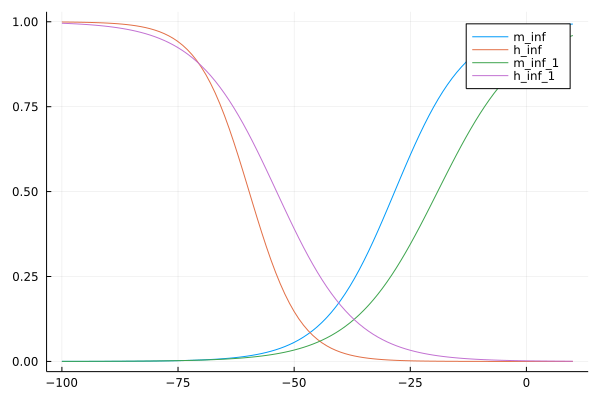

In [114]:
plot(v_m_range, m_inf_array, label="m_inf")
plot!(v_m_range, h_inf_array, label="h_inf")

plot!(v_m_range, m_inf_array_1, label="m_inf_1")
plot!(v_m_range, h_inf_array_1, label="h_inf_1")

In [ ]:
res1 = compare_optimizers(my_model; SearchRange = bounds, MaxTime = 1.0);

In [ ]:
60*20
